-------------------------
LIBRARIES
-------------------------

This notebook ingests BehaviorSpace CSVs and produces summary visuals used in the chapter.   
Where relevant, *od-duration* is interpreted as *time-to-stabilization* (OD end), i.e., the tick on which the OD stabilization detector triggered and the model transitioned to CA.

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import spearmanr, mannwhitneyu
import warnings
# warnings.filterwarnings('ignore')

# Style for consistent plotting
plt.style.use('default')
sns.set_palette("husl")
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['font.size'] = 11

print("Libraries loaded successfully")


Libraries loaded successfully


------------------------------------
A. SETUP AND HELPER FUNCTIONS
------------------------------------

In [23]:
def load_behaviorspace_csv(filename, skiprows=6):
    try:
        df = pd.read_csv(filename, skiprows=skiprows)
        df.columns = df.columns.str.strip().str.replace('[', '').str.replace(']', '')
        print(f"✓ Loaded {filename}: {len(df)} rows, {len(df.columns)} columns")
        return df
    except FileNotFoundError:
        print(f"✗ File not found: {filename}")
        return None
    except Exception as e:
        print(f"✗ Error loading {filename}: {e}")
        return None

def parse_ses_ratios(df, column_prefix, output_prefix=None):
    if column_prefix in df.columns:
        def safe_parse(val):
            try:
                if isinstance(val, list):
                    return val
                if isinstance(val, str):
                    parts = val.strip('[]').split()
                    return [float(p) for p in parts]
            except:
                return [None, None, None]
            return [None, None, None]

        parsed = df[column_prefix].apply(safe_parse)
        prefix = output_prefix if output_prefix else column_prefix

        df[f'{prefix}-low'] = parsed.apply(lambda x: x[0] if x else None)
        df[f'{prefix}-med'] = parsed.apply(lambda x: x[1] if x else None)
        df[f'{prefix}-high'] = parsed.apply(lambda x: x[2] if x else None)
    return df



-------------------------------
B. DATA LOADING AND CLEANING
-------------------------------

Datasets are loaded here including:
- All-scenarios is the aggregate of all scenarios in one and is used for cross-scenario comparisons
- Scenario-specific tables (Technocratic, Democratic, Populist, Authoritarian)
- Sensitivity sweeps: Population, Memory Decay, Network, Threshold (social-threshold), Adoption Rate, Shock robustness (multiple seeds)

In [24]:
print("\n=== LOADING BEHAVIORSPACE DATA ===")

experiment_files = {
    'all_scenarios': 'od-ca-combined AllScenarioRuns-table.csv',
    'technocratic': 'od-ca-combined Technocratic-table.csv',
    'democratic': 'od-ca-combined Democratic-table.csv',
    'populist': 'od-ca-combined Populist-table.csv',
    'authoritarian': 'od-ca-combined Authoritarian-table.csv',
    'population_sensitivity': 'od-ca-combined PopulationSensitivity-table.csv',
    'memory_sensitivity': 'od-ca-combined MemoryDecaySensitivity-table.csv',
    'network_sensitivity': 'od-ca-combined NetworkSensitivity-table.csv',
    'threshold_sensitivity': 'od-ca-combined ThresholdSensitivity-table.csv',
    'adoption_rate_sensitivity': 'od-ca-combined AdoptionRateSensitivity-table.csv',
    'shock_robustness': 'od-ca-combined ShockRobustness-table.csv'
}

datasets = {}
for exp_name, filename in experiment_files.items():
    datasets[exp_name] = load_behaviorspace_csv(filename)



=== LOADING BEHAVIORSPACE DATA ===
✓ Loaded od-ca-combined AllScenarioRuns-table.csv: 583109 rows, 27 columns
✓ Loaded od-ca-combined Technocratic-table.csv: 43172 rows, 28 columns
✓ Loaded od-ca-combined Democratic-table.csv: 51908 rows, 28 columns
✓ Loaded od-ca-combined Populist-table.csv: 57869 rows, 28 columns
✓ Loaded od-ca-combined Authoritarian-table.csv: 41083 rows, 28 columns
✓ Loaded od-ca-combined PopulationSensitivity-table.csv: 106039 rows, 25 columns
✓ Loaded od-ca-combined MemoryDecaySensitivity-table.csv: 129436 rows, 26 columns
✓ Loaded od-ca-combined NetworkSensitivity-table.csv: 103453 rows, 26 columns
✓ Loaded od-ca-combined ThresholdSensitivity-table.csv: 150098 rows, 26 columns
✓ Loaded od-ca-combined AdoptionRateSensitivity-table.csv: 99583 rows, 24 columns
✓ Loaded od-ca-combined ShockRobustness-table.csv: 198941 rows, 24 columns


In [25]:
print("\n--- Data Confirmation ---")
for name, df in datasets.items():
    if df is not None:
        print(f"{name}: {len(df)} rows")
        if 'political-scenario' in df.columns:
            print(f"  Scenarios: {df['political-scenario'].value_counts().to_dict()}")
        print(f"  Key metrics available: {[col for col in df.columns if 'rate-' in col]}")
    print()


--- Data Confirmation ---
all_scenarios: 583109 rows
  Scenarios: {'Populist-Skeptical': 174187, 'Democratic-Optional': 158349, 'Technocratic-India': 128282, 'Authoritarian-Enforced': 122291}
  Key metrics available: ['rate-enrollment', 'rate-resistance', 'rate-undecided']

technocratic: 43172 rows
  Scenarios: {'Technocratic-India': 43172}
  Key metrics available: ['rate-enrollment', 'rate-resistance', 'rate-undecided']

democratic: 51908 rows
  Scenarios: {'Democratic-Optional': 51908}
  Key metrics available: ['rate-enrollment', 'rate-resistance', 'rate-undecided']

populist: 57869 rows
  Scenarios: {'Populist-Skeptical': 57869}
  Key metrics available: ['rate-enrollment', 'rate-resistance', 'rate-undecided']

authoritarian: 41083 rows
  Scenarios: {'Authoritarian-Enforced': 41083}
  Key metrics available: ['rate-enrollment', 'rate-resistance', 'rate-undecided']

population_sensitivity: 106039 rows
  Scenarios: {'Technocratic-India': 106039}
  Key metrics available: ['rate-enrollme

2. SCENARIO COMPARISON ANALYSIS

In [26]:
print("--- SCENARIO VISUALISATIONS ---")

df_scenarios = datasets['all_scenarios']
if df_scenarios is not None:
    key_metrics = [
        'rate-enrollment', 'rate-resistance', 'rate-undecided',
        'opinion-polarization', 'current-institutional-credibility',
        'od-duration', 'avg-trust', 'avg-surveillance',
        'avg-inclusion', 'cascade-size', 'network-density'
    ]

    available_metrics = [metric for metric in key_metrics if metric in df_scenarios.columns]
    print(f"Available metrics for analysis: {available_metrics}")


--- SCENARIO VISUALISATIONS ---
Available metrics for analysis: ['rate-enrollment', 'rate-resistance', 'rate-undecided', 'opinion-polarization', 'current-institutional-credibility', 'od-duration', 'avg-trust', 'avg-surveillance', 'avg-inclusion', 'cascade-size', 'network-density']


In [27]:
# For enrollment ratios
df_final = parse_ses_ratios(df_scenarios, column_prefix='ses-breakdown-enrollment', output_prefix='enrolled')
# For resistance ratios
df_final = parse_ses_ratios(df_scenarios, column_prefix='ses-breakdown-resistance', output_prefix='resisted')
# For undecided ratios
df_final = parse_ses_ratios(df_scenarios, column_prefix='ses-breakdown-undecided', output_prefix='undecided')

ses_action_cols = [
    'enrolled-low', 'resisted-low', 'undecided-low',
    'enrolled-med', 'resisted-med', 'undecided-med',
    'enrolled-high', 'resisted-high', 'undecided-high'
]

-------------------------------
C. SCENARIO ANALYSIS
-------------------------------

~~
1. BASELINE SCENARIO - TECHNOCRATIC

Plotting the data for Technocratic-India only.  
The output visualizations provide an overview of baseline opinion dynamics and adoption trajectories before comparing against alternative scenarios.

These  illustrate:
- OD convergence of opinions
- Transition from OD to CA transition (seen as shifts in action-state rates), and
- Early CA cascades/resistance.

**Note:** ticks are abstract interaction cycles; we interpret *od-duration* as *time-to-stabilization*. The distribution of *od-duration* is summarized for the baseline to show how long OD typically runs before CA begins.

In [28]:
# Baseline

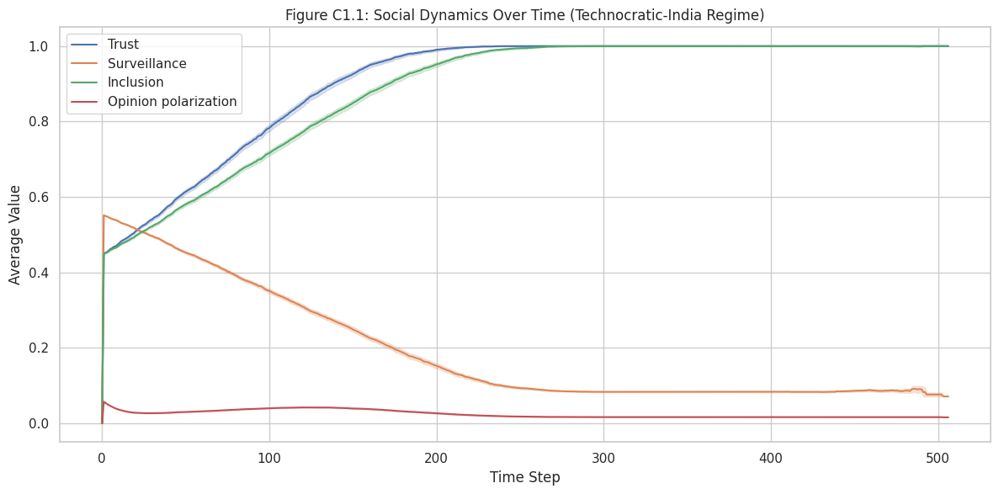

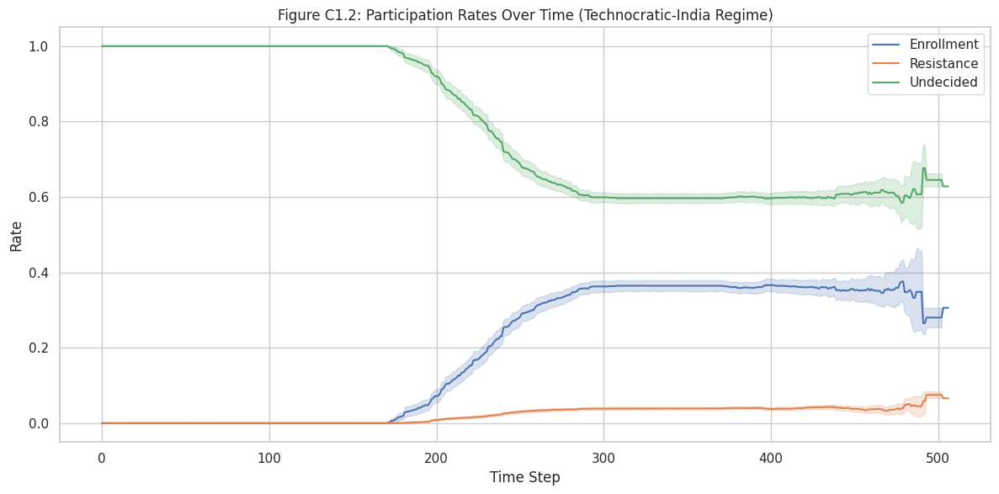

<Figure size 1200x600 with 0 Axes>

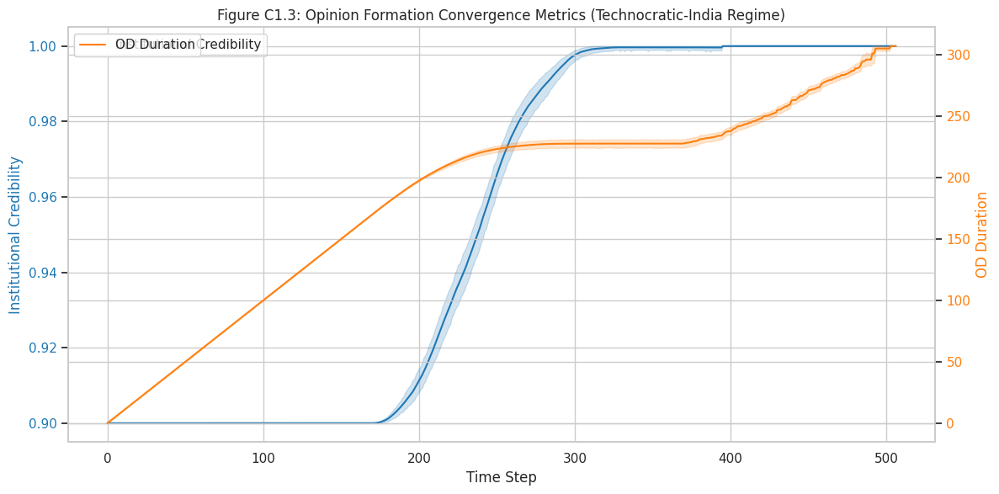

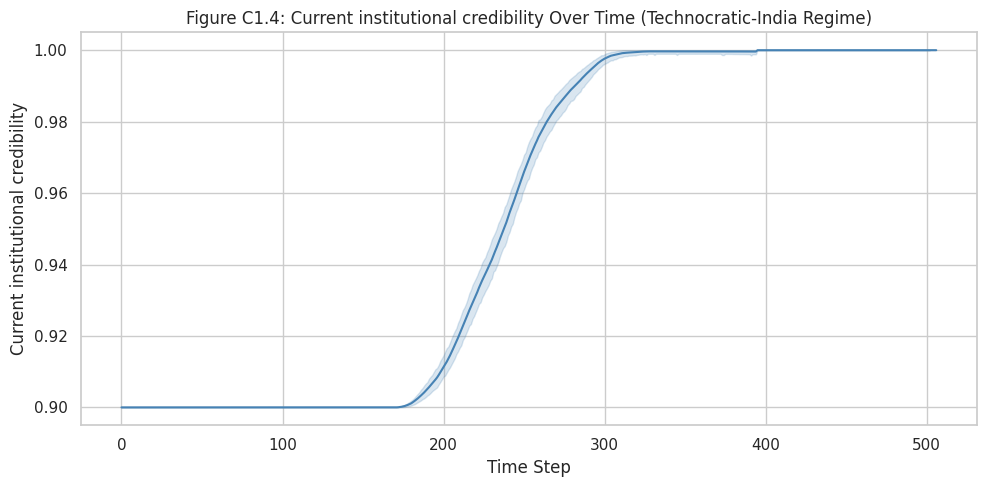

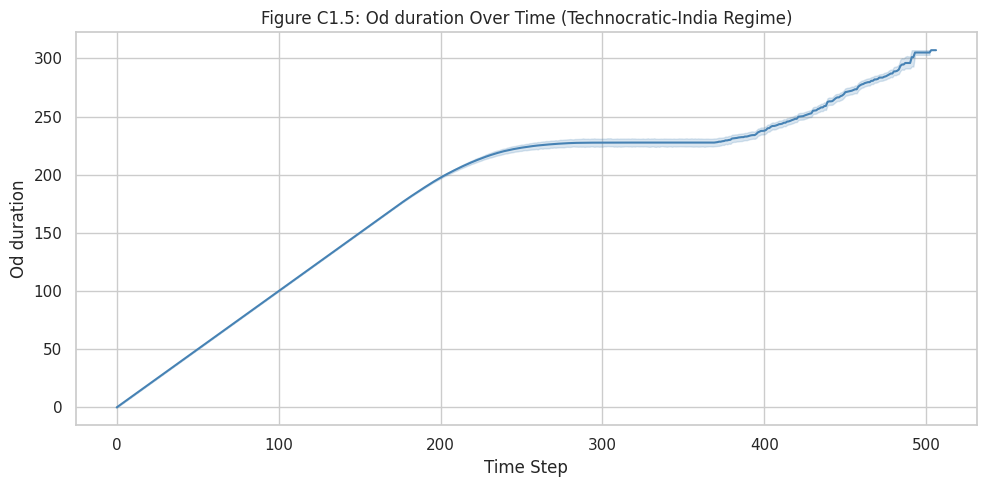

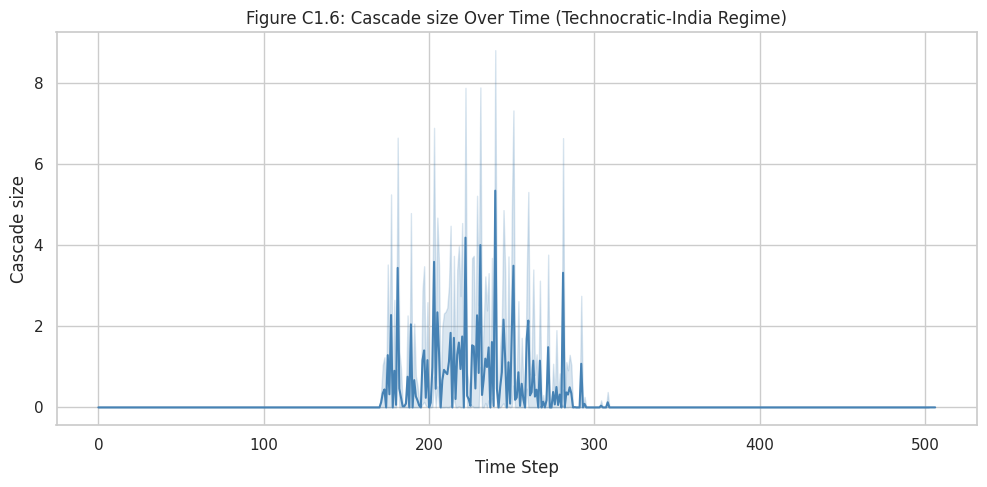

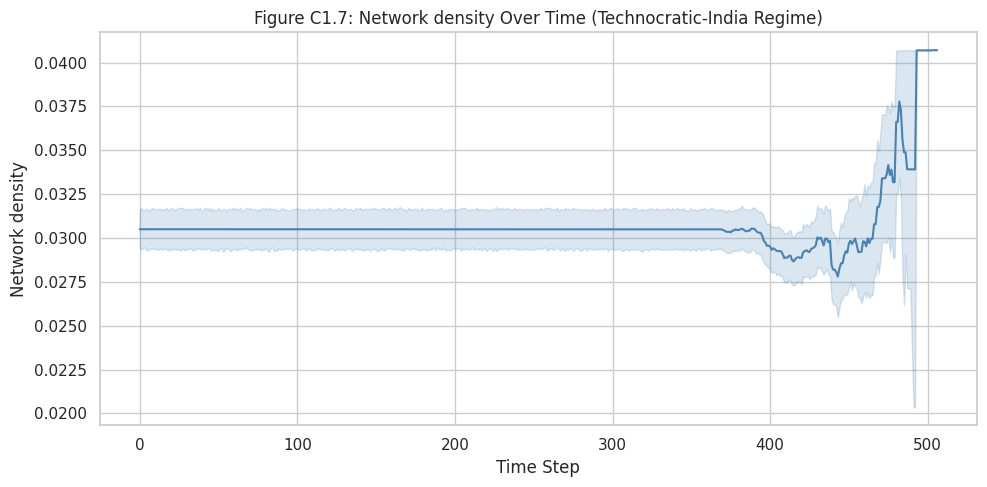

In [29]:
baseline_df = datasets['all_scenarios'][datasets['all_scenarios']['political-scenario'] == "Technocratic-India"]

social_dynamics = ['avg-trust', 'avg-surveillance', 'avg-inclusion', 'opinion-polarization']
participation_rates = ['rate-enrollment', 'rate-resistance', 'rate-undecided']
metric_convergence = ['current-institutional-credibility', 'od-duration']

available_social = [metric for metric in social_dynamics if metric in available_metrics]
available_rates = [metric for metric in participation_rates if metric in available_metrics]
available_convergence = [metric for metric in metric_convergence if metric in available_metrics]

# Social Dynamics Plot
if available_social:
    plt.figure(figsize=(12, 6))
    for metric in available_social:
        sns.lineplot(data=baseline_df, x='step', y=metric, label=metric.replace('-', ' ').replace('avg ', '').capitalize(), estimator='mean')
    plt.title("Figure C1.1: Social Dynamics Over Time (Technocratic-India Regime)")
    plt.xlabel("Time Step")
    plt.ylabel("Average Value")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Participation Rates Plot
if available_rates:
    plt.figure(figsize=(12, 6))
    for metric in available_rates:
        sns.lineplot(data=baseline_df, x='step', y=metric, label=metric.replace('-', ' ').replace('rate ', '').capitalize(), estimator='mean')
    plt.title("Figure C1.2: Participation Rates Over Time (Technocratic-India Regime)")
    plt.xlabel("Time Step")
    plt.ylabel("Rate")
    plt.legend()
    plt.tight_layout()
    plt.show()

# OD Convergence Plot
    if available_convergence:
        plt.figure(figsize=(12, 6))
        if len(available_convergence) == 2:
            fig, axis1 = plt.subplots(figsize=(12, 6))

            if 'current-institutional-credibility' in available_convergence:
                color = 'tab:blue'
                axis1.set_xlabel('Time Step')
                axis1.set_ylabel('Institutional Credibility', color=color)
                sns.lineplot(data=baseline_df, x='step', y='current-institutional-credibility',
                           estimator='mean', ax=axis1, color=color, label='Institutional Credibility')
                axis1.tick_params(axis='y', labelcolor=color)

            if 'od-duration' in available_convergence:
                axis2 = axis1.twinx()
                color = 'tab:orange'
                axis2.set_ylabel('OD Duration', color=color)
                sns.lineplot(data=baseline_df, x='step', y='od-duration',
                           estimator='mean', ax=axis2, color=color, label='OD Duration')
                axis2.tick_params(axis='y', labelcolor=color)

            plt.title("Figure C1.3: Opinion Formation Convergence Metrics (Technocratic-India Regime)")
        else:
            for metric in available_convergence:
                sns.lineplot(data=baseline_df, x='step', y=metric,
                           label=metric.replace('-', ' ').replace('current ', '').replace('od ', '').capitalize(),
                           estimator='mean')
            plt.title("Figure C1.3: Opinion Formation Convergence Metrics (Technocratic-India Regime)")
            plt.xlabel("Time Step")
            plt.ylabel("Value")
            plt.legend()

        plt.tight_layout()
        plt.show()


# Plots for Remaining Key Metrics
other_metrics = [m for m in available_metrics if m not in available_social and m not in available_rates]

for i, metric in enumerate(other_metrics, start=4):
    plt.figure(figsize=(10, 5))
    sns.lineplot(data=baseline_df, x='step', y=metric, estimator='mean', color='steelblue')
    plt.title(f"Figure C1.{i}: {metric.replace('-', ' ').capitalize()} Over Time (Technocratic-India Regime)")
    plt.xlabel("Time Step")
    plt.ylabel(metric.replace('-', ' ').capitalize())
    plt.tight_layout()
    plt.show()

~~
2. COMPARATIVE SCENARIO ANALYSIS

Comparison of outcomes across scenarios (Authoritarian, Technocratic, Democratic, Populist).  
Key reporters: `rate-enrollment`, `rate-resistance`, `rate-undecided`, `avg-trust`, `avg-surveillance`, `avg-inclusion`, and `od-duration` (time-to-stabilization).

These summaries correspond to the tables and information in the chapter 4.

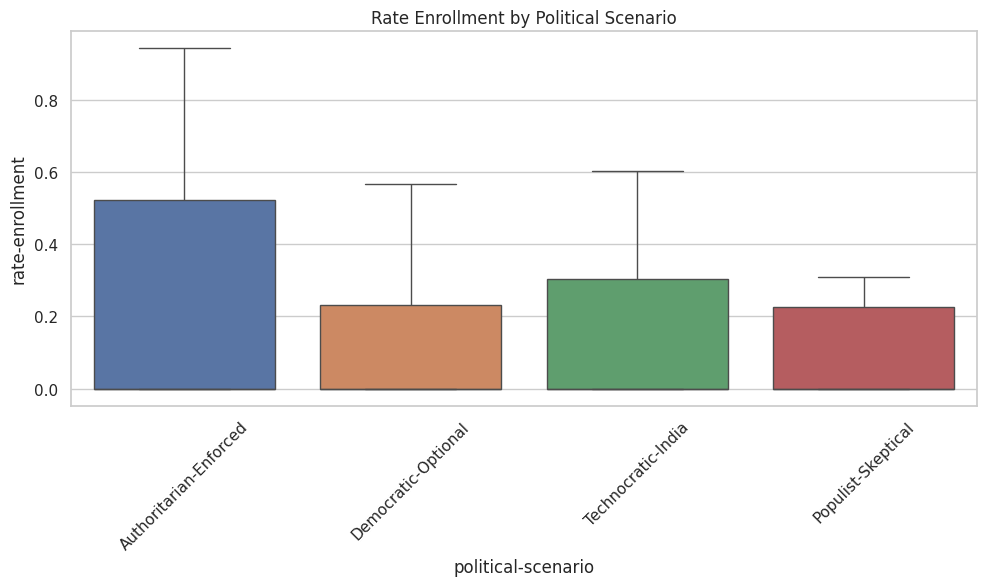

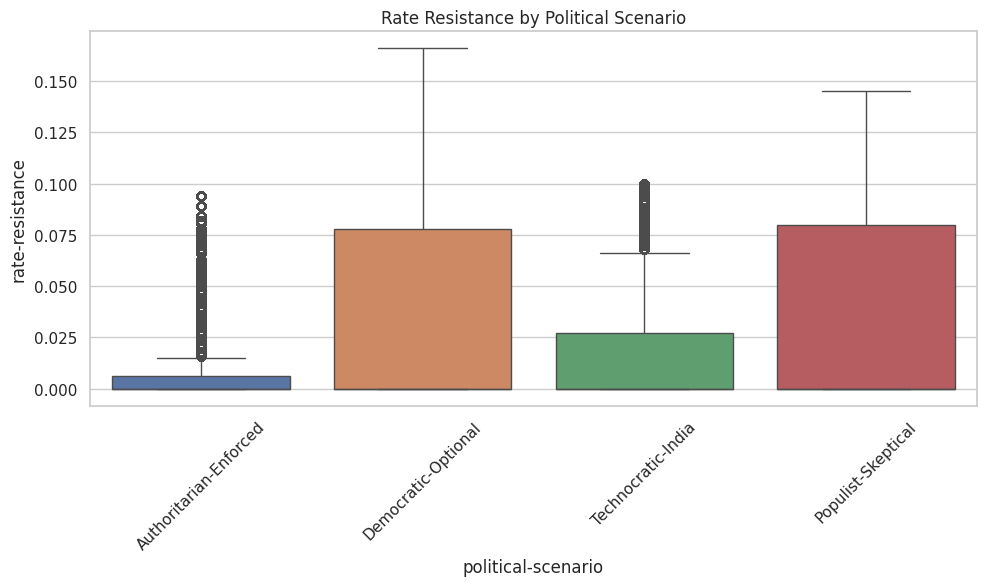

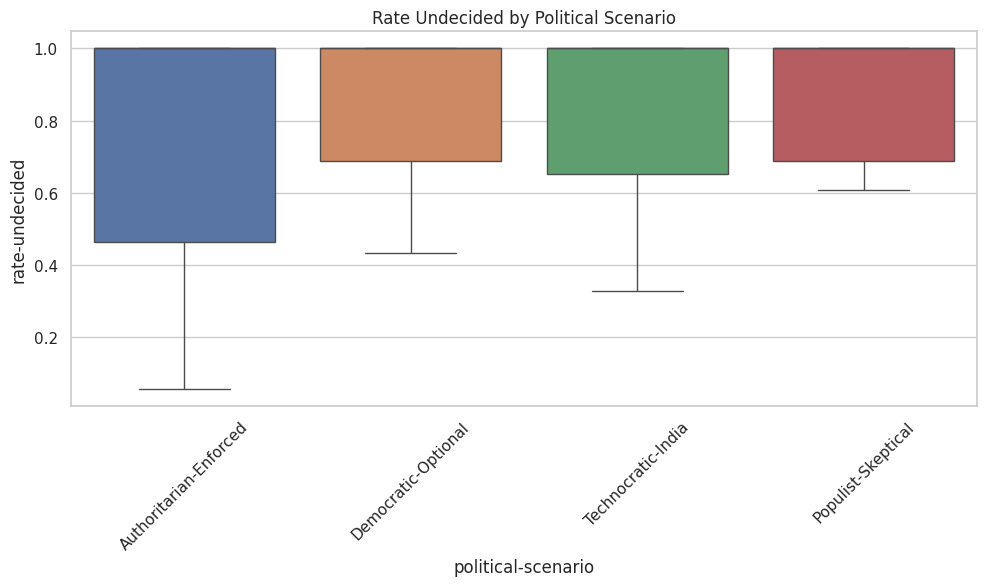

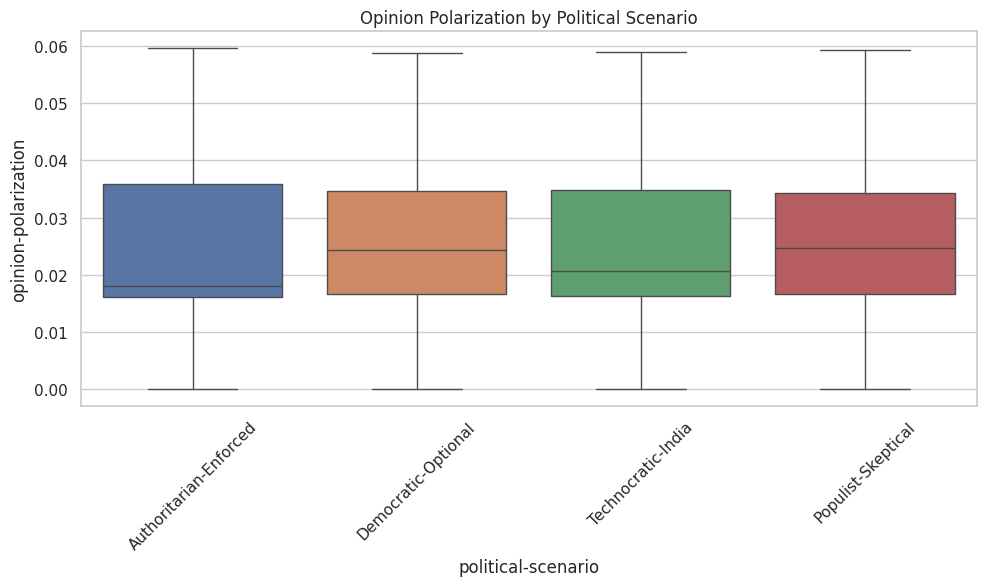

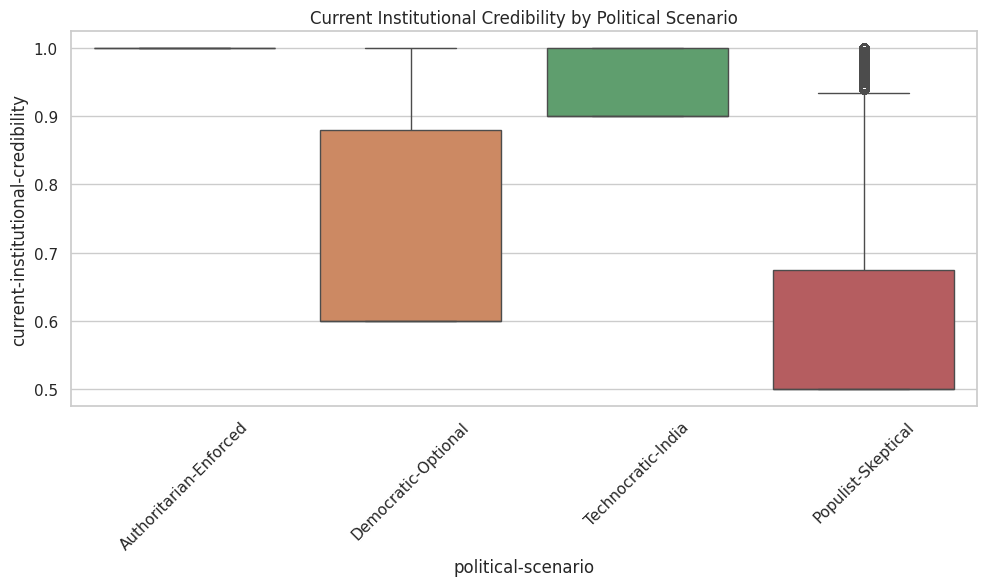

...

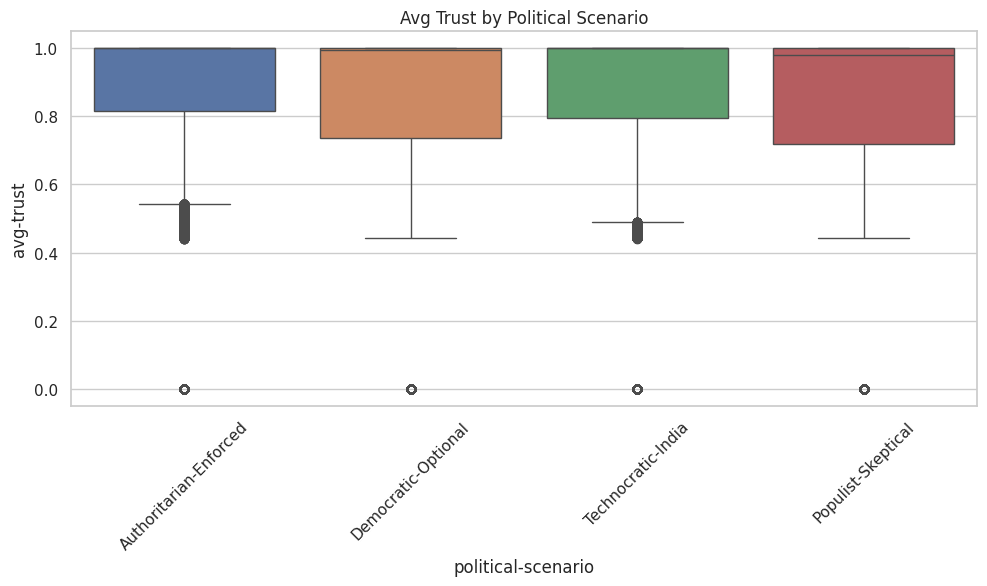

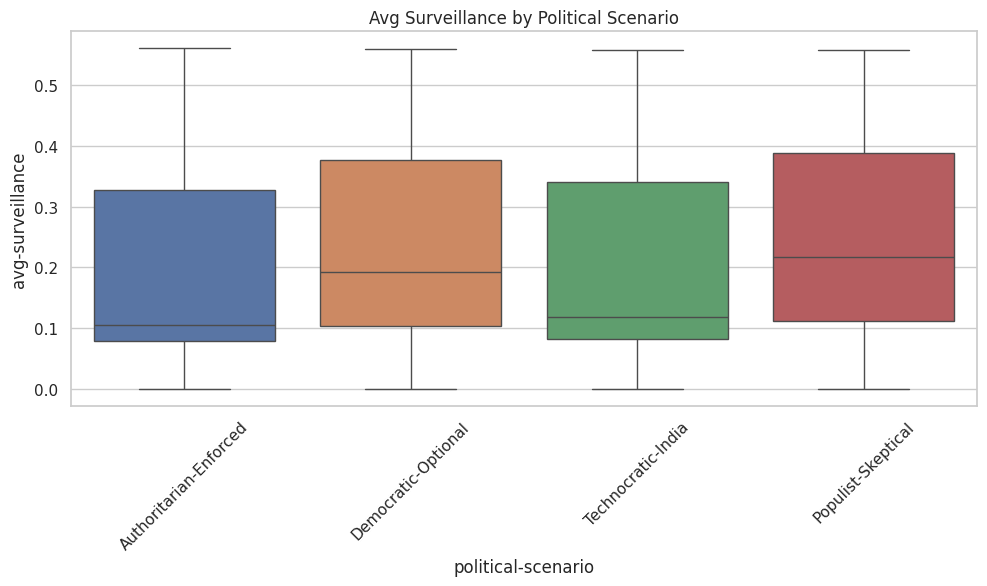

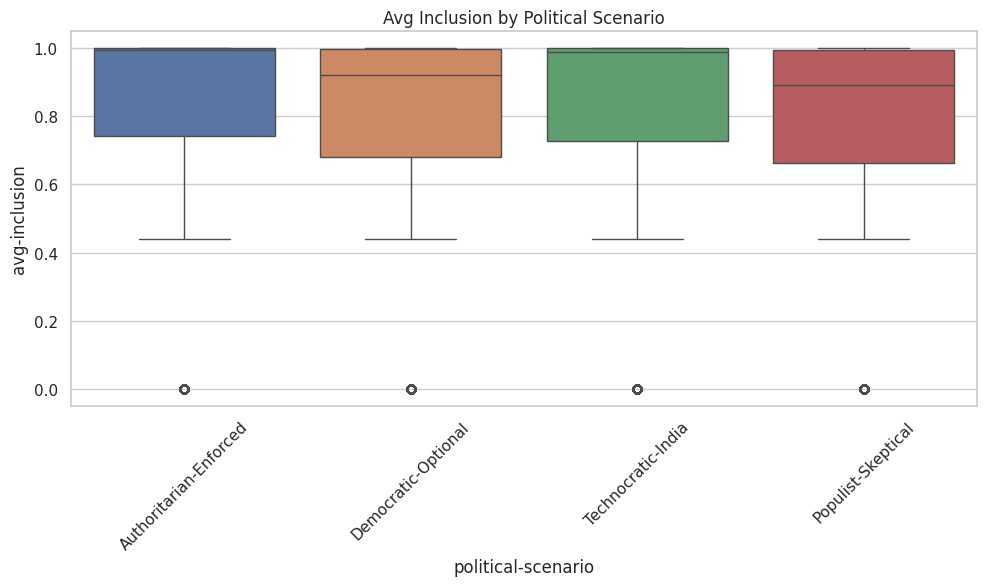

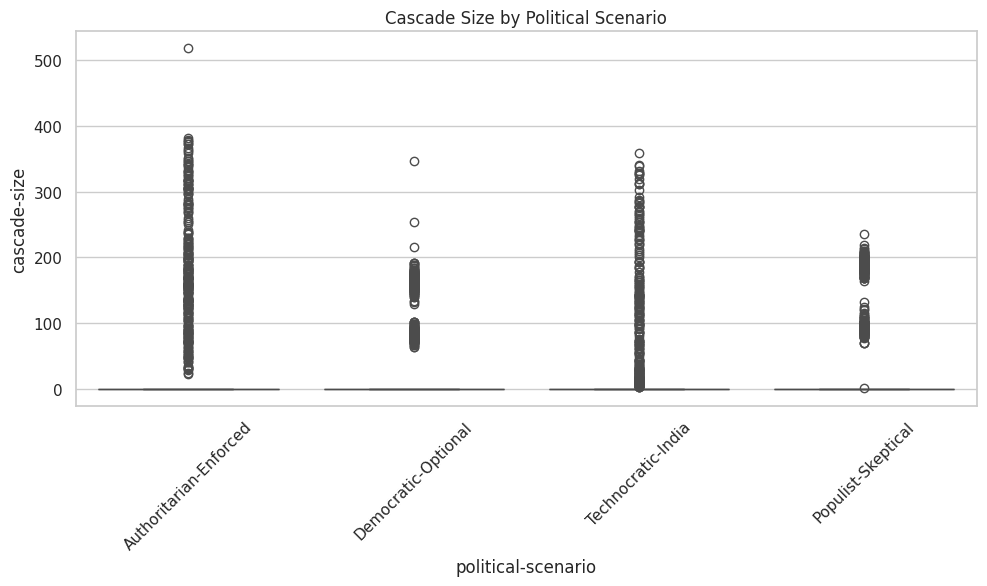

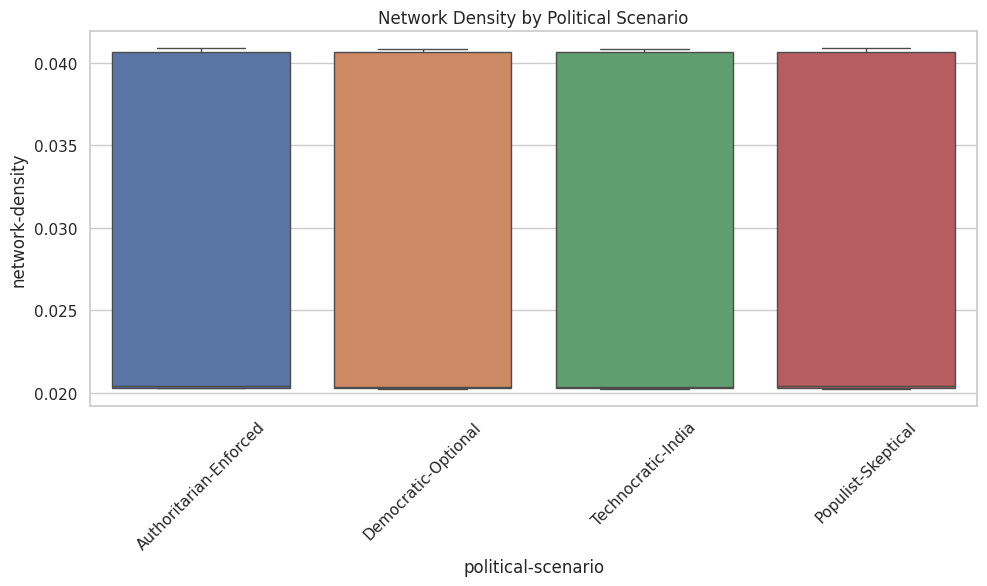


=== C2.1.1: OUTCOME INDICATORS BY SCENARIO ===
                       rate-enrollment        rate-resistance         \
                                  mean    std            mean    std   
political-scenario                                                     
Authoritarian-Enforced           0.234  0.253           0.009  0.019   
Democratic-Optional              0.091  0.118           0.031  0.041   
Populist-Skeptical               0.081  0.112           0.030  0.042   
Technocratic-India               0.170  0.202           0.018  0.030   

                       rate-undecided        opinion-polarization         \
                                 mean    std                 mean    std   
political-scenario                                                         
Authoritarian-Enforced          0.757  0.261                0.026  0.012   
Democratic-Optional             0.879  0.157                0.026  0.010   
Populist-Skeptical              0.889  0.154                0.026  

In [30]:
# Summary statistics by scenario - Boxplot of Outcome Indicators by Scenario (RQ 1.1)
for metric in available_metrics:
    if metric in df_scenarios.columns:
        sns.boxplot(data=df_scenarios, x='political-scenario', y=metric, hue='political-scenario')
        plt.title(f'{metric.replace("-", " ").title()} by Political Scenario')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

summary_metrics = [
    'rate-enrollment', 'rate-resistance', 'rate-undecided',
    'opinion-polarization', 'avg-trust', 'avg-surveillance',
    'avg-inclusion', 'od-duration', 'network-density'
]

existing_summary_metrics = [m for m in summary_metrics if m in df_scenarios.columns]

# Summary stats: mean and std by scenario
scenario_summary = df_scenarios.groupby('political-scenario')[existing_summary_metrics].agg(['mean', 'std']).round(3)
print("\n=== C2.1.1: OUTCOME INDICATORS BY SCENARIO ===")
print(scenario_summary)

In [31]:
# Individual Scenario Analysis
scenario_insights = {}

for scenario in df_scenarios['political-scenario'].unique():
    df_scenario = df_scenarios[df_scenarios['political-scenario'] == scenario]
    insights = {}

    for metric in existing_summary_metrics:
        if metric in df_scenario.columns:
            insights[f'{metric}_mean'] = df_scenario[metric].mean()
            insights[f'{metric}_std'] = df_scenario[metric].std()

    scenario_insights[scenario] = insights

# Print each scenario's summary
print("\n=== C2.1.2 INDIVIDUAL SCENARIO ANALYSIS ===")
# for scenario, metrics in scenario_insights.items():
#     print(f"\n{scenario}:")
#     for name, value in metrics.items():
#         print(f"  {name}: {value:.3f}")



=== C2.1.2 INDIVIDUAL SCENARIO ANALYSIS ===


In [32]:
# Cross-Scenario Comparative Insights
comparison_metrics = [
    'rate-enrollment_mean', 'rate-resistance_mean', 'rate-undecided_mean',
    'opinion-polarization_mean', 'avg-trust_mean', 'avg-inclusion_mean',
    'avg-surveillance_mean', 'time-to-stabilization_mean', 'network-density_mean'
]

for metric in comparison_metrics:
    metric_clean = metric.replace('_mean', '')
    print(f"\n RANKING: {metric_clean.replace('-', ' ').capitalize()}")
    metric_dict = {
        scenario: values.get(metric, np.nan)
        for scenario, values in scenario_insights.items()
    }
    sorted_metric = sorted(metric_dict.items(), key=lambda x: x[1], reverse=True)
    for i, (scenario, value) in enumerate(sorted_metric, 1):
        print(f"  {i}. {scenario}: {value:.3f}")


print("\n=== C2.1.3: SCENARIO STABILITY (Standard Deviations) ===")

stability_metrics = [
    'rate-enrollment_std', 'rate-resistance_std', 'opinion-polarization_std',
    'avg-trust_std', 'avg-inclusion_std', 'avg-surveillance_std'
]

for metric in stability_metrics:
    metric_clean = metric.replace('_std', '')
    print(f"\n VARIATION IN: {metric_clean.replace('-', ' ').capitalize()}")

    std = {
        scenario: insights.get(metric, np.nan)
        for scenario, insights in scenario_insights.items()
    }
    sorted_std = dict(sorted(std.items(), key=lambda x: x[1]))

    for i, (scenario, value) in enumerate(sorted_std.items(), 1):
        print(f"  {i}. {scenario}: std = {value:.3f}")



 RANKING: Rate enrollment
  1. Authoritarian-Enforced: 0.234
  2. Technocratic-India: 0.170
  3. Democratic-Optional: 0.091
  4. Populist-Skeptical: 0.081

 RANKING: Rate resistance
  1. Democratic-Optional: 0.031
  2. Populist-Skeptical: 0.030
  3. Technocratic-India: 0.018
  4. Authoritarian-Enforced: 0.009

 RANKING: Rate undecided
  1. Populist-Skeptical: 0.889
  2. Democratic-Optional: 0.879
  3. Technocratic-India: 0.812
  4. Authoritarian-Enforced: 0.757

 RANKING: Opinion polarization
  1. Democratic-Optional: 0.026
  2. Populist-Skeptical: 0.026
  3. Authoritarian-Enforced: 0.026
  4. Technocratic-India: 0.026

 RANKING: Avg trust
  1. Authoritarian-Enforced: 0.892
  2. Technocratic-India: 0.887
  3. Democratic-Optional: 0.867
  4. Populist-Skeptical: 0.858

 RANKING: Avg inclusion
  1. Authoritarian-Enforced: 0.868
  2. Technocratic-India: 0.861
  3. Democratic-Optional: 0.835
  4. Populist-Skeptical: 0.823

 RANKING: Avg surveillance
  1. Populist-Skeptical: 0.256
  2. Demo

~~

Comparative Dynamics.

This section parallels the baseline visualization but overlays all scenarios. It highlights regime-specific differences in stabilization, resistance, and clustering of action-states. It shows how outcome variables evolve in each scenario.


=== TIME SERIES BY SCENARIO ===


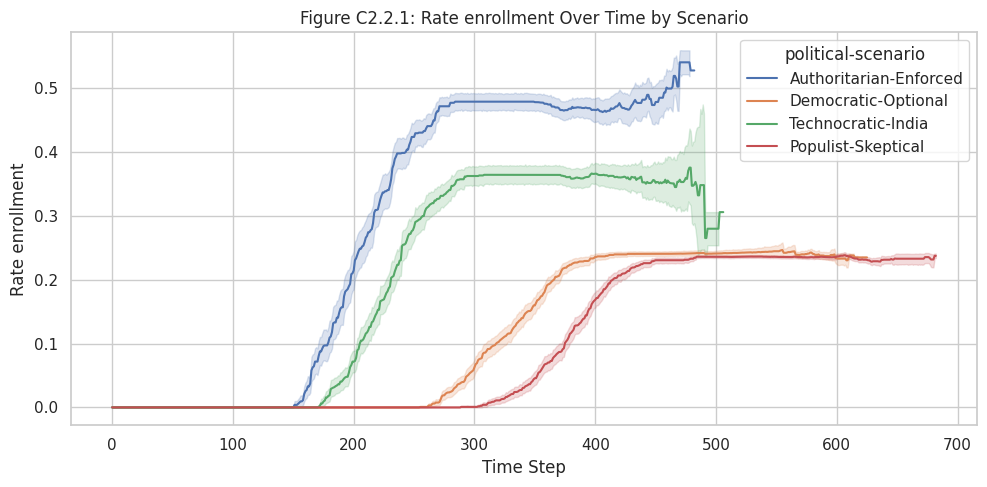

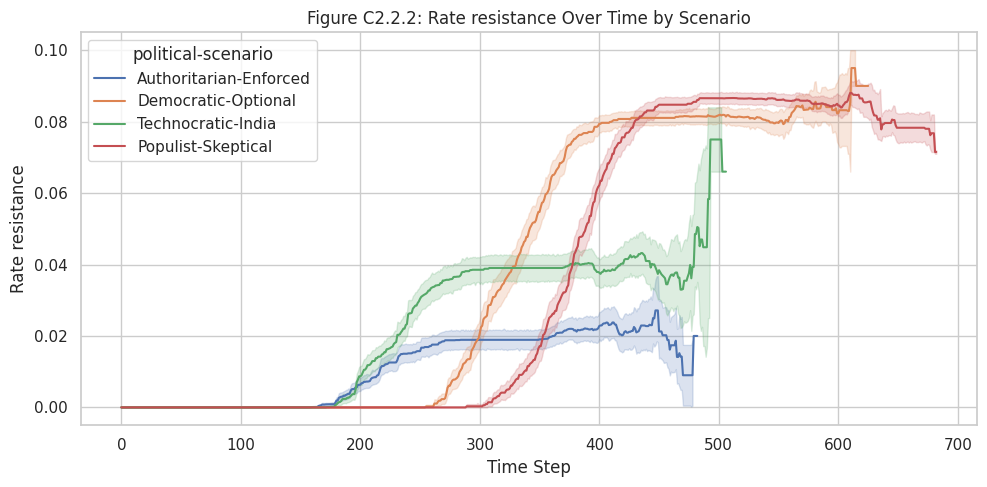

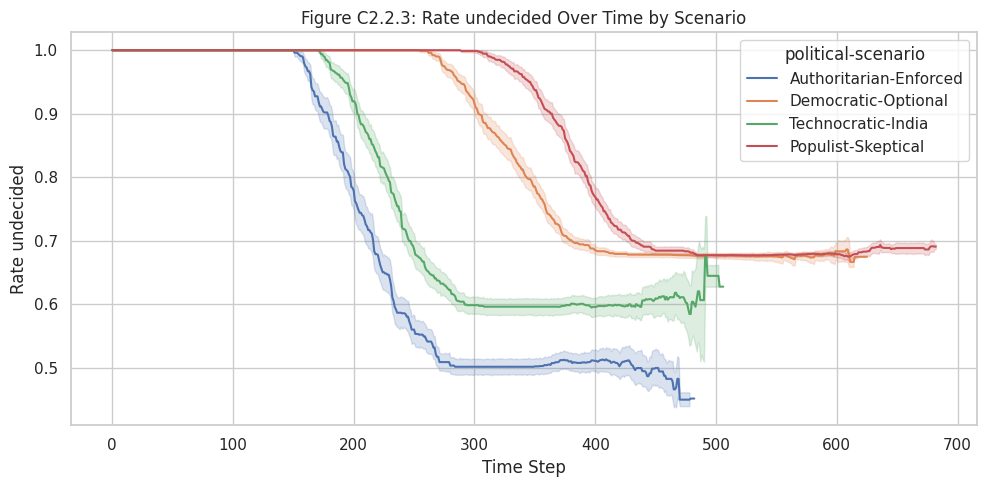

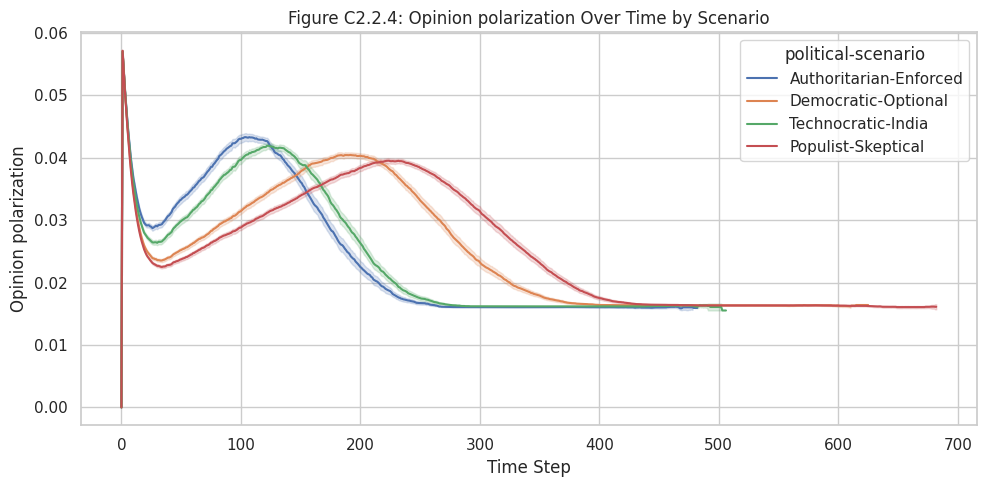

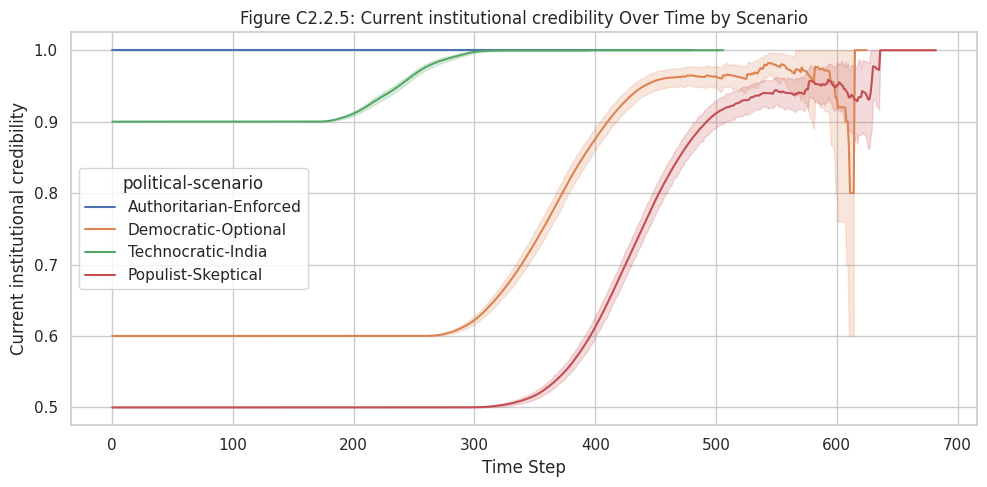

...

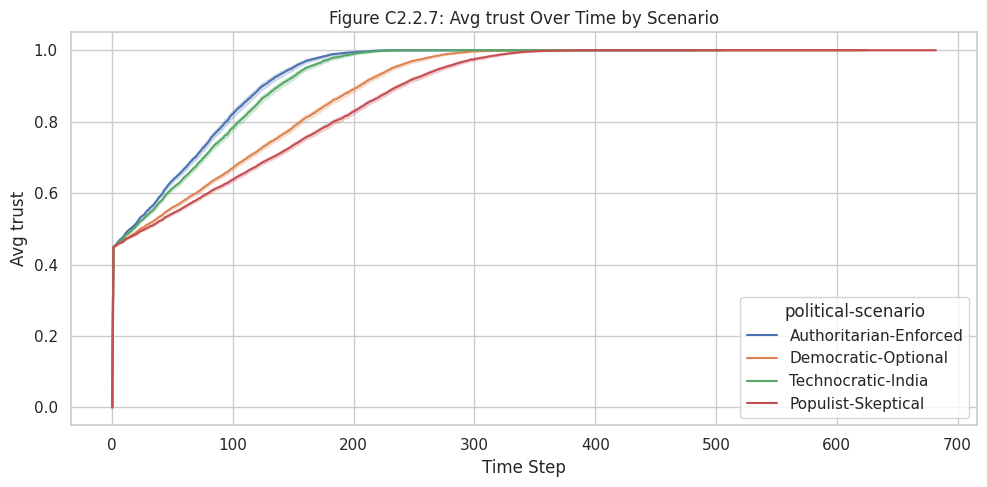

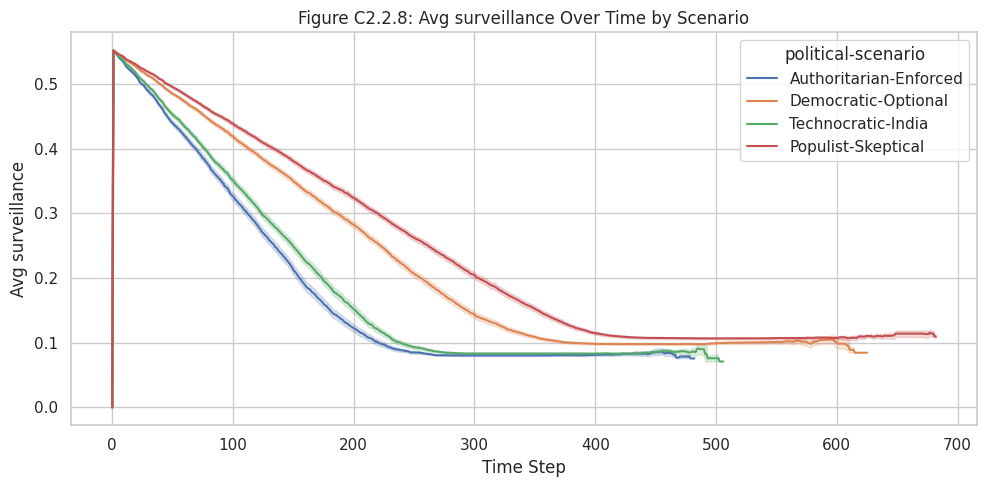

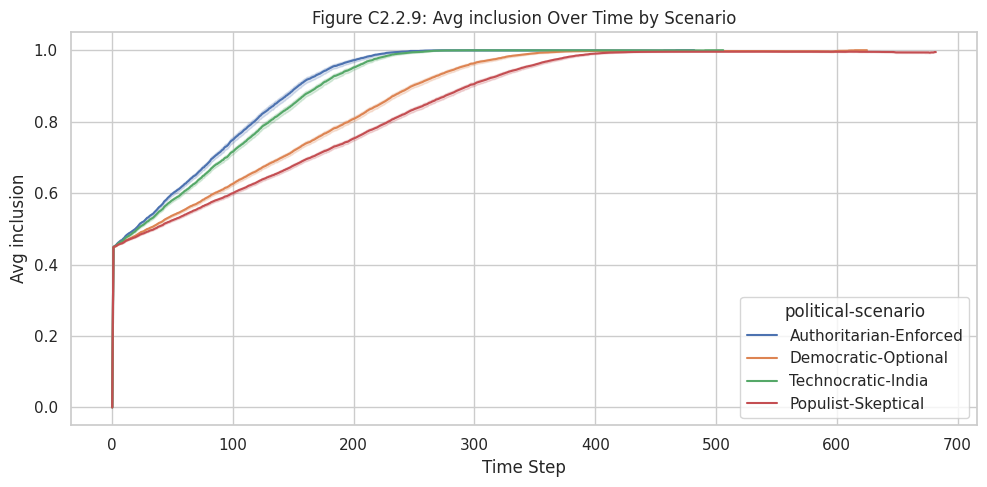

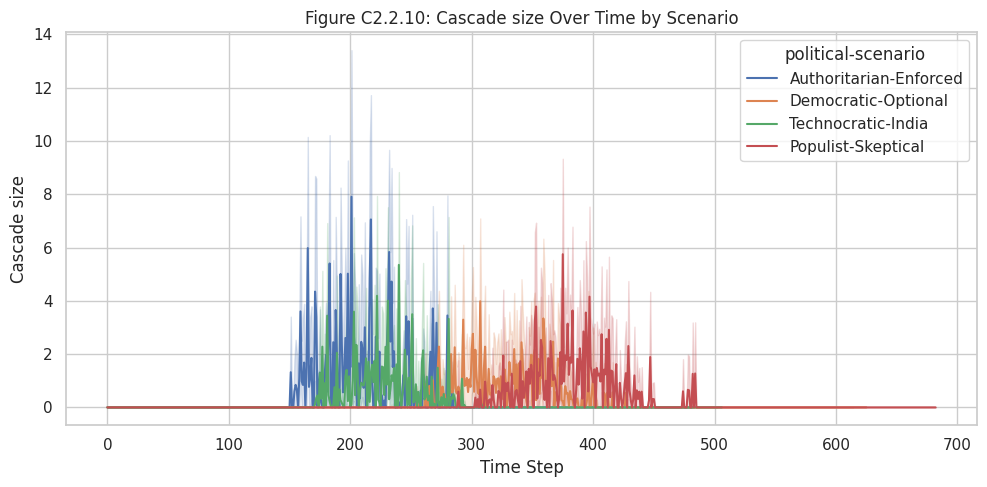

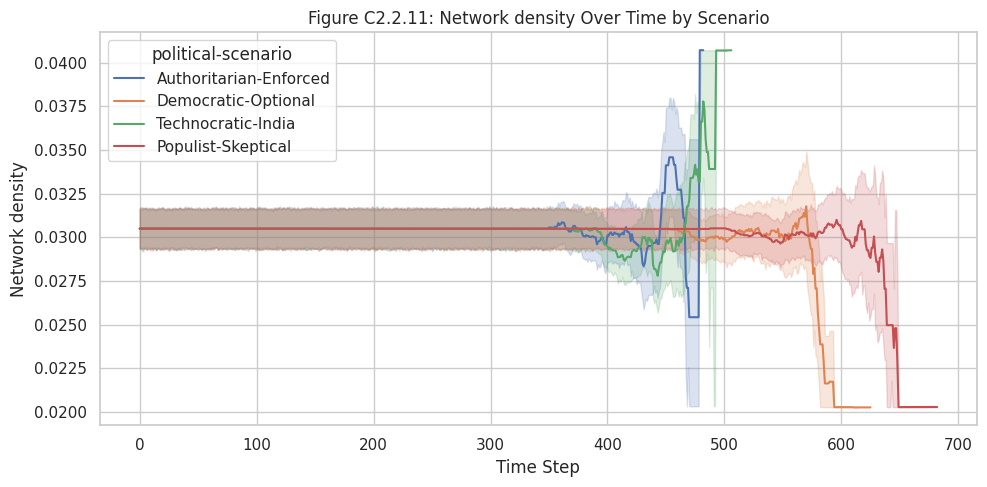

In [33]:
#  Line Plot (Time Series) by Scenario (Evolution of opinions over time) (RQ 1.2)
print("\n=== TIME SERIES BY SCENARIO ===")
for i, metric in enumerate(available_metrics, start=1):
    if metric in df_scenarios.columns:
        plt.figure(figsize=(10, 5))
        sns.lineplot(data=df_scenarios, x='step', y=metric, hue='political-scenario', estimator='mean')
        plt.title(f"Figure C2.2.{i}: {metric.replace('-', ' ').capitalize()} Over Time by Scenario")
        plt.xlabel("Time Step")
        plt.ylabel(metric.replace('-', ' ').capitalize())
        plt.tight_layout()
        plt.show()

~~

Surveillance by Inclusion (Coloured by Trust) plots the relationship between perceived inclusion and surveillance concerns, with trust as the colour dimension. This helps visualize whether scenarios with higher trust generally show higher inclusion confidence and lower fear of surveillance.

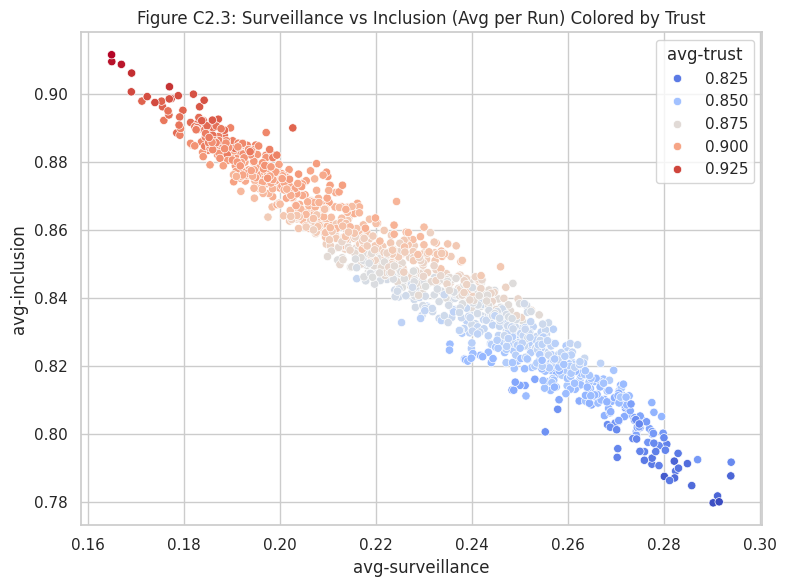

In [34]:
# Scatterplot: Surveillance vs Inclusion, colored by Trust (RQ 1.3)
# Average across runs for each timestep
df_avg = df_scenarios.groupby('run number')[['avg-surveillance', 'avg-inclusion', 'avg-trust']].mean().reset_index()

plt.figure(figsize=(8,6))
sns.scatterplot(data=df_avg, x='avg-surveillance', y='avg-inclusion', hue='avg-trust', palette='coolwarm')
plt.title("Figure C2.3: Surveillance vs Inclusion (Avg per Run) Colored by Trust")
plt.tight_layout()
plt.show()

~~

Population Proportion by Action State.

This shows how the distribution of enrolled, resisted, and undecided agents changes over time across scenarios.

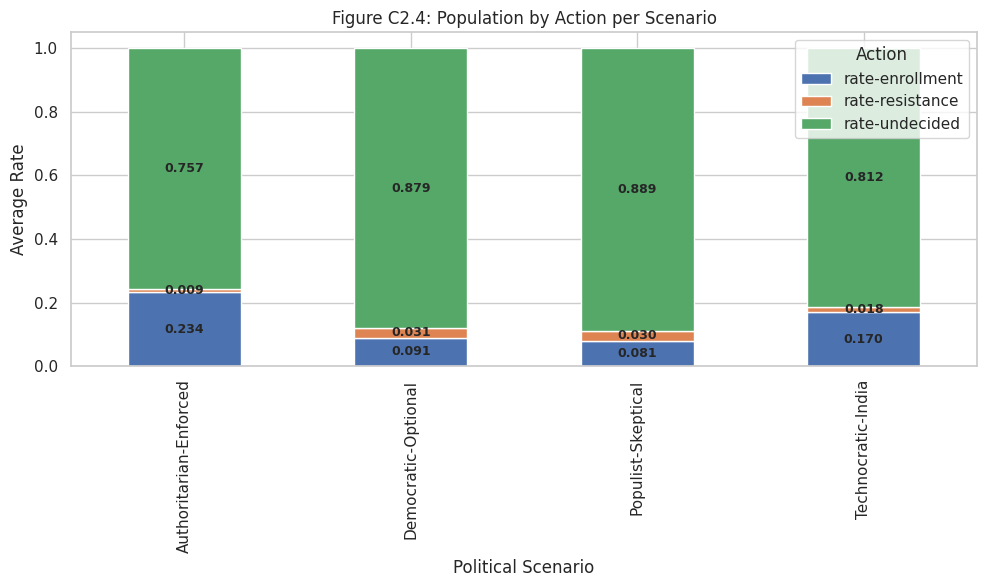

In [36]:
# Population by Action by Scenario (RQ 1.4)
# Bar plot of average action rates by political scenario
scenario_grouped = df_scenarios.groupby('political-scenario')[['rate-enrollment', 'rate-resistance', 'rate-undecided']].mean().reset_index()
axis = scenario_grouped.set_index('political-scenario').plot(kind='bar', stacked=True, figsize=(10,6))
plt.title("Figure C2.4: Population by Action per Scenario")
plt.ylabel("Average Rate")
plt.xlabel("Political Scenario")
plt.legend(title="Action")

for container in axis.containers:
    heights = [bar.get_height() for bar in container]

    labels = [f'{height:.3f}' if height > 0.001 else '' for height in heights]
    axis.bar_label(container, labels=labels, label_type='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()



~~

KDEs reveal the distribution and clustering of opinions within each scenario, identifying polarization or consensus formation.

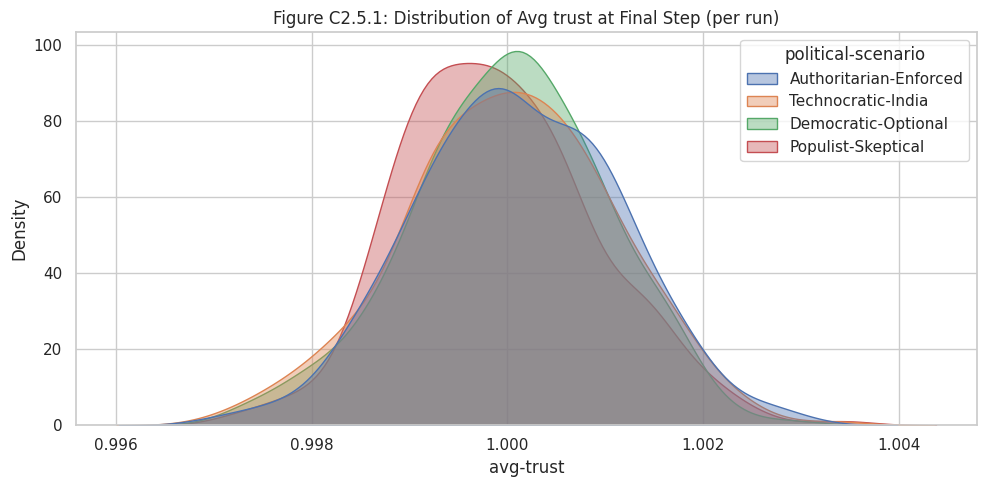

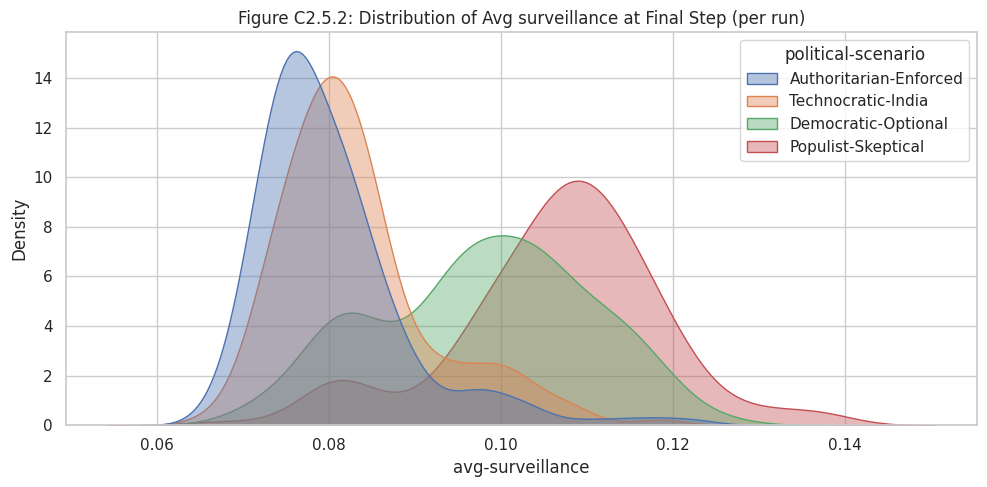

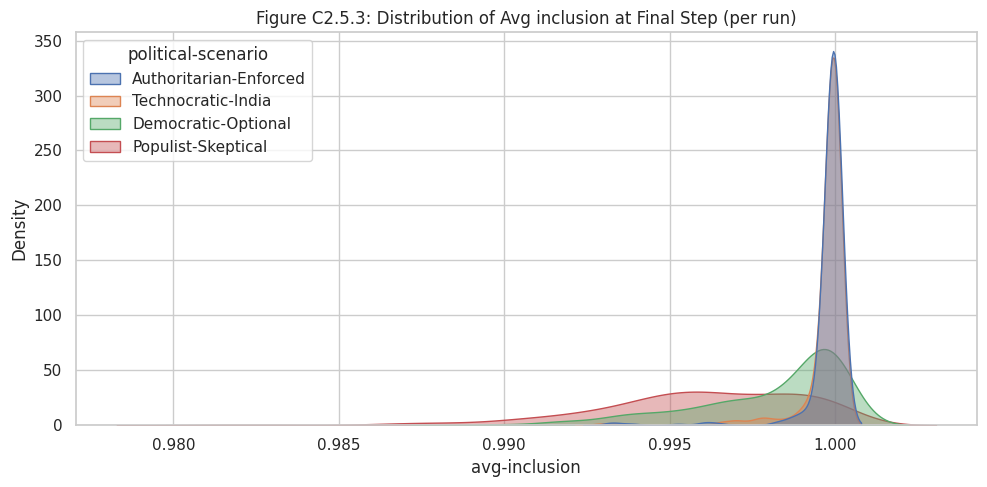

In [37]:
# KDE Plot of Final Values by Scenario (RQ 1.4?)
# Get final step per run (not per scenario)
time_metrics = ['avg-trust', 'avg-surveillance', 'avg-inclusion']
df_final_per_run = df_scenarios.sort_values('step').groupby(['political-scenario', 'run number']).tail(1)

for i, metric in enumerate(time_metrics, start=1):
    if metric in df_final_per_run.columns:
        df_plot = df_final_per_run[['political-scenario', metric]].dropna()

        if df_plot[metric].nunique() == 1:
            df_plot[metric] += np.random.normal(0, 0.001, size=len(df_plot))

        plt.figure(figsize=(10, 5))
        if df_plot[metric].nunique() > 1:
            sns.kdeplot(data=df_plot, x=metric, hue='political-scenario', fill=True, alpha=0.4)
        else:
            sns.histplot(data=df_plot, x=metric, hue='political-scenario', bins=5)

        plt.title(f"Figure C2.5.{i}: Distribution of {metric.replace('-', ' ').capitalize()} at Final Step (per run)")
        plt.tight_layout()
        plt.show()


~~

In [38]:
# RQ 2

The Correlation heatmap displays correlations among all reporters, particularly relationships between opinions, adoption, resistance, and credibility.

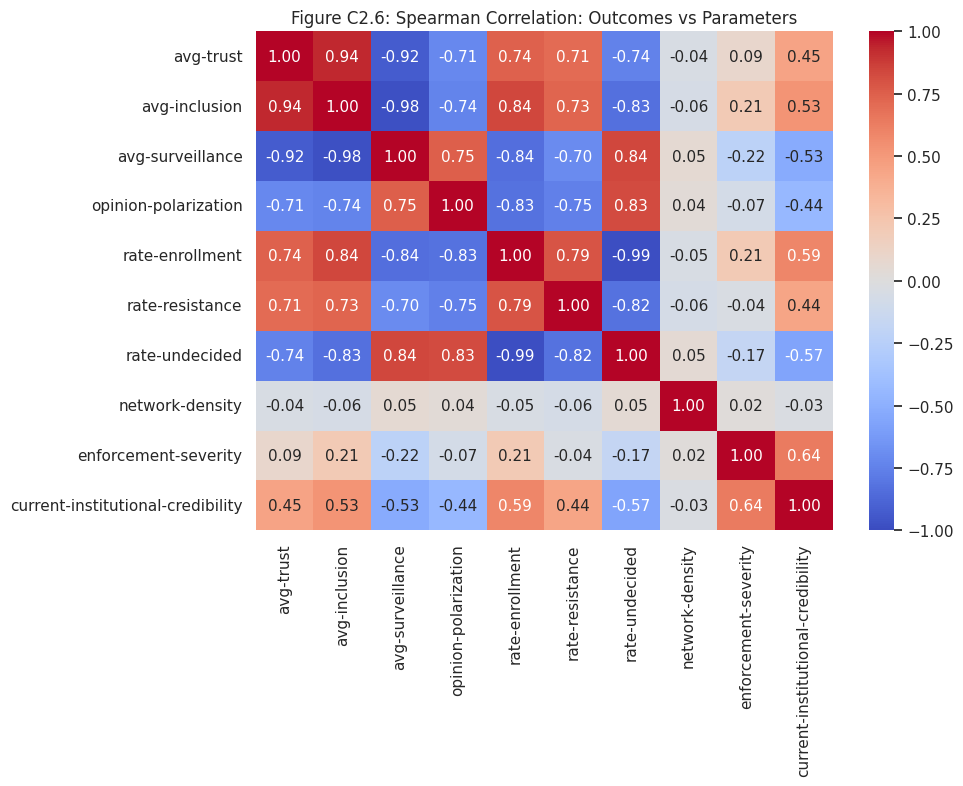

In [39]:
# Correlation Map of Outcomes vs Parameters (RQ 2.5X)
# Defining enforcement-severity values by scenario
enforcement_map = {
    'Technocratic-India': 0.95,
    'Democratic-Optional': 0.3,
    'Populist-Skeptical': 0.2,
    'Authoritarian-Enforced': 0.75
}

df_scenarios['enforcement-severity'] = df_scenarios['political-scenario'].map(enforcement_map)

correlation_vars = [
    'avg-trust', 'avg-inclusion', 'avg-surveillance', 'opinion-polarization',
    'rate-enrollment', 'rate-resistance', 'rate-undecided', 'network-density',
    'enforcement-severity', 'current-institutional-credibility'
]


df_corr = df_final[[c for c in correlation_vars if c in df_final.columns]].dropna()
corr_matrix = df_corr.corr(method='spearman')

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Figure C2.6: Spearman Correlation: Outcomes vs Parameters")
plt.tight_layout()
plt.show()


~~

In [40]:
# RQ 3

SES stratification reveals persistent gaps, with low SES groups showing higher resistance and slower uptake

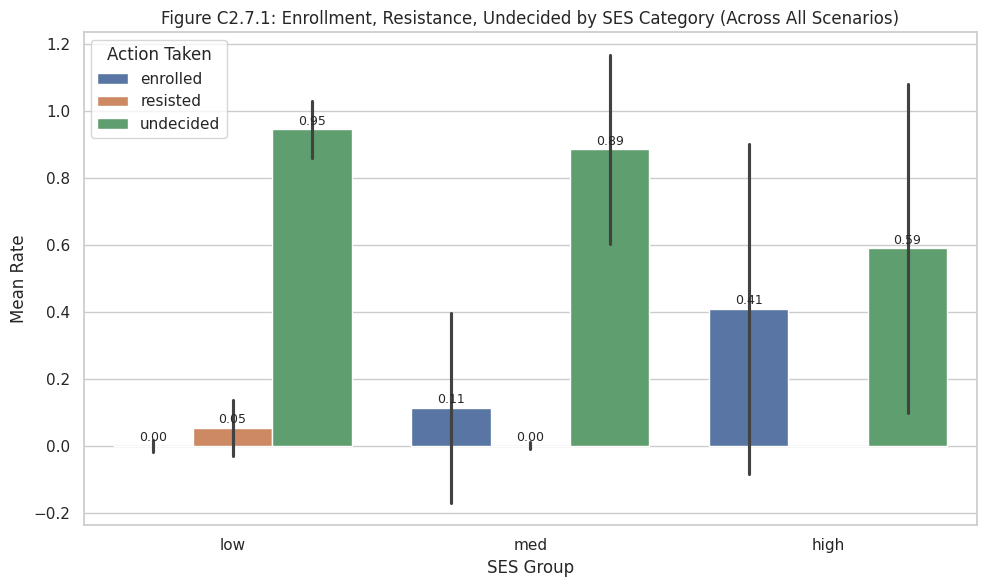

Figure C2.7.2: Grouped Bar Chart Split by Scenario


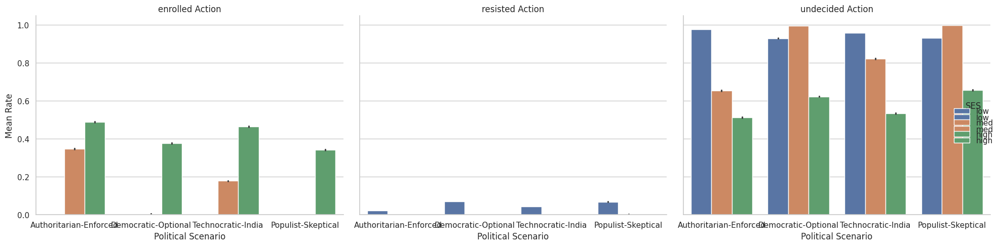

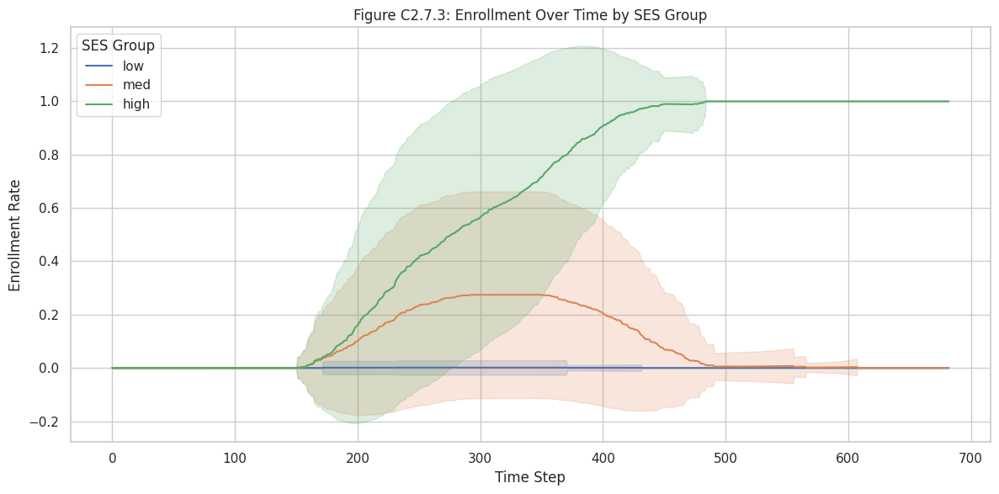

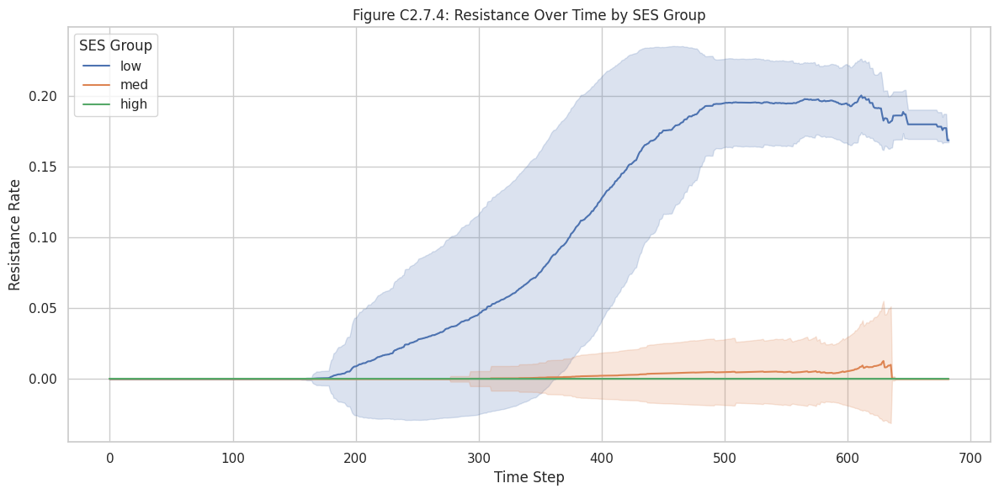

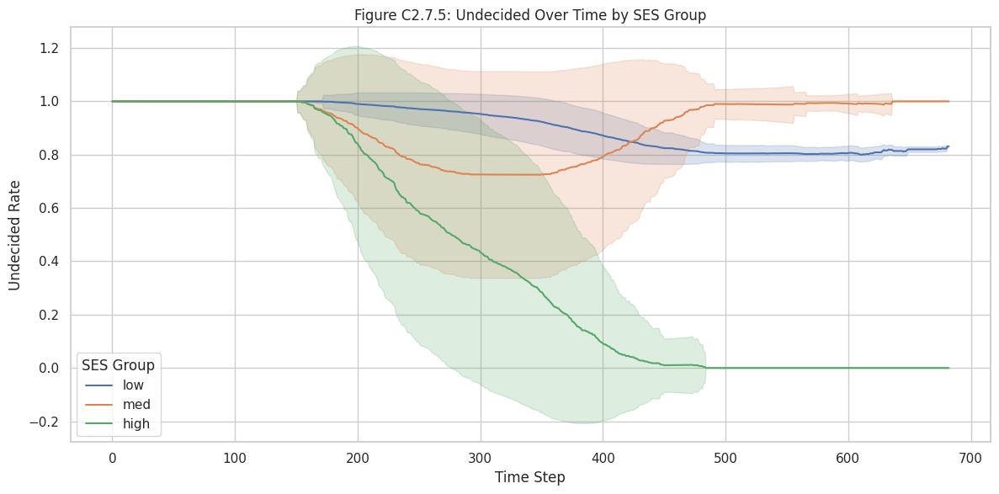

In [41]:
# SES-Specific Comparisons (Boxplot-style using line plots or KDEs) (RQ 3.8)
melted = df_final.melt(id_vars='political-scenario', value_vars=ses_action_cols,
                       var_name='SES-Action', value_name='Rate')

melted[['Action', 'SES']] = melted['SES-Action'].str.extract(r'(\w+)-(\w+)')

plt.figure(figsize=(10, 6))
ax = sns.barplot(data=melted, x='SES', y='Rate', hue='Action', errorbar=('sd', 1))
plt.title("Figure C2.7.1: Enrollment, Resistance, Undecided by SES Category (Across All Scenarios)")
plt.ylabel("Mean Rate")
plt.xlabel("SES Group")
plt.legend(title="Action Taken")
for container in ax.containers:
    for bar in container:
        height = bar.get_height()
        if not np.isnan(height) and height > 0:
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                height + 0.005,
                f"{height:.2f}",
                ha='center',
                va='bottom',
                fontsize=9
            )
plt.tight_layout()
plt.show()

# How each action (enrolled/resisted/undecided) varies across SES
ses_cor = ['low', 'med', 'high']
print("Figure C2.7.2: Grouped Bar Chart Split by Scenario")
g = sns.catplot(
    data=melted,
    x='political-scenario', y='Rate',
    hue='SES', col='Action',
    kind='bar', height=5, aspect=1.2,
    hue_order=ses_cor
)

g.set_titles("{col_name} Action")
g.set_axis_labels("Political Scenario", "Mean Rate")
g.add_legend()
plt.tight_layout()
plt.show()

# Adoption by SES over Time (RQ 3.10)
time_melted_e = df_final.melt(
    id_vars=['step', 'run number'],
    value_vars=ses_action_cols,
    var_name='SES-Action',
    value_name='Rate'
)

time_melted_e[['Action', 'SES']] = time_melted_e['SES-Action'].str.extract(r'(\w+)-(\w+)')

# Plot time series (Enrolled)
plt.figure(figsize=(12, 6))
sns.lineplot(data=time_melted_e[time_melted_e['Action'] == 'enrolled'],
             x='step', y='Rate', hue='SES', estimator='mean', errorbar=('sd', 1))
plt.title("Figure C2.7.3: Enrollment Over Time by SES Group")
plt.xlabel("Time Step")
plt.ylabel("Enrollment Rate")
plt.legend(title="SES Group")
plt.tight_layout()
plt.show()

# Plot time series (Resisted)
plt.figure(figsize=(12, 6))
sns.lineplot(data=time_melted_e[time_melted_e['Action'] == 'resisted'],
             x='step', y='Rate', hue='SES', estimator='mean', errorbar=('sd', 1))
plt.title("Figure C2.7.4: Resistance Over Time by SES Group")
plt.xlabel("Time Step")
plt.ylabel("Resistance Rate")
plt.legend(title="SES Group")
plt.tight_layout()
plt.show()

# Plot time series (Undecided)
plt.figure(figsize=(12, 6))
sns.lineplot(data=time_melted_e[time_melted_e['Action'] == 'undecided'],
             x='step', y='Rate', hue='SES', estimator='mean', errorbar=('sd', 1))
plt.title("Figure C2.7.5: Undecided Over Time by SES Group")
plt.xlabel("Time Step")
plt.ylabel("Undecided Rate")
plt.legend(title="SES Group")
plt.tight_layout()
plt.show()

This illustrates the heterogeneity of opinions across SES groups, illustrating whether agents with lower SES exhibit greater resistance.

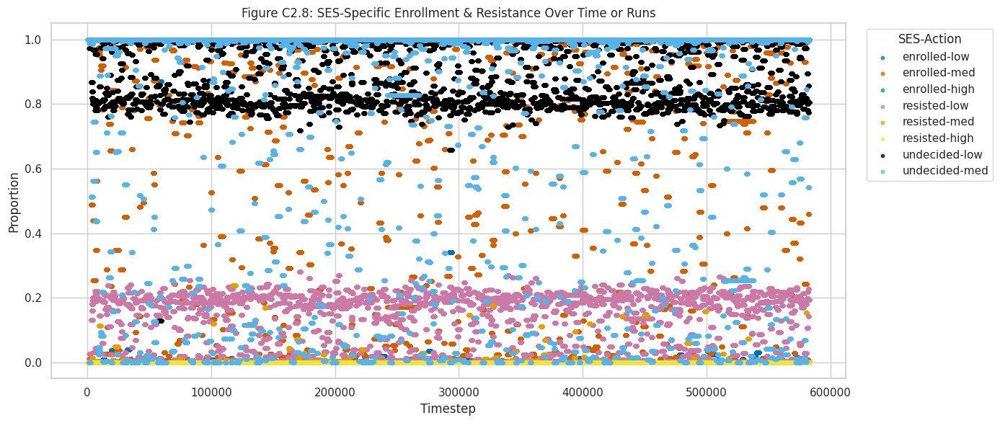

In [42]:
# Heterogeneity across SES - network density by SES group
cols_to_plot = [
    'enrolled-low', 'enrolled-med', 'enrolled-high',
    'resisted-low', 'resisted-med', 'resisted-high',
    'undecided-low', 'undecided-med'
]
# cmap = plt.colormaps.get_cmap('tab10')
# colors = [cmap(i) for i in range(len(cols_to_plot))]
colors = [
    "#0072B2",  # Blue
    "#D55E00",  # Vermillion
    "#009E73",  # Blue Green
    "#CC79A7",  # Purple
    "#E69F00",  # Orange
    "#F0E442",  # Yellow
    "#000000",  # Black
    "#56B4E9",  # Sky Blue
    "#999999",  # Gray
    "#999933",  # Olive Green
]
colors = colors[:len(cols_to_plot)]

plt.figure(figsize=(14, 6))
for i, col in enumerate(cols_to_plot):
    plt.scatter(df_final.index, df_final[col], label=col, color=colors[i], alpha=0.7, s=10)

plt.title("Figure C2.8: SES-Specific Enrollment & Resistance Over Time or Runs")
plt.xlabel("Timestep")
plt.ylabel("Proportion")
plt.legend(title="SES-Action", loc='upper left', bbox_to_anchor=(1.02, 1))
plt.tight_layout()
plt.show()

~~

ILLUSTRATIVE METRICS

In addition to the core outcome variables, the model generated a set of structural and contagion-related measures intended to track dynamics of network connectivity and cascade behaviour.

While useful for verifying that the simulated network evolved realistically, both indicators remained largely uninformative in comparative terms.
For transparency, these measures are retained in the appendix as illustrations of model completeness, but they are not central to the interpretation of results. Their inclusion demonstrates that the system was tested for possible emergent contagion dynamics and structural effects, even if these did not prove decisive for the analysis presented in the main text.


The illustrations of cascade sizes demonstrate how peer influence produces waves of enrollment or resistance.

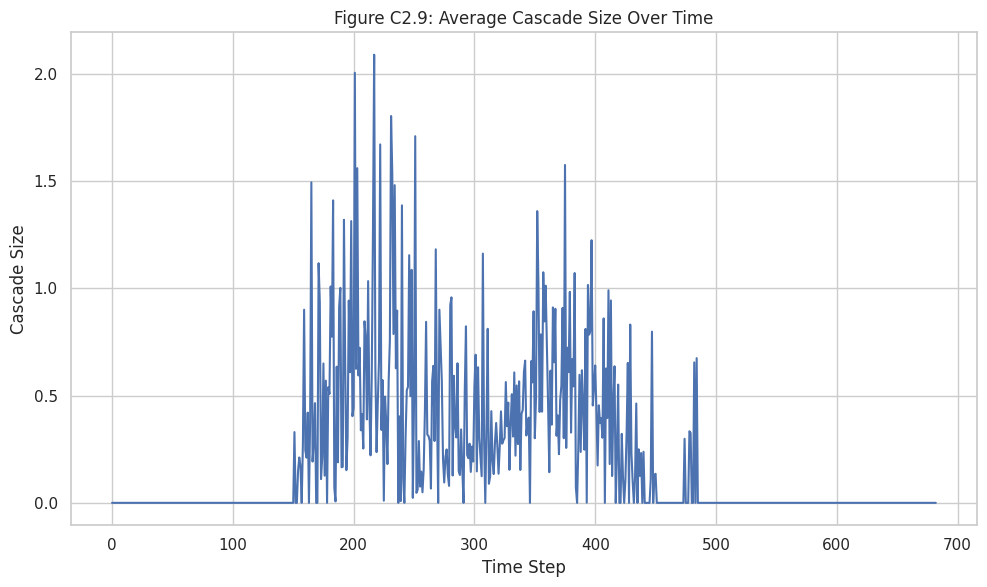

In [44]:
# Cascade Size Distribution - how large behavioral cascades were across runs. (3.6 - Illustrative)
# if 'cascade-size' in df_final.columns:
#     sns.histplot(data=df_final, x='cascade-size', bins=30, kde=True)
#     plt.title("Figure C2.9: Distribution of Cascade Sizes Across Runs")
#     plt.xlabel("Cascade Size")
#     plt.ylabel("Frequency")
#     plt.tight_layout()
#     plt.show()

# Time Series of Cascade Events - detect when cascades are happening over time.
if 'cascade-size' in df_final.columns and 'step' in df_final.columns:
    cascade_ts = df_final.groupby('step')['cascade-size'].mean().reset_index()
    sns.lineplot(data=cascade_ts, x='step', y='cascade-size')
    plt.title("Figure C2.9: Average Cascade Size Over Time")
    plt.xlabel("Time Step")
    plt.ylabel("Cascade Size")
    plt.tight_layout()
    plt.show()

This illustrates the change in density of the network as opinion divergence and action clustering drive formation and breaking of ties.

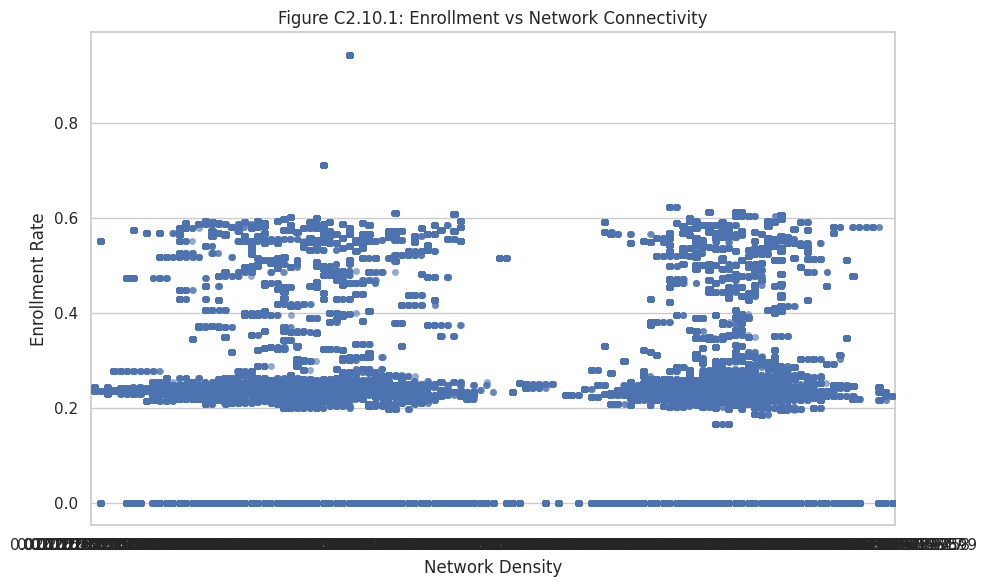

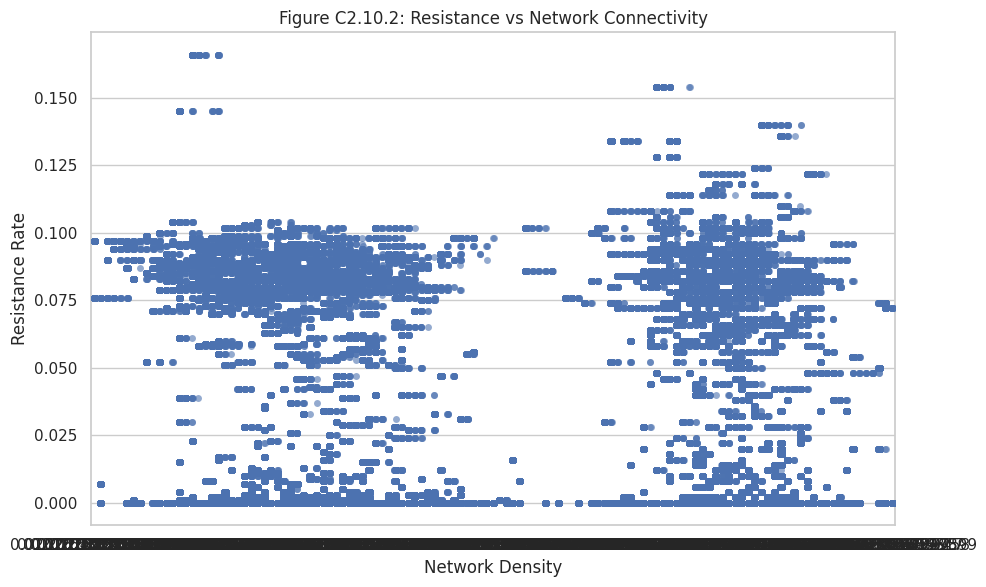

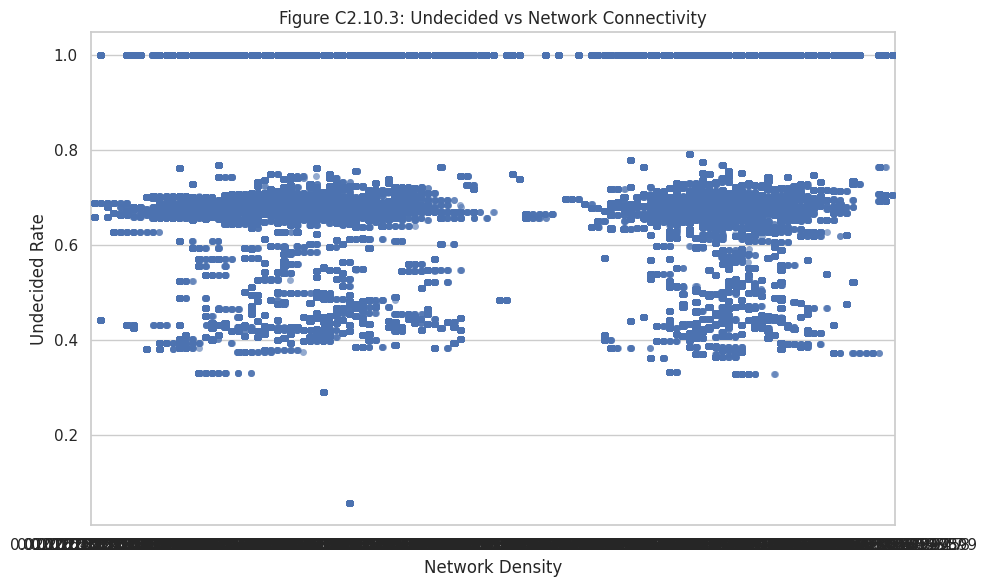

In [45]:
# Enrollment/Resistance by Network Connectivity (RQ 3.9)
sns.stripplot(data=df_final, x='network-density', y='rate-enrollment', jitter=True, alpha=0.6)
plt.title("Figure C2.10.1: Enrollment vs Network Connectivity")
plt.xlabel("Network Density")
plt.ylabel("Enrollment Rate")
plt.tight_layout()
plt.show()

sns.stripplot(data=df_final, x='network-density', y='rate-resistance', jitter=True, alpha=0.6)
plt.title("Figure C2.10.2: Resistance vs Network Connectivity")
plt.xlabel("Network Density")
plt.ylabel("Resistance Rate")
plt.tight_layout()
plt.show()

sns.stripplot(data=df_final, x='network-density', y='rate-undecided', jitter=True, alpha=0.6)
plt.title("Figure C2.10.3: Undecided vs Network Connectivity")
plt.xlabel("Network Density")
plt.ylabel("Undecided Rate")
plt.tight_layout()
plt.show()



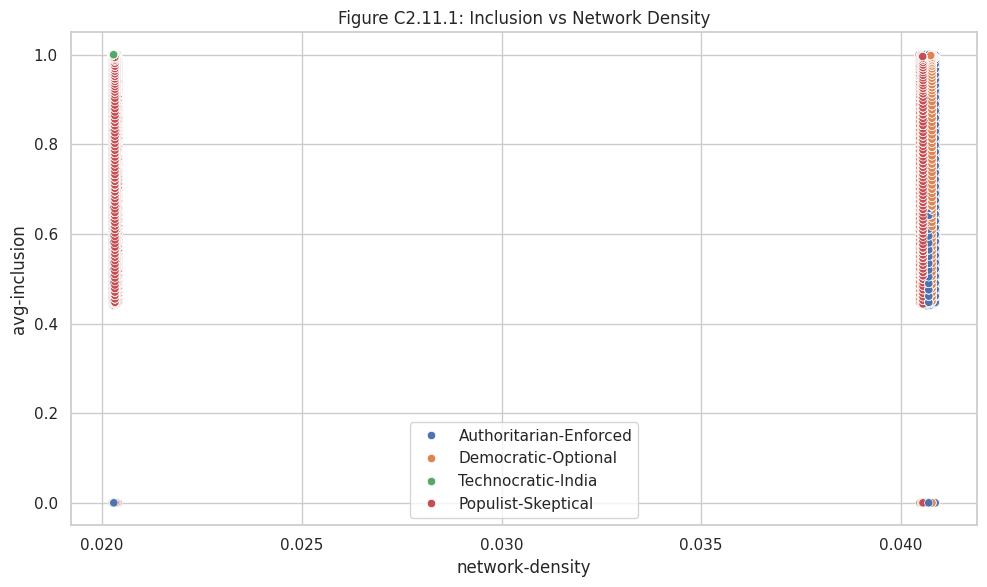

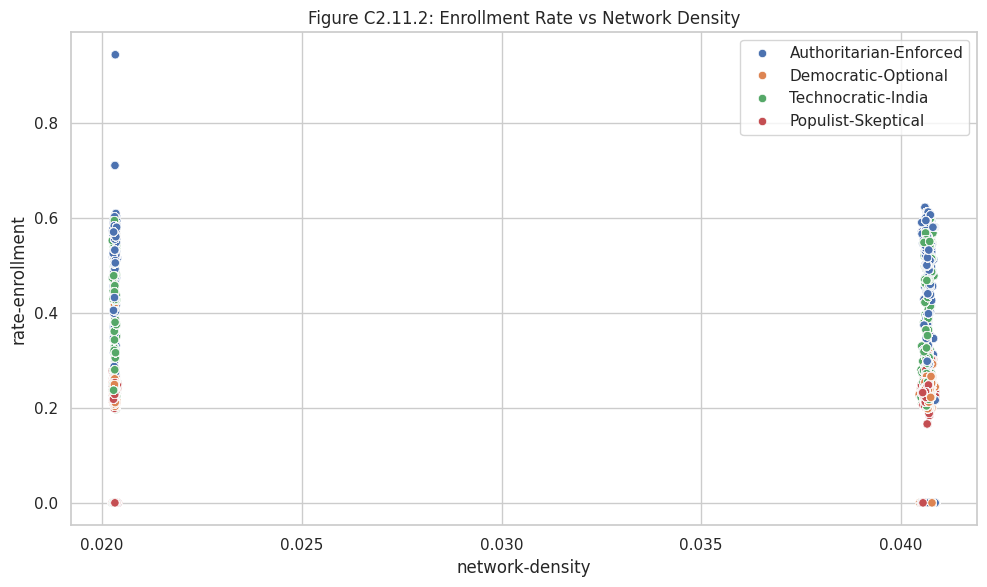

/tmp/ipython-input-1737048973.py:16: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


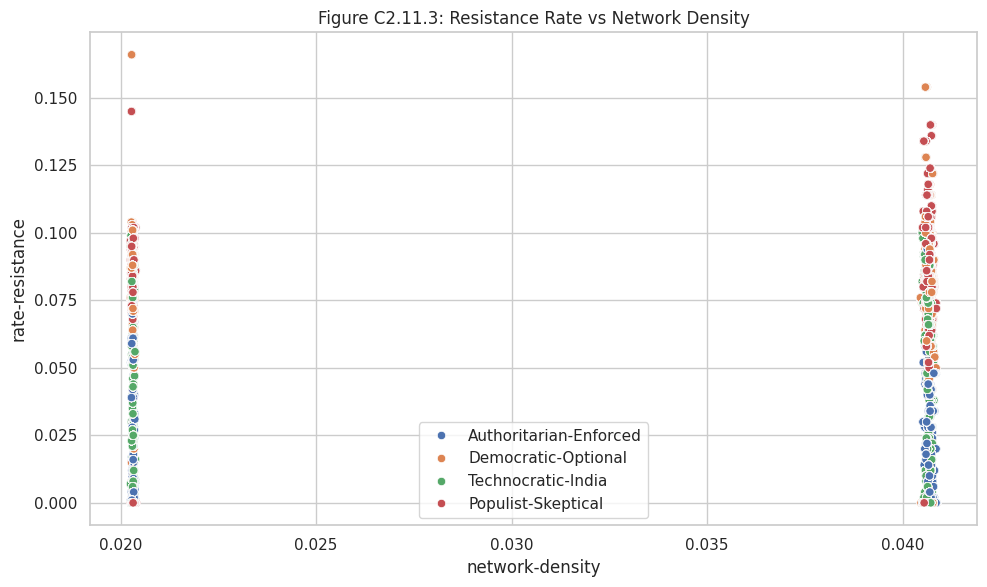

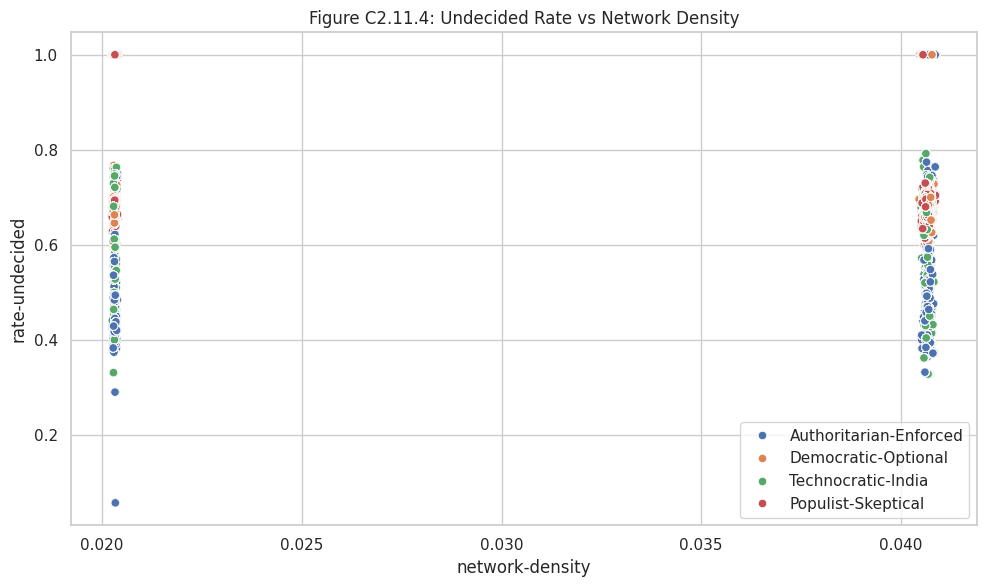

In [46]:
# Contagion - Tracking how Inclusion/EnrollmentRate Changes over Time Vs Network Density (RQ 3.12)
sns.scatterplot(data=df_scenarios, x='network-density', y='avg-inclusion', hue='political-scenario')
plt.title("Figure C2.11.1: Inclusion vs Network Density")
plt.legend(loc='best')
plt.tight_layout()
plt.show()

sns.scatterplot(data=df_scenarios, x='network-density', y='rate-enrollment', hue='political-scenario')
plt.title("Figure C2.11.2: Enrollment Rate vs Network Density")
plt.tight_layout()
plt.legend(loc='best')
plt.show()

sns.scatterplot(data=df_scenarios, x='network-density', y='rate-resistance', hue='political-scenario')
plt.title("Figure C2.11.3: Resistance Rate vs Network Density")
plt.tight_layout()
plt.legend(loc='best')
plt.show()

sns.scatterplot(data=df_scenarios, x='network-density', y='rate-undecided', hue='political-scenario')
plt.title("Figure C2.11.4: Undecided Rate vs Network Density")
plt.tight_layout()
plt.legend(loc='best')
plt.show()

~~

The stabilisation metrics report the number of ticks until OD stabilization.
Note: CA has a fixed cut-off of 200 ticks per run.

/tmp/ipython-input-678749974.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


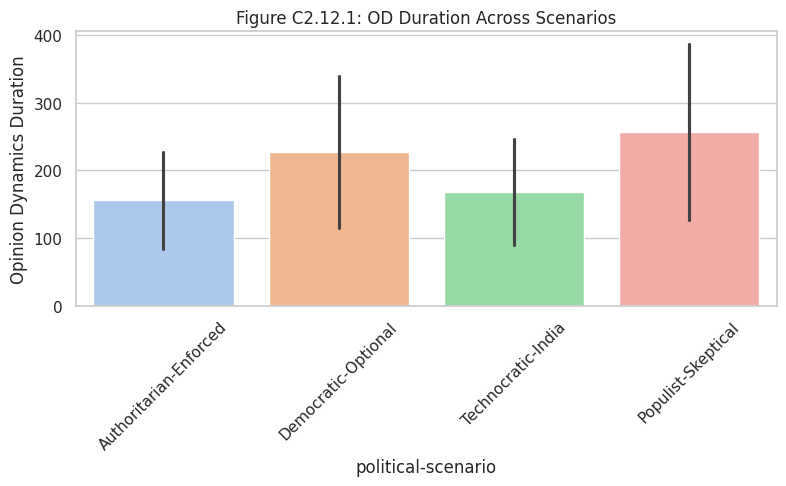

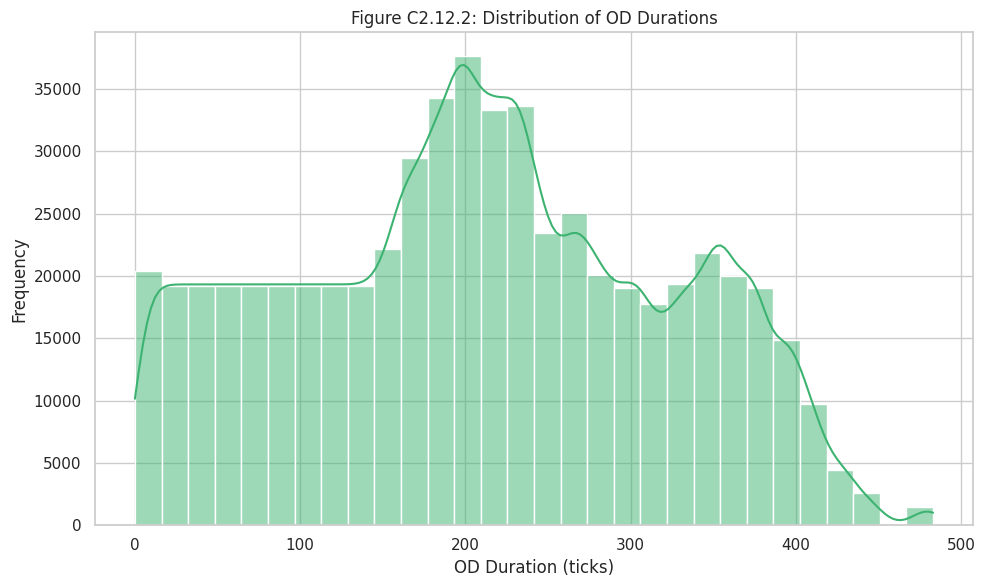

In [47]:
# Stabilisation - OD Duration by Scenario
df_final['stabilized'] = df_final['od-duration'] != -1
df_stable = df_final[df_final['stabilized']]

plt.figure(figsize=(8, 5))
sns.barplot(
    data=df_stable,
    x='political-scenario',
    y='od-duration',
    errorbar=('sd'),
    palette='pastel'
)
plt.title("Figure C2.12.1: OD Duration Across Scenarios")
plt.ylabel("Opinion Dynamics Duration")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Histogram of OD Durations
if 'od-duration' in df_final.columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(df_final['od-duration'], bins=30, kde=True, color='mediumseagreen')
    plt.title("Figure C2.12.2: Distribution of OD Durations")
    plt.xlabel("OD Duration (ticks)")
    plt.ylabel("Frequency")
    plt.tight_layout()
    plt.show()

# Stacked OD + CA Durations by Scenario
# duration_summary = df_stable.groupby('political-scenario')[['od-duration', 'ca-duration']].mean().reset_index()
# plt.figure(figsize=(10, 6))
# bar1 = plt.bar(duration_summary['political-scenario'], duration_summary['od-duration'], label='OD Phase', color='steelblue')
# bar2 = plt.bar(duration_summary['political-scenario'], duration_summary['ca-duration'], bottom=duration_summary['od-duration'], label='CA Phase', color='salmon')
# plt.title("Figure C2.12.3: Average Phase Durations by Scenario (Stabilized Runs Only)")
# plt.ylabel("Timesteps")
# plt.xticks(rotation=45)
# plt.legend()
# plt.tight_layout()
# plt.show()


~~

The phase diagrams reveal the opinion vectors in a 3D scatterplot across scenarios, using the final agent action state as the colour dimension.

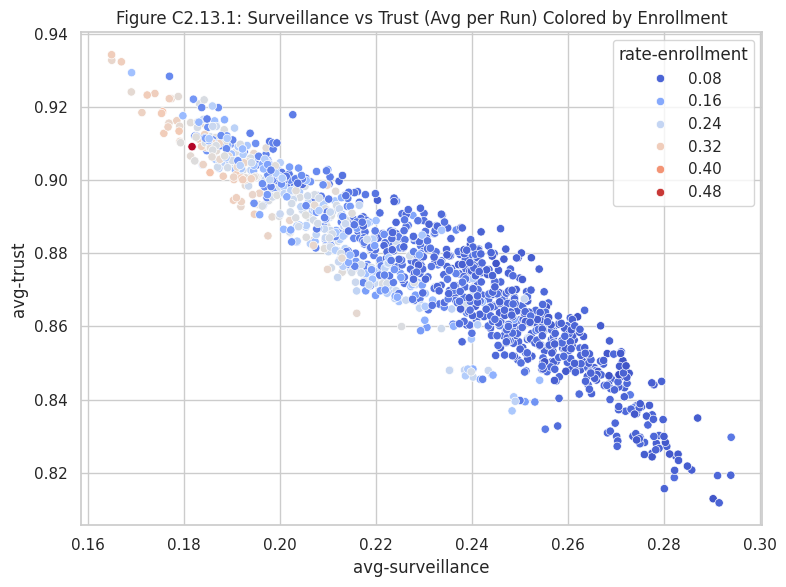

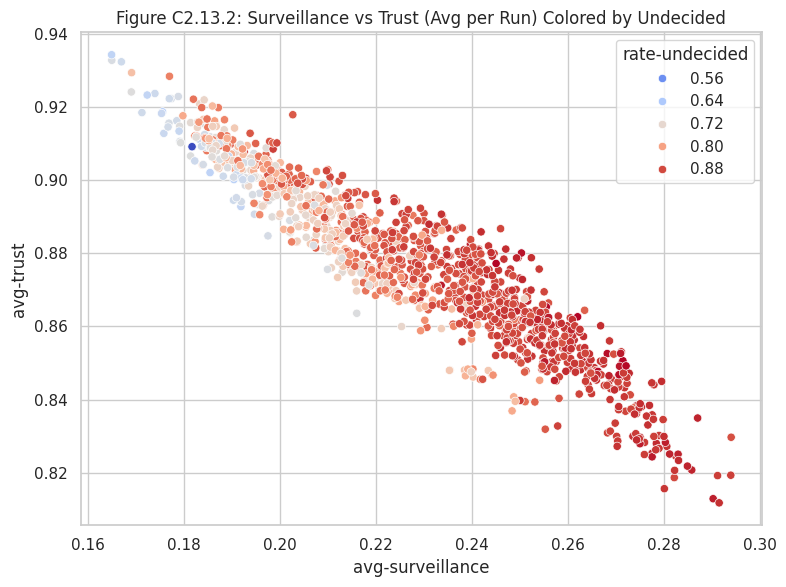

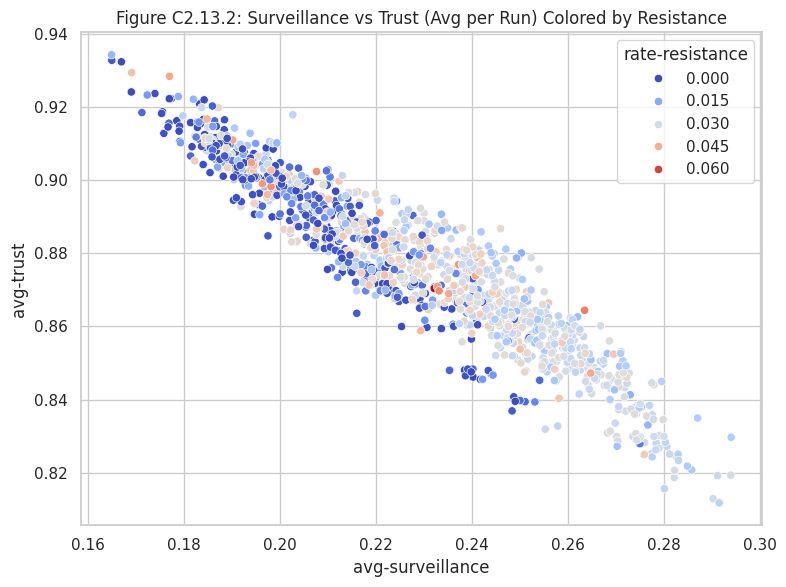

In [48]:
# Phase Diagram - trust vs surveillance vs enrollment
df_tse = df_scenarios.groupby('run number')[['avg-surveillance', 'rate-enrollment', 'avg-trust']].mean().reset_index()
# Plot
plt.figure(figsize=(8,6))
sns.scatterplot(data=df_tse, x='avg-surveillance', y='avg-trust', hue='rate-enrollment', palette='coolwarm')
plt.title("Figure C2.13.1: Surveillance vs Trust (Avg per Run) Colored by Enrollment")
plt.tight_layout()
plt.show()

df_tsu = df_scenarios.groupby('run number')[['avg-surveillance', 'rate-undecided', 'avg-trust']].mean().reset_index()
# Plot
plt.figure(figsize=(8,6))
sns.scatterplot(data=df_tsu, x='avg-surveillance', y='avg-trust', hue='rate-undecided', palette='coolwarm')
plt.title("Figure C2.13.2: Surveillance vs Trust (Avg per Run) Colored by Undecided")
plt.tight_layout()
plt.show()

df_tsr = df_scenarios.groupby('run number')[['avg-surveillance', 'rate-resistance', 'avg-trust']].mean().reset_index()
# Plot
plt.figure(figsize=(8,6))
sns.scatterplot(data=df_tsr, x='avg-surveillance', y='avg-trust', hue='rate-resistance', palette='coolwarm')
plt.title("Figure C2.13.2: Surveillance vs Trust (Avg per Run) Colored by Resistance")
plt.tight_layout()
plt.show()

~~

The correlation matrices examine the with only neighbor links drawn for clarity. While this is purely descriptive as correlation is not causation, it does paint a picture into whether the runs remain consistent with the story.
Strong positive associations are observed between trust and enrollment (r ≈ 0.52) and between institutional credibility and both enrollment (r ≈ 0.54) and trust (r ≈ 0.32). Resistance is positively linked to trust (r ≈ 0.45) and enrollment (r ≈ 0.45), but its weaker tie to institutional credibility (r ≈ 0.28) suggests resistance may persist even under credible institutions.

The heatmap provides the exact pairwise coefficients for reference.


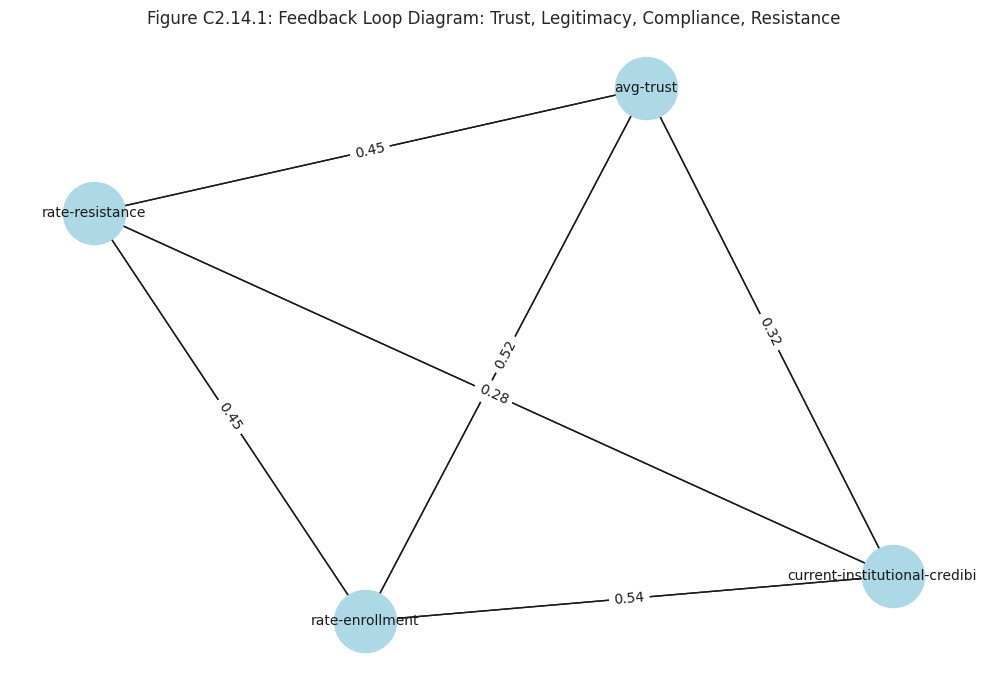

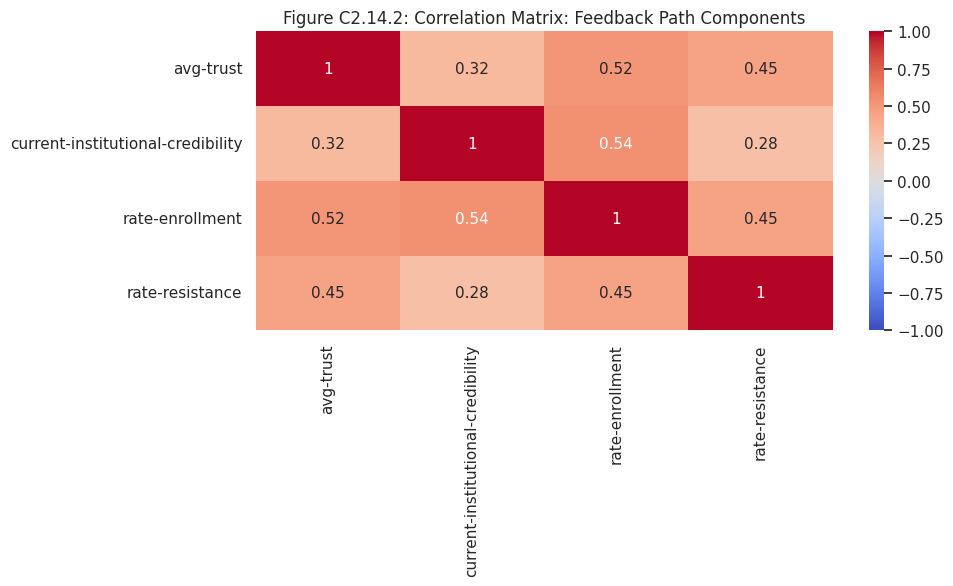

In [49]:
# (Correlation) Path Diagram - Feedback Loops (Trust,⇄ Legitimacy,⇄ Compliance,⇄ Resistance)
import networkx as nx

feedback_vars = [
    'avg-trust',
    'current-institutional-credibility',
    'rate-enrollment',
    'rate-resistance'
]

feedback_df = df_final[feedback_vars].dropna()
corrs = feedback_df.corr()

G = nx.DiGraph()

for i in feedback_vars:
    for j in feedback_vars:
        if i != j:
            weight = corrs.loc[i, j]
            if abs(weight) > 0.01:
                G.add_edge(i, j, weight=round(weight, 2))

known_edges = [
    ("current-institutional-credibility", "avg-trust"),
    ("avg-trust", "rate-enrollment"),
    ("rate-enrollment", "rate-resistance")
]

for src, tgt in known_edges:
    if not G.has_edge(src, tgt):
        try:
            weight = corrs.loc[src, tgt]
            G.add_edge(src, tgt, weight=round(weight, 2))
        except:
            pass

# Plot
pos = nx.spring_layout(G, seed=42)
plt.figure(figsize=(10, 7))
edges = G.edges(data=True)
edge_labels = {(u, v): d['weight'] for u, v, d in edges}

nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=2000)
nx.draw_networkx_edges(G, pos, arrowstyle='->', arrowsize=20)
nx.draw_networkx_labels(G, pos, font_size=10)
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

plt.title("Figure C2.14.1: Feedback Loop Diagram: Trust, Legitimacy, Compliance, Resistance")
plt.axis('off')
plt.tight_layout()
plt.show()

# Heatmap Correlation Summary
sns.heatmap(corrs, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Figure C2.14.2: Correlation Matrix: Feedback Path Components")
plt.tight_layout()
plt.show()



~~

This is an overview for the sensitivity.
This supports chapter 4’s claims about which assumptions matter most for enrollment, resistance, undecided persistence, and time-to-stabilization.

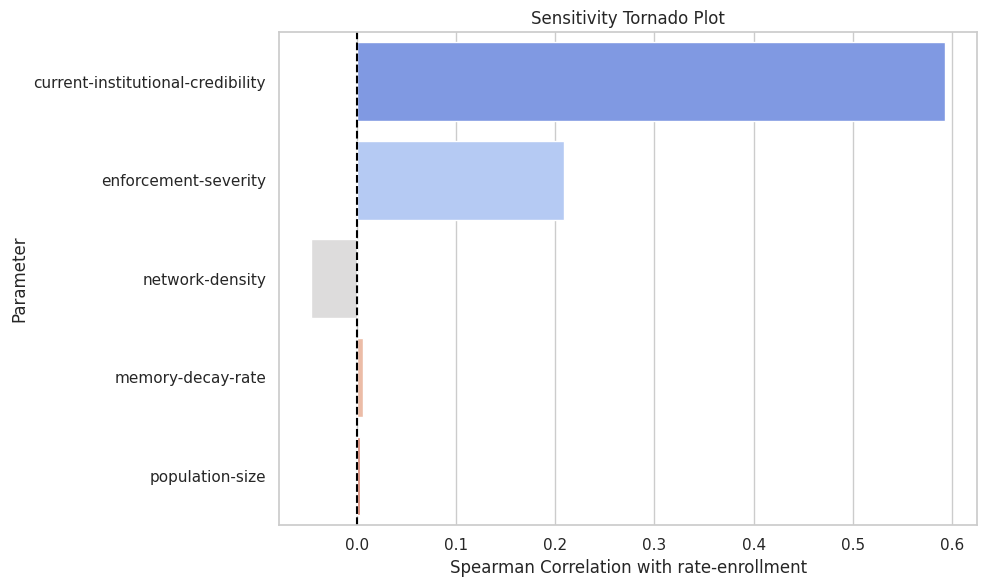

In [50]:
# Sensitivity Tornado Plot - Ranked Effect Size of Parameters on Outcome
param_vars = ['memory-decay-rate', 'current-institutional-credibility', 'social-threshold', 'network-density', 'enforcement-severity', 'population-size']
outcome_var = 'rate-enrollment'
existing_params = [p for p in param_vars if p in df_final.columns and df_final[p].dtype != 'object']

effect_sizes = {
    param: spearmanr(df_final[param], df_final[outcome_var], nan_policy='omit').correlation
    for param in existing_params
}

sorted_effects = sorted(effect_sizes.items(), key=lambda x: abs(x[1]), reverse=True)
params, effects = zip(*sorted_effects)

plt.figure(figsize=(10, 6))
sns.barplot(x=list(effects), y=list(params), hue=list(params), palette='coolwarm', orient='h', dodge=False)
for i, (param, effect) in enumerate(zip(params, effects)):
    ax.text(
        effect + (0.02 if effect >= 0 else -0.02),
        i,
        f"{effect:.2f}",
        color='black',
        va='center',
        ha='left' if effect >= 0 else 'right',
        fontsize=9
    )
plt.axvline(0, color='black', linestyle='--')
plt.title("Sensitivity Tornado Plot")
plt.xlabel(f"Spearman Correlation with {outcome_var}")
plt.ylabel("Parameter")
plt.tight_layout()
plt.show()



---------------------
D. PARAMETER SENSITIVITY ANALYSIS
---------------------

One-factor-at-a-time (OFAT) sensitivity tests are used to assess robustness of the simulation. For each parameter, the model was run repeatedly with the parameter varied across a range of values while all other values were held constant. The goal is to identify which assumptions most strongly shape system outcomes.

In [51]:
# Parameter Sweep
def plot_time_series(df, param, metrics, fig_prefix, title):
    for i, metric in enumerate(metrics, start=1):
        plt.figure(figsize=(8,5))
        sns.lineplot(data=df, x='step', y=metric, hue=param, estimator='mean')
        plt.title(f"Figure {fig_prefix}.{i}: {title} - {metric}")
        plt.xlabel('Step')
        plt.ylabel(metric)
        plt.legend(title=param)
        plt.show()

Population size determines the scale of interactions.
These runs test whether results generalize when scaling the population up or down (e.g., 500, 1000, 2000 agents).

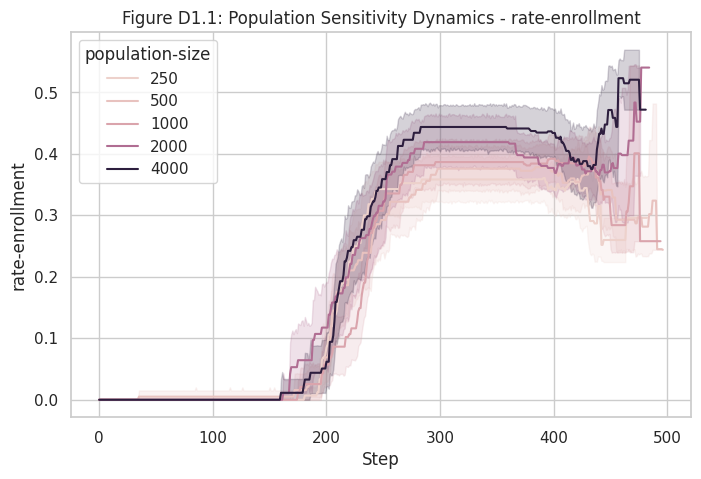

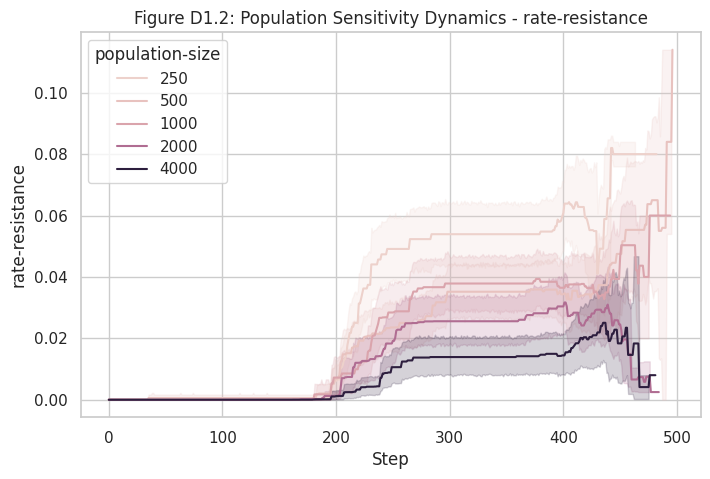

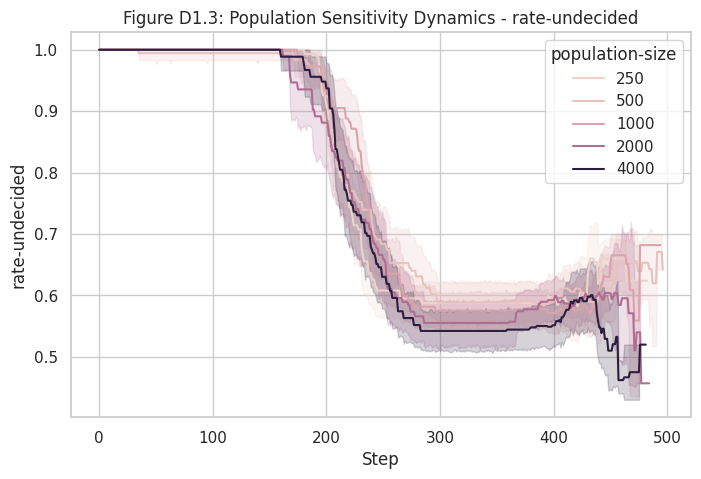

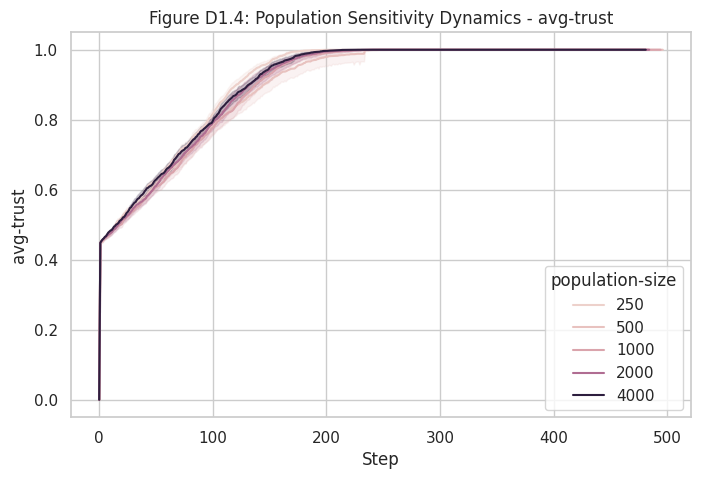

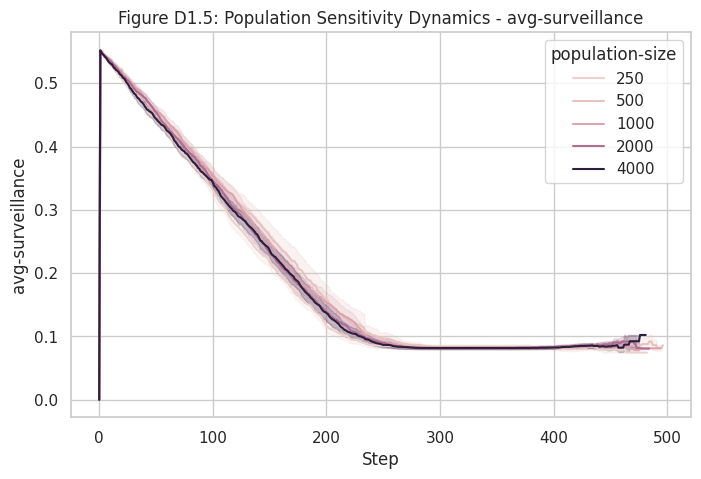

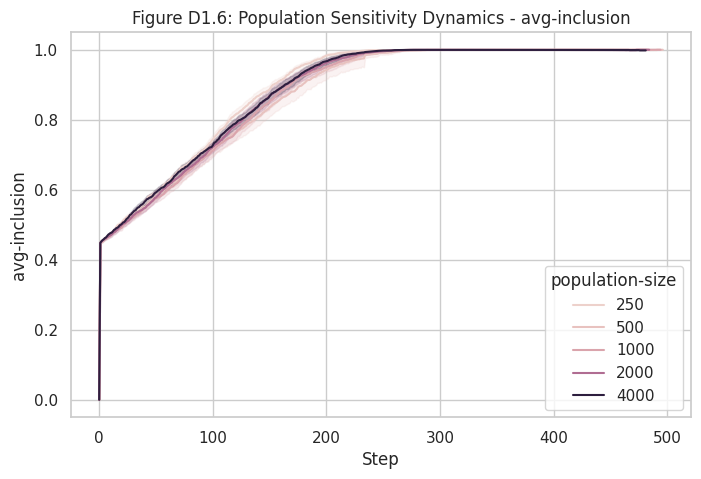

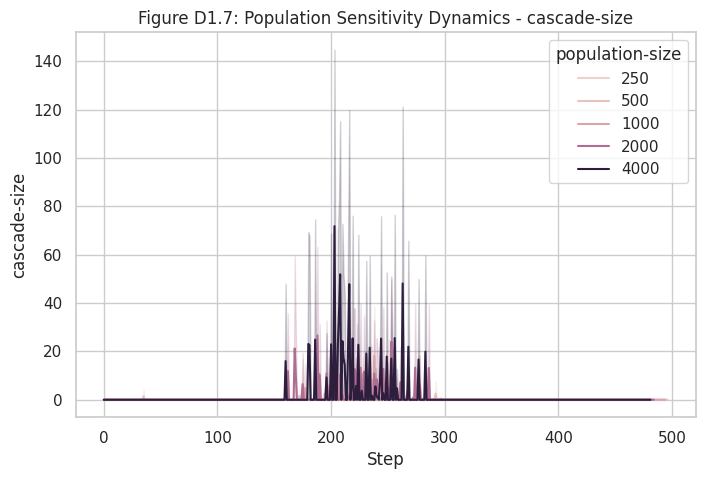

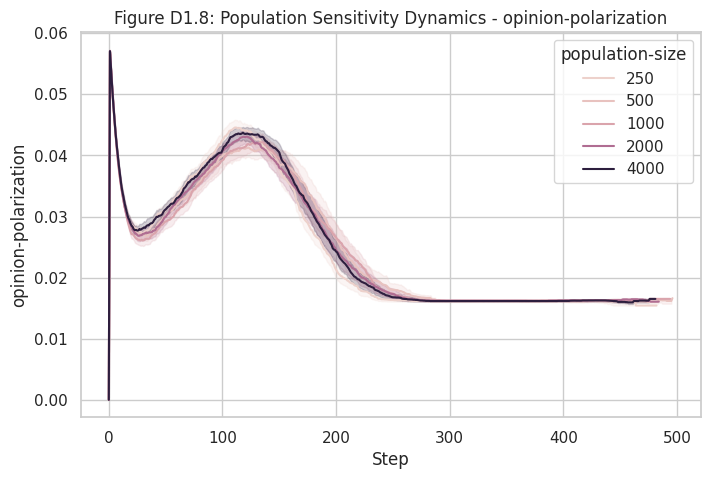

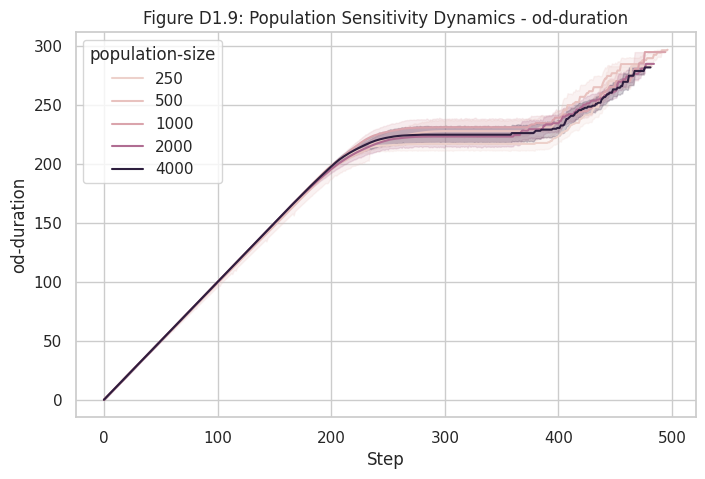

In [52]:
# Population Sensitivity
plot_time_series(
    datasets['population_sensitivity'],
    param='population-size',
    metrics=['rate-enrollment', 'rate-resistance', 'rate-undecided',
            'avg-trust', 'avg-surveillance', 'avg-inclusion',
            'cascade-size', 'opinion-polarization', 'od-duration'],
    fig_prefix = 'D1',
    title='Population Sensitivity Dynamics'
)

Memory decay influences how long agents retain negative experiences.
This sweep varies the rate at which memory of exclusion decays. High decay implies societies “forget” shocks quickly. Low decay implies long-lived distrust. The outcomes show whether institutional credibility can recover or whether resistance remains entrenched.

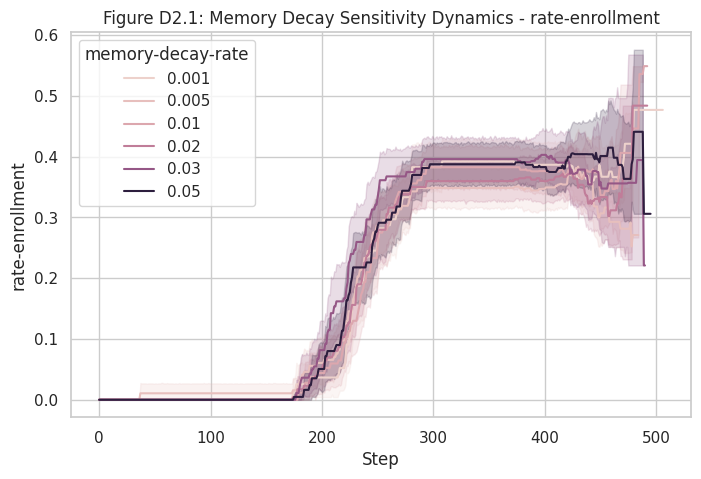

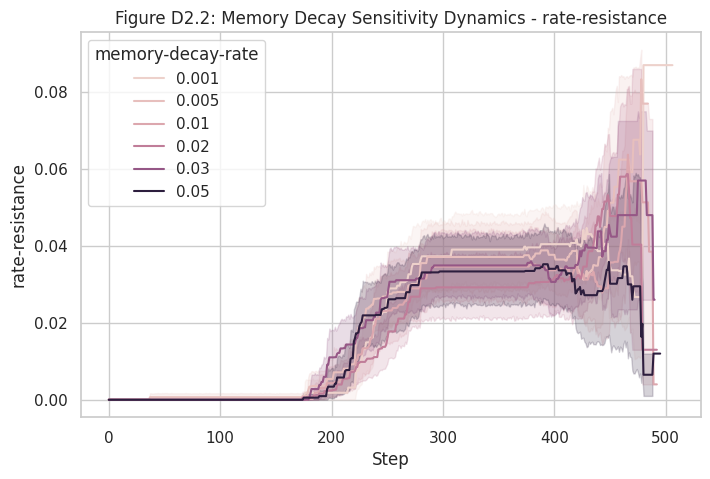

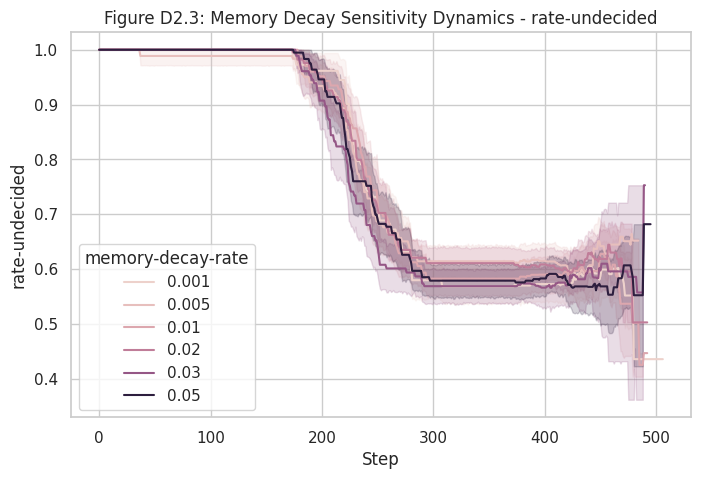

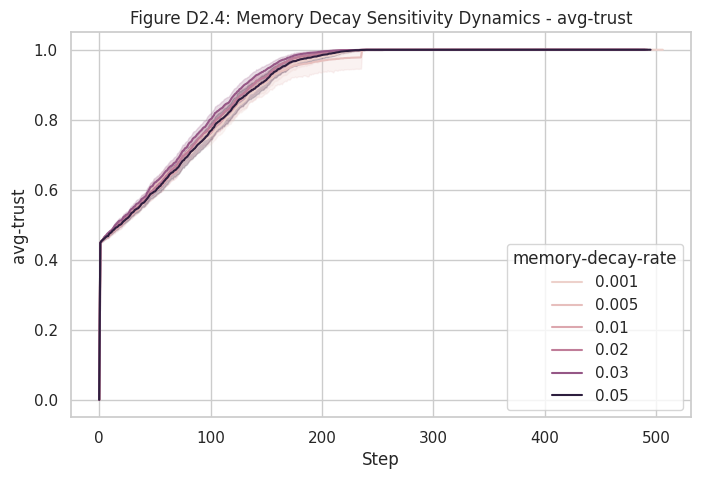

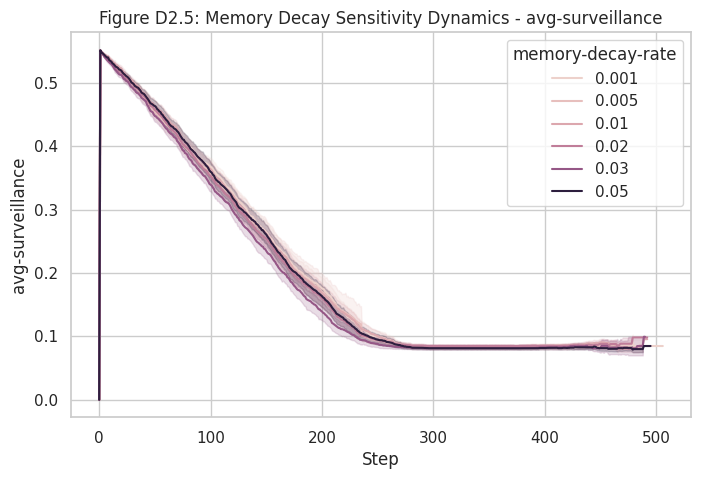

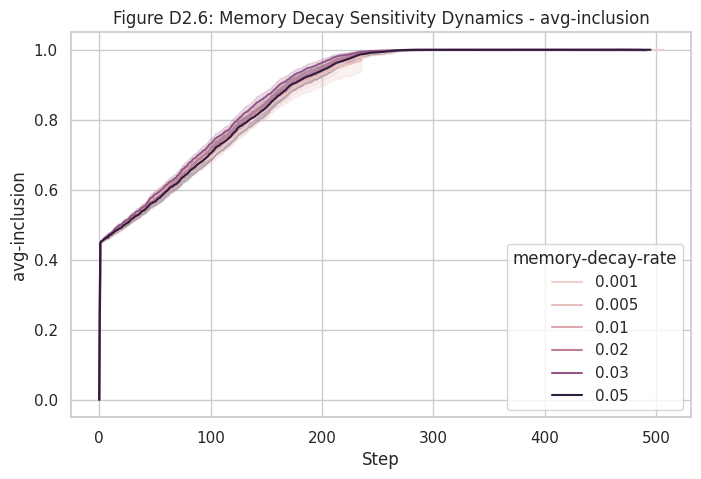

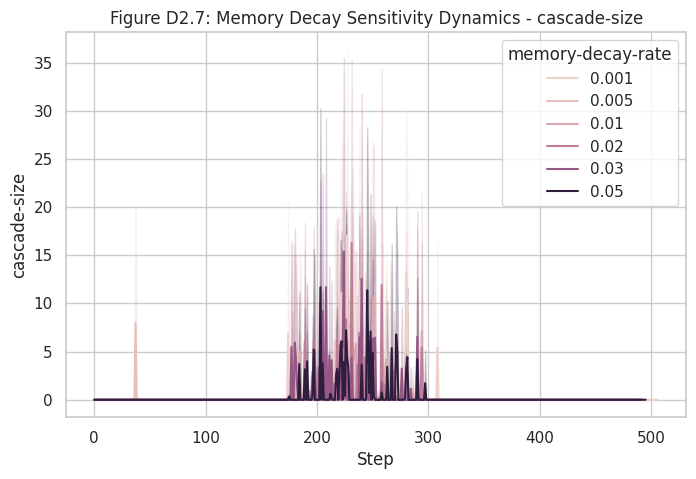

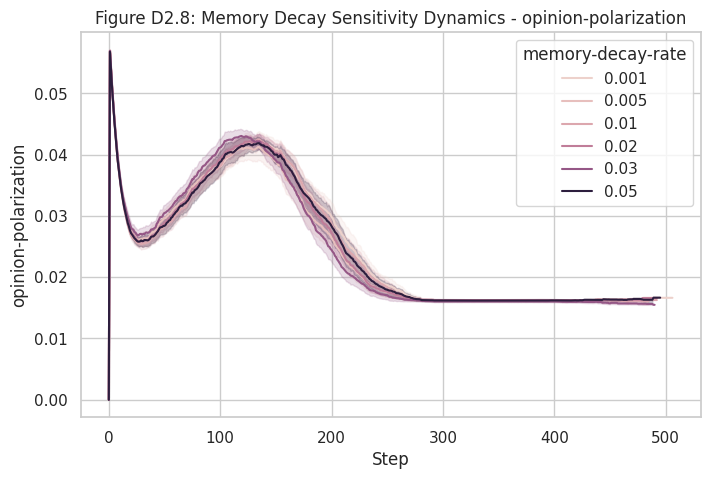

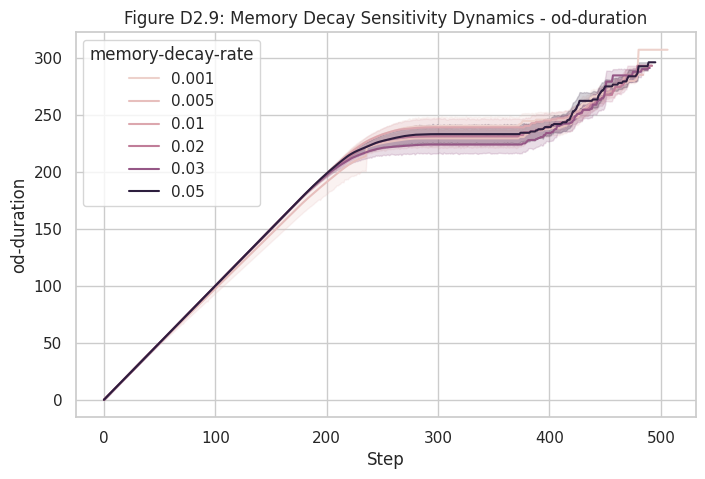

In [53]:
# Memory Decay Sensitivity
plot_time_series(
    datasets['memory_sensitivity'],
    param='memory-decay-rate',
    metrics=['rate-enrollment', 'rate-resistance', 'rate-undecided',
            'avg-trust', 'avg-surveillance', 'avg-inclusion',
            'cascade-size', 'opinion-polarization', 'od-duration'],
    fig_prefix = 'D2',
    title='Memory Decay Sensitivity Dynamics'
)


Network density reflects how many connections agents maintain on average.
Dense networks allow rapid information contagion and coordinated cascades.

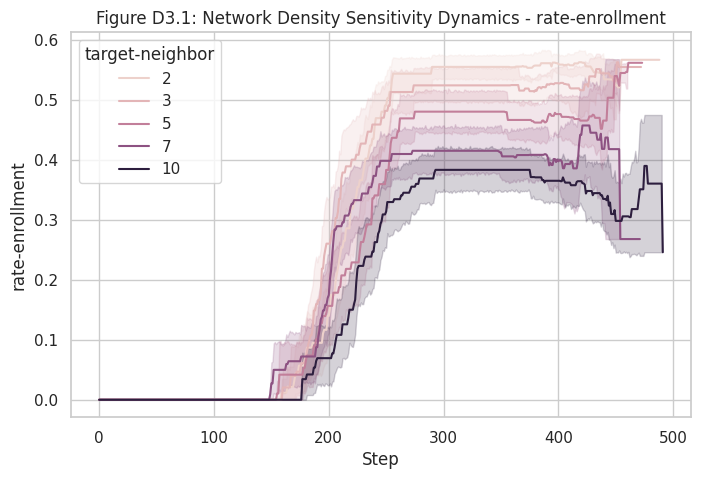

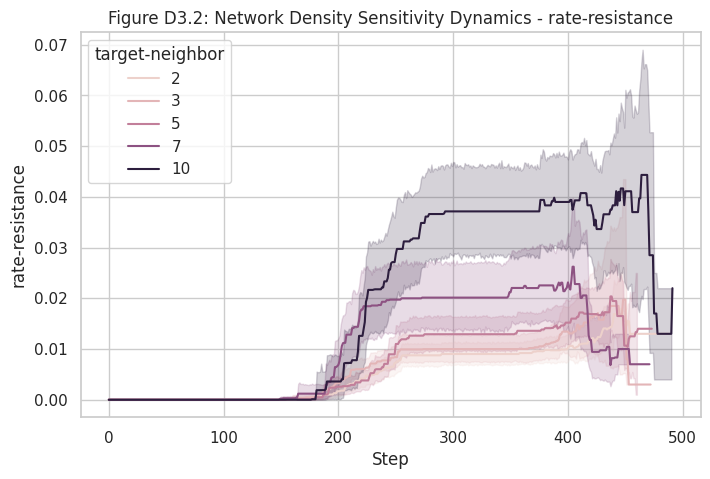

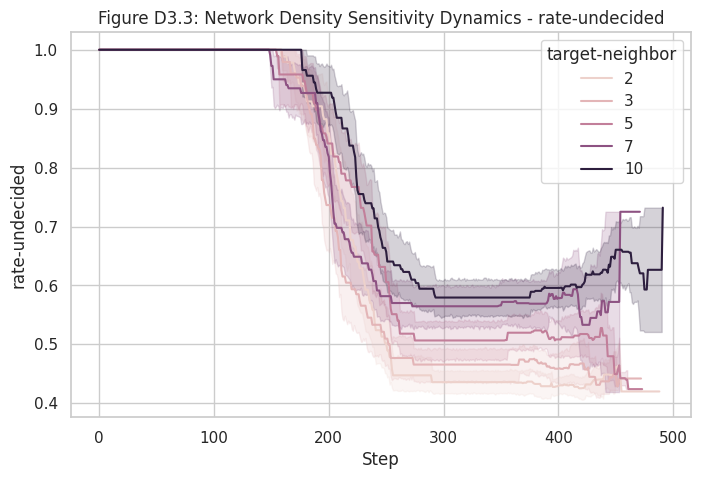

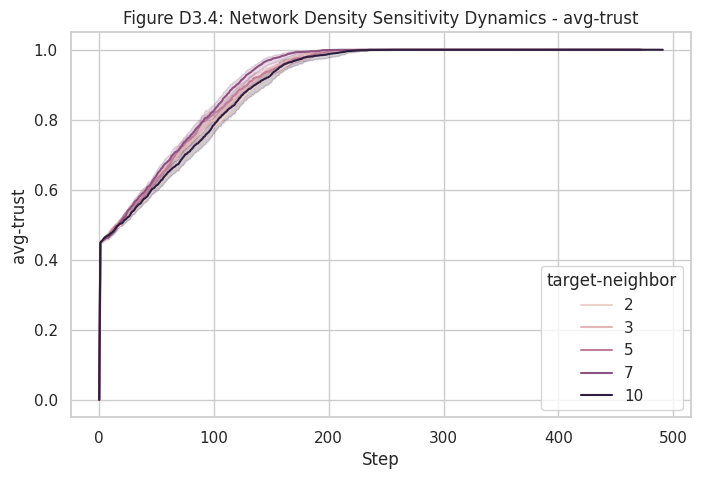

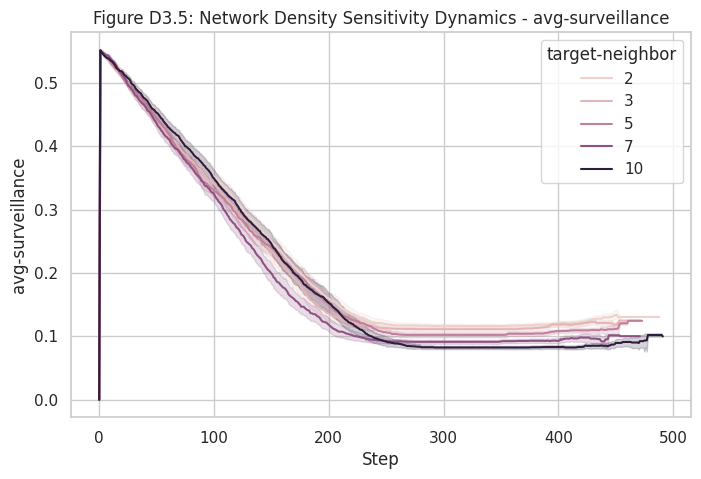

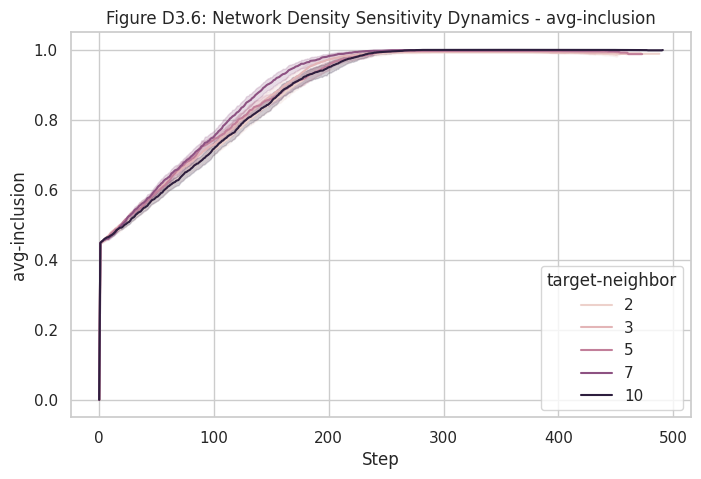

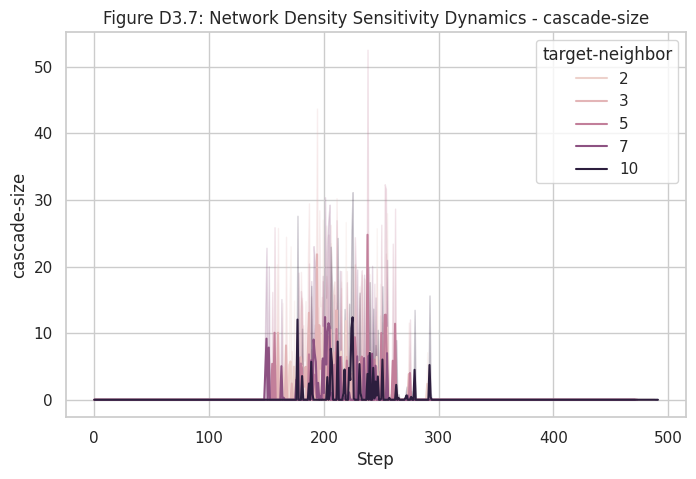

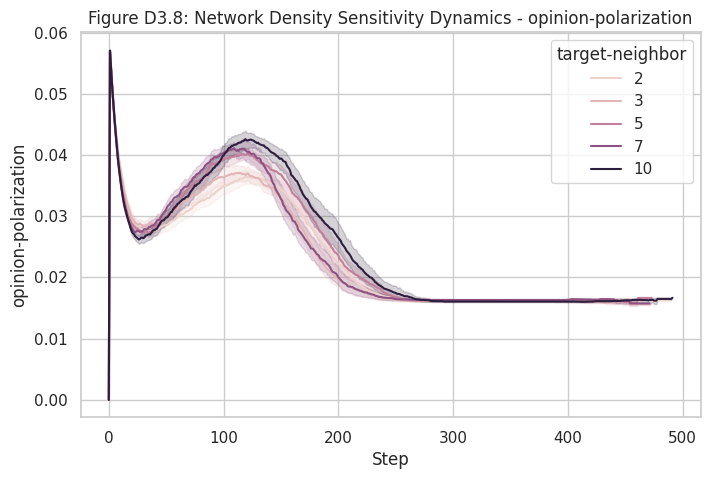

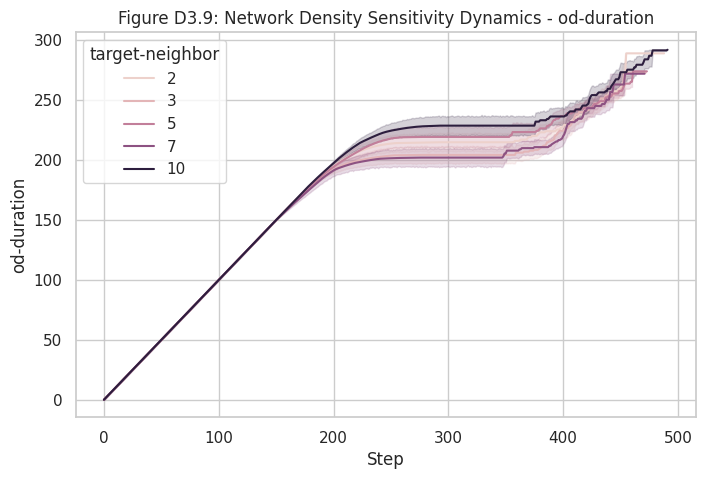

In [54]:
# Network Density Sensitivity - Does higher connectivity accelerates or dampens behavior spread?
plot_time_series(
    datasets['network_sensitivity'],
    param='target-neighbor',
    metrics=['rate-enrollment', 'rate-resistance', 'rate-undecided',
            'avg-trust', 'avg-surveillance', 'avg-inclusion',
            'cascade-size', 'opinion-polarization', 'od-duration'],
    fig_prefix = 'D3',
    title='Network Density Sensitivity Dynamics'
)


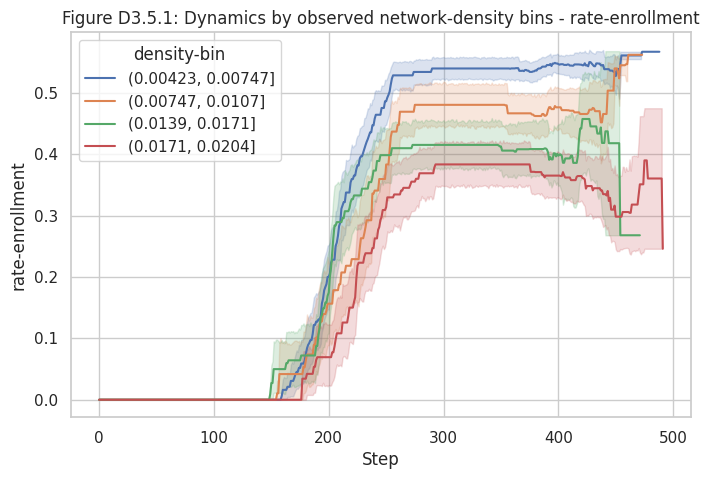

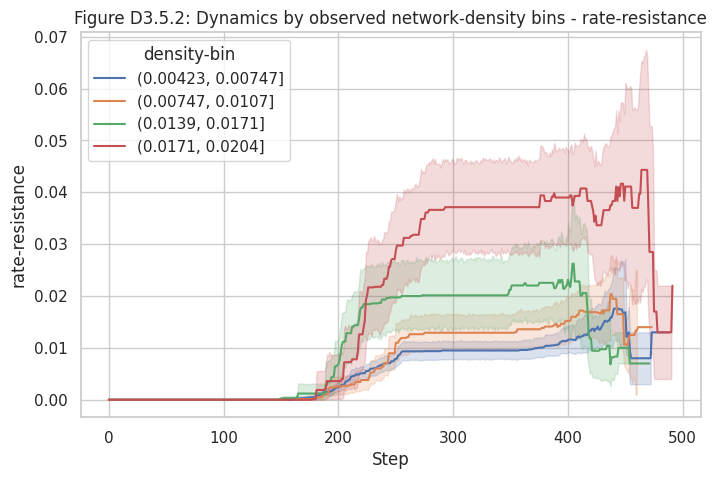

In [56]:
# to stratify by observed network density
df = datasets['network_sensitivity'].copy()
df['density-bin'] = pd.cut(df['network-density'], bins=5).astype(str)
plot_time_series(df, param='density-bin', metrics=['rate-enrollment','rate-resistance'],
                 fig_prefix = 'D3.5',
                 title='Dynamics by observed network-density bins')

Social thresholds capture how much peer influence is needed before an agent changes state.
Going from low (permissive) to high (strict) thresholds eveals how collective outcomes depend on willingness to follow peers.

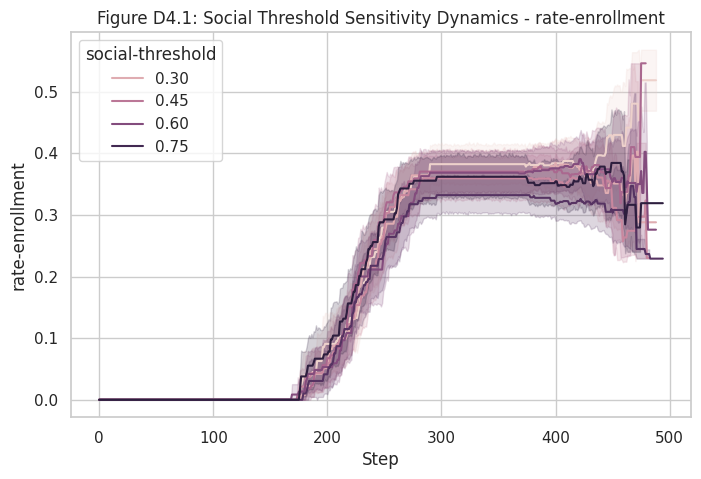

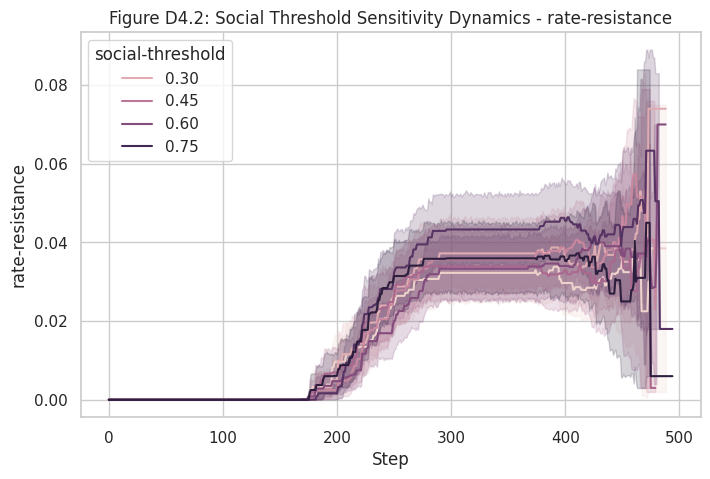

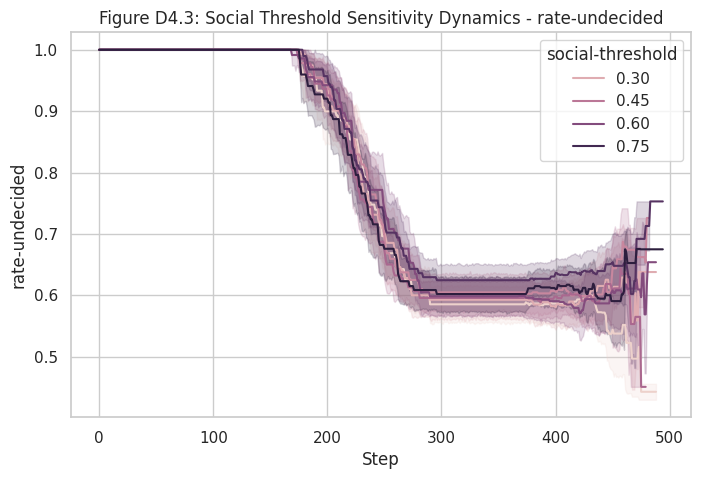

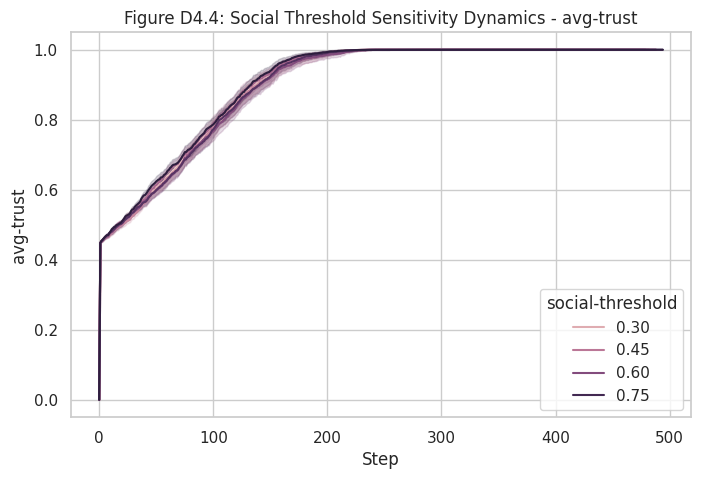

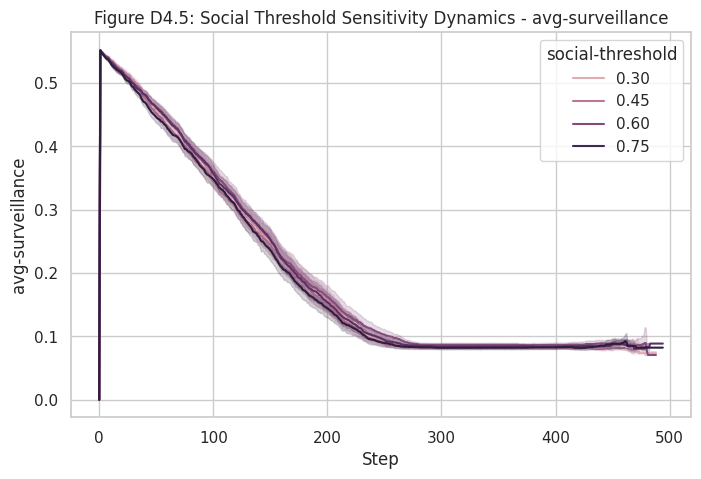

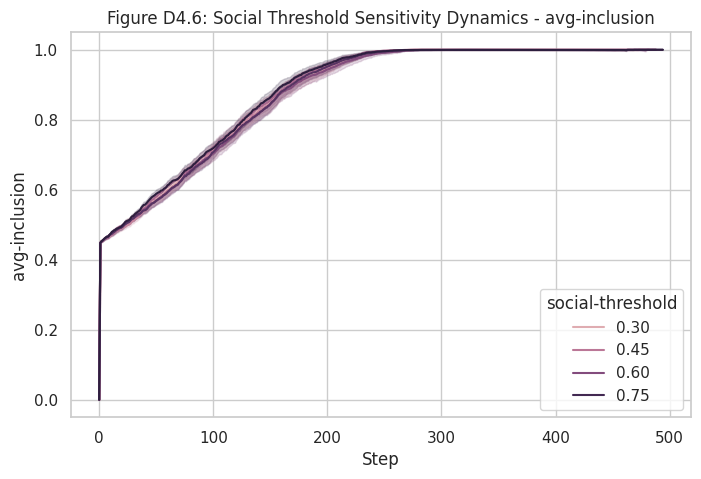

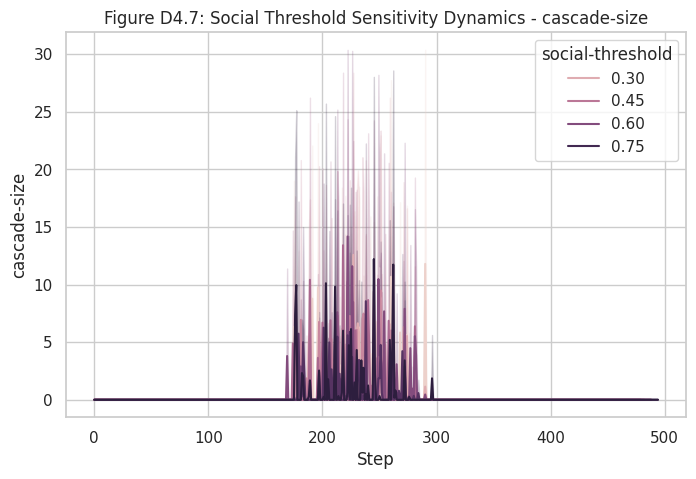

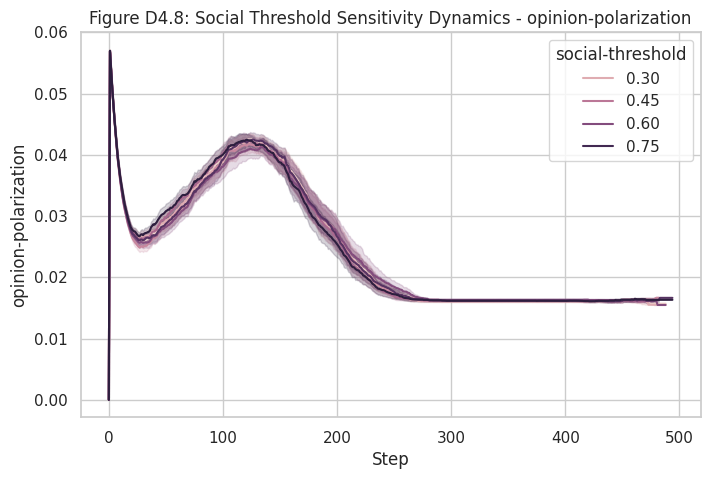

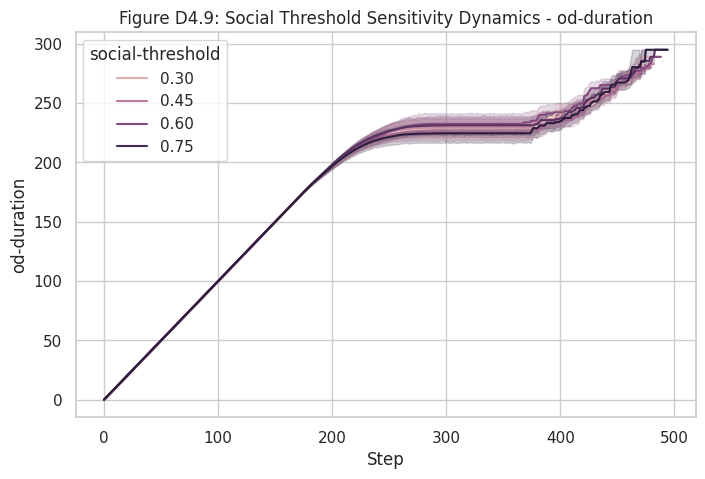

In [57]:
# Threshold Sensitivity
plot_time_series(
    datasets['threshold_sensitivity'],
    param='social-threshold',
    metrics=['rate-enrollment', 'rate-resistance', 'rate-undecided',
            'avg-trust', 'avg-surveillance', 'avg-inclusion',
            'cascade-size', 'opinion-polarization', 'od-duration'],
    fig_prefix = 'D4',
    title='Social Threshold Sensitivity Dynamics'
)

nitial adoption rate seeds early enrollers into the system.
Varying the proportion of early adopters clarifies how dependent outcomes are on generating momentum early.

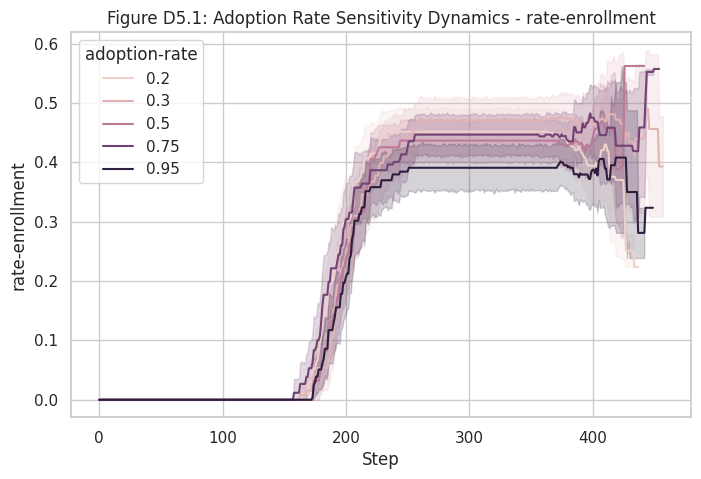

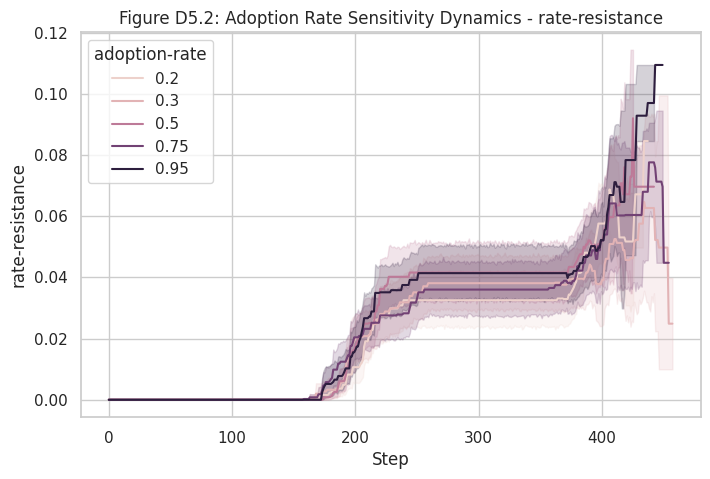

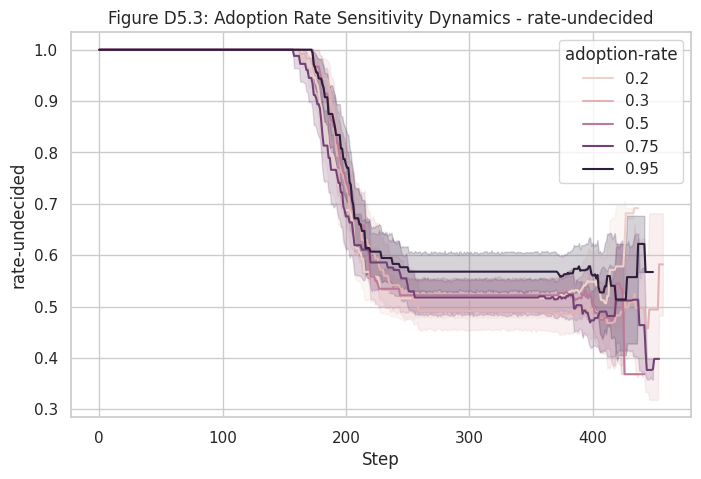

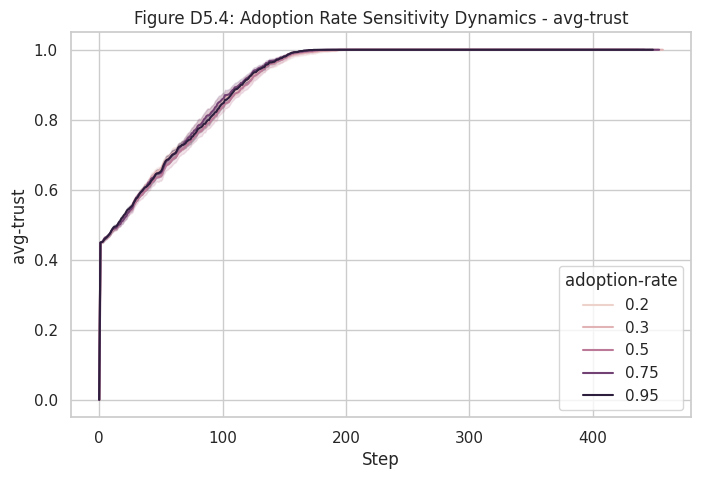

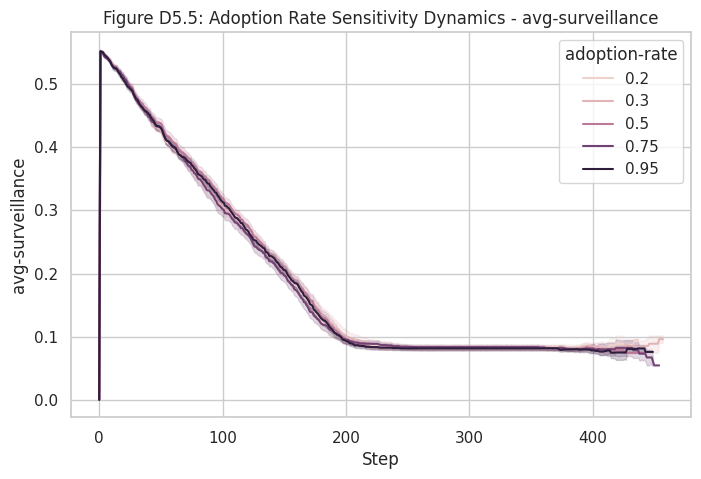

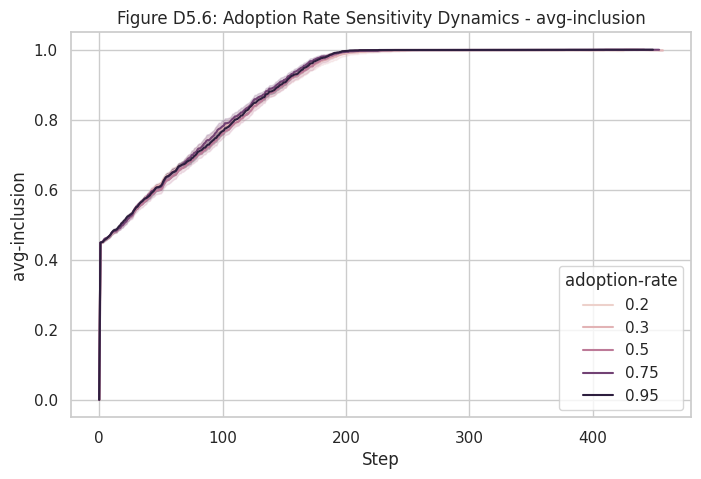

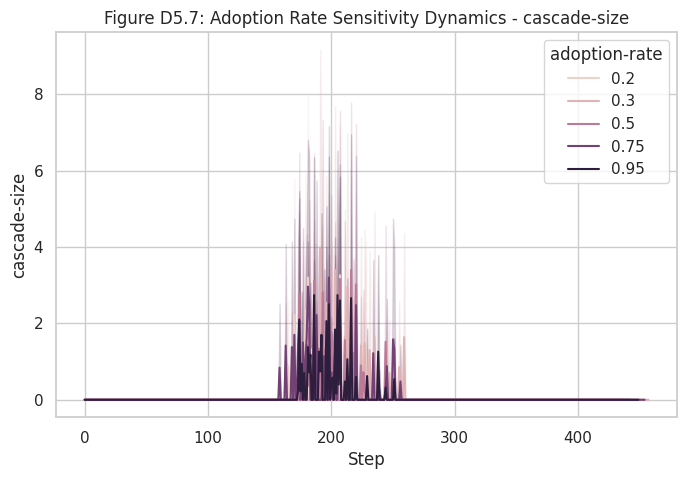

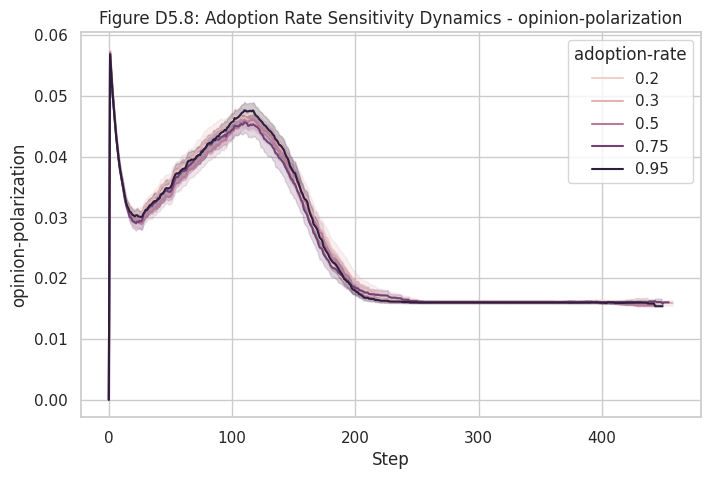

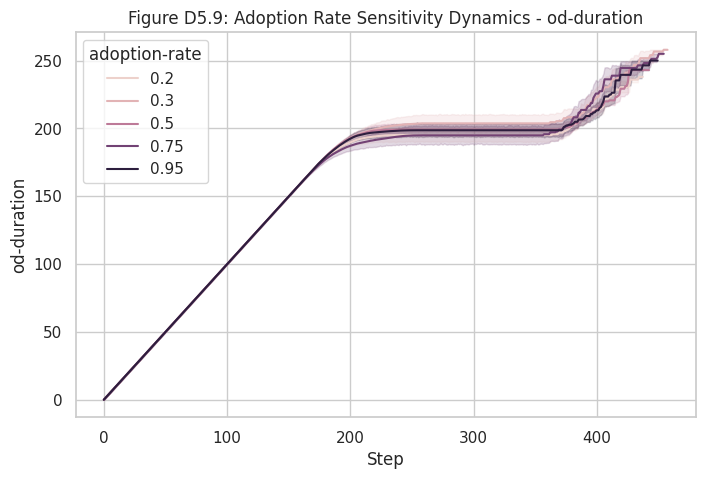

In [58]:
# Adoption Rate Sensitivity
plot_time_series(
    datasets['adoption_rate_sensitivity'],
    param='adoption-rate',
    metrics=['rate-enrollment', 'rate-resistance', 'rate-undecided',
            'avg-trust', 'avg-surveillance', 'avg-inclusion',
            'cascade-size', 'opinion-polarization', 'od-duration'],
    fig_prefix = 'D5',
    title='Adoption Rate Sensitivity Dynamics'
)

Shock robustness tests the impact of stochastic institutional shocks.
These runs incorporate random seeds to test how shocks affect resistance trajectories. The aim is to show whether patterns are sensitive to chance events or if they remain consistent.

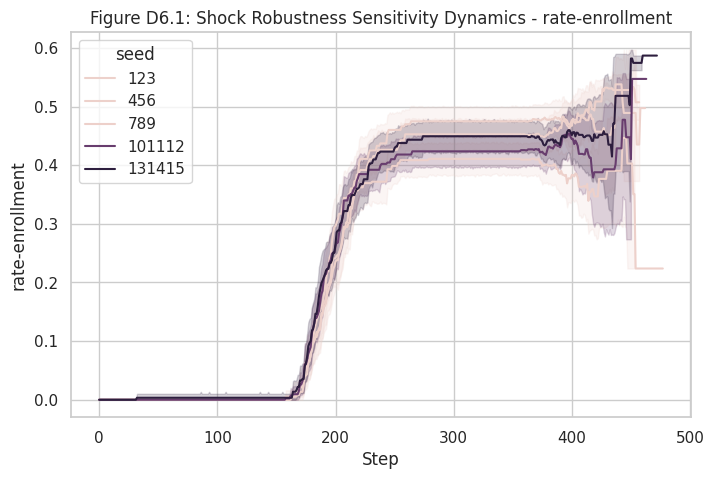

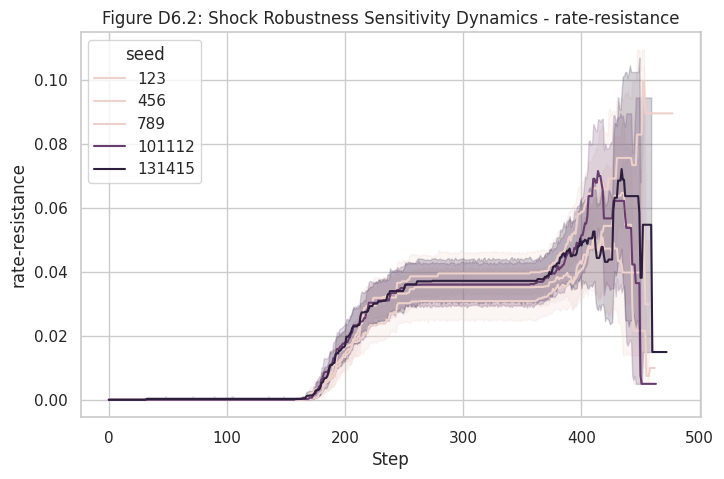

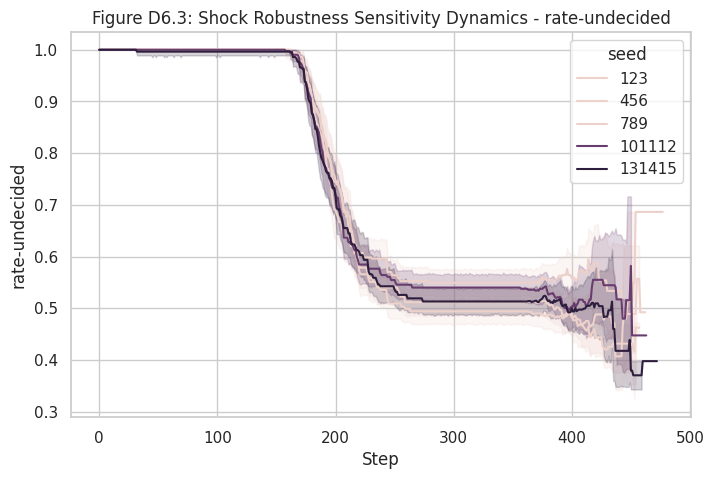

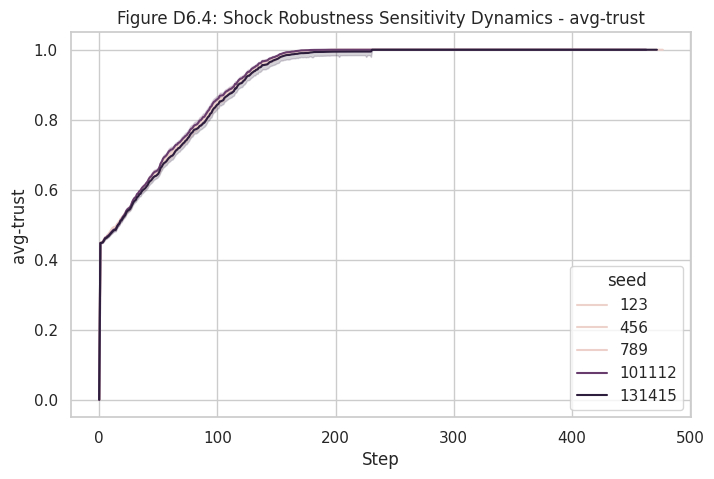

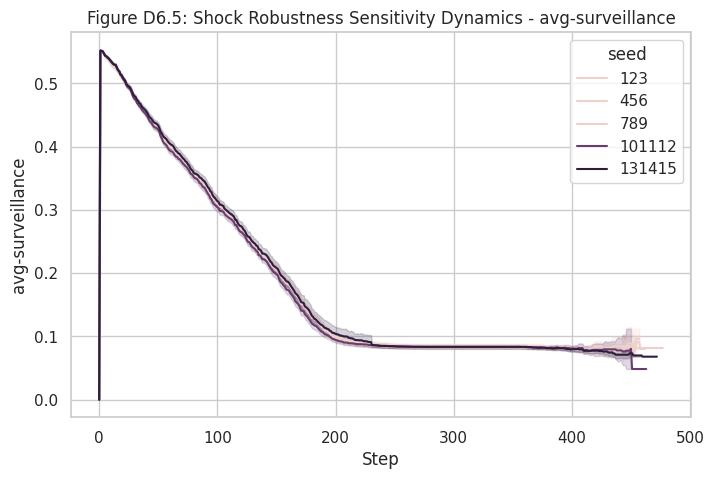

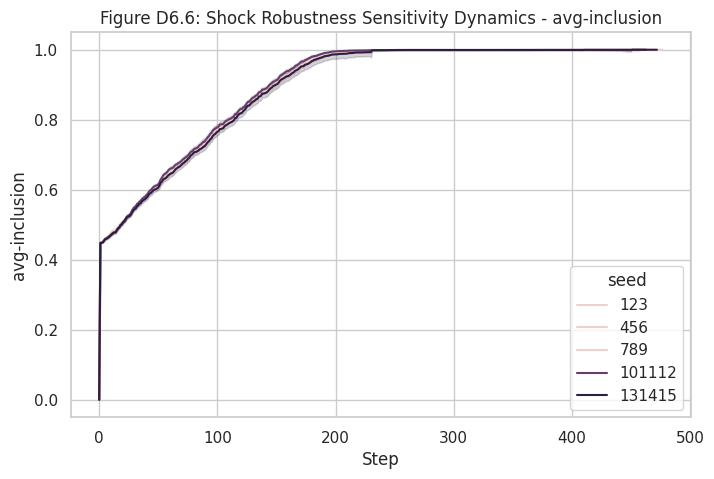

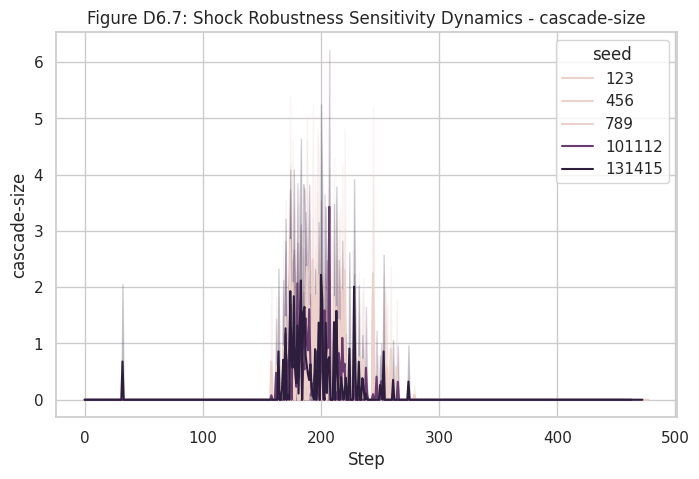

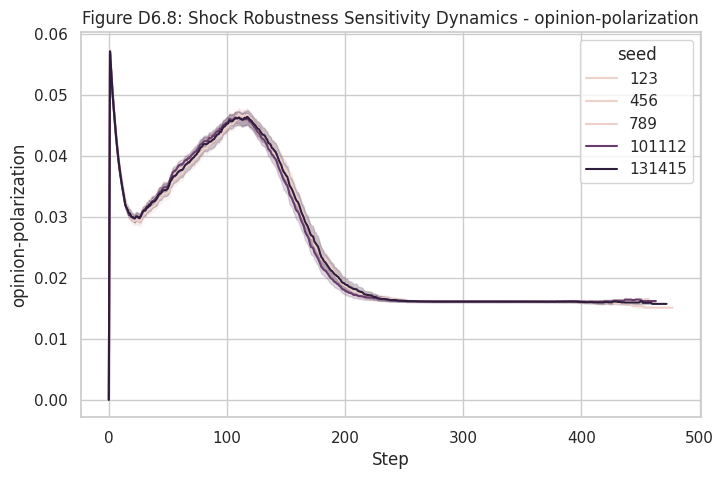

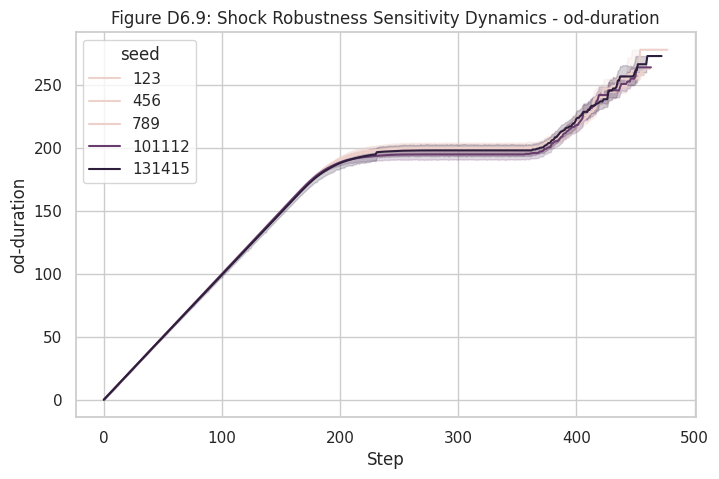

In [59]:
# Shock Robustness - checks for robustness to randomness across simulations.
plot_time_series(
    datasets['shock_robustness'],
    param='seed',
    metrics=['rate-enrollment', 'rate-resistance', 'rate-undecided',
            'avg-trust', 'avg-surveillance', 'avg-inclusion',
            'cascade-size', 'opinion-polarization', 'od-duration'],
    fig_prefix = 'D6',
    title='Shock Robustness Sensitivity Dynamics'
)

Sensitivity Ranking

This section provides a ranking for opinion/action state.
It summarises the relative influence of each parameter on the key outcomes.

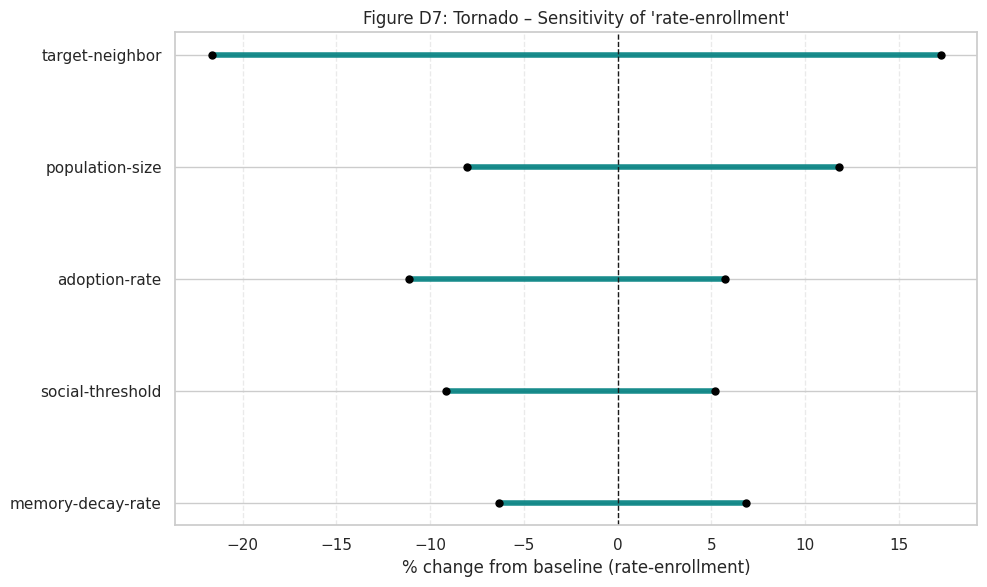

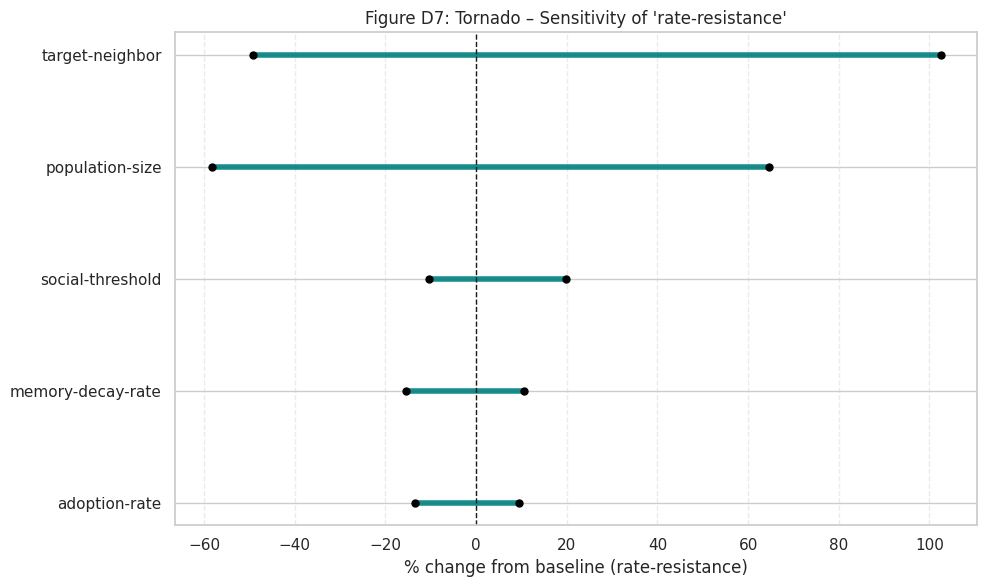

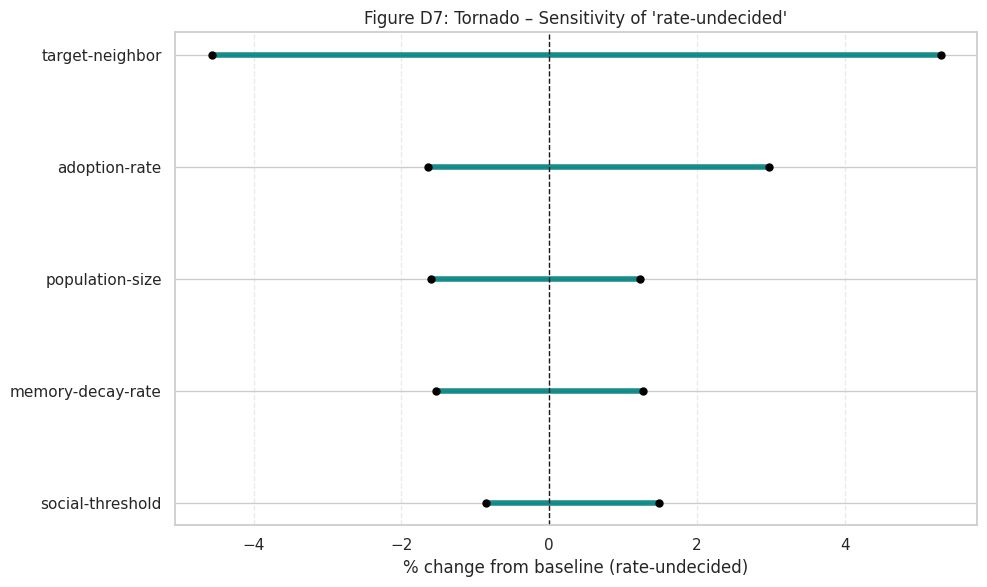

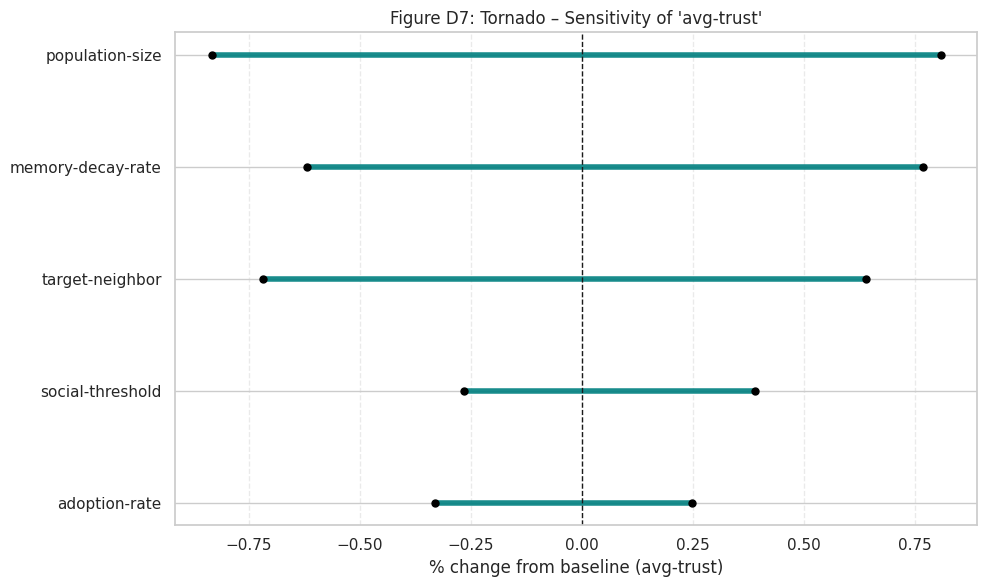

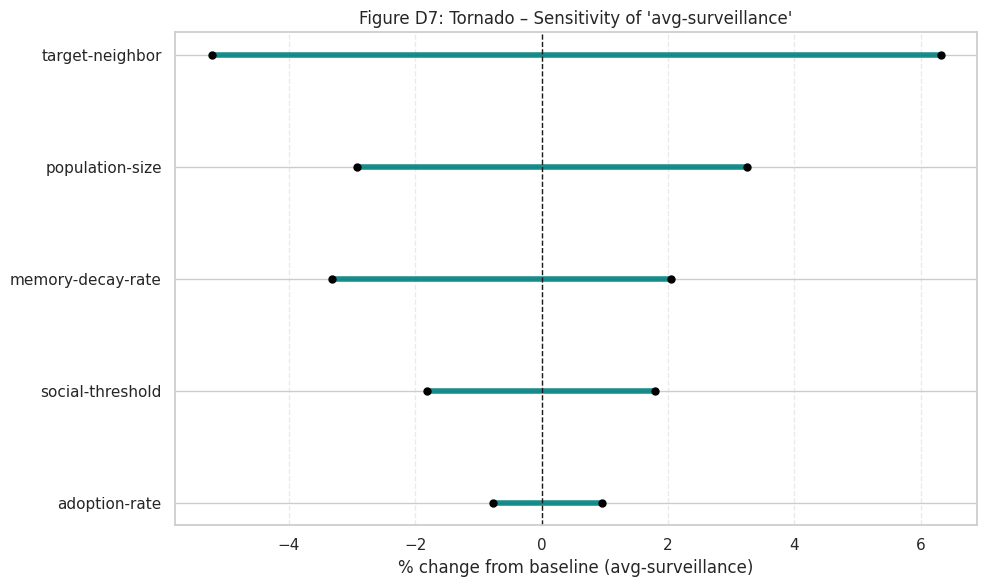

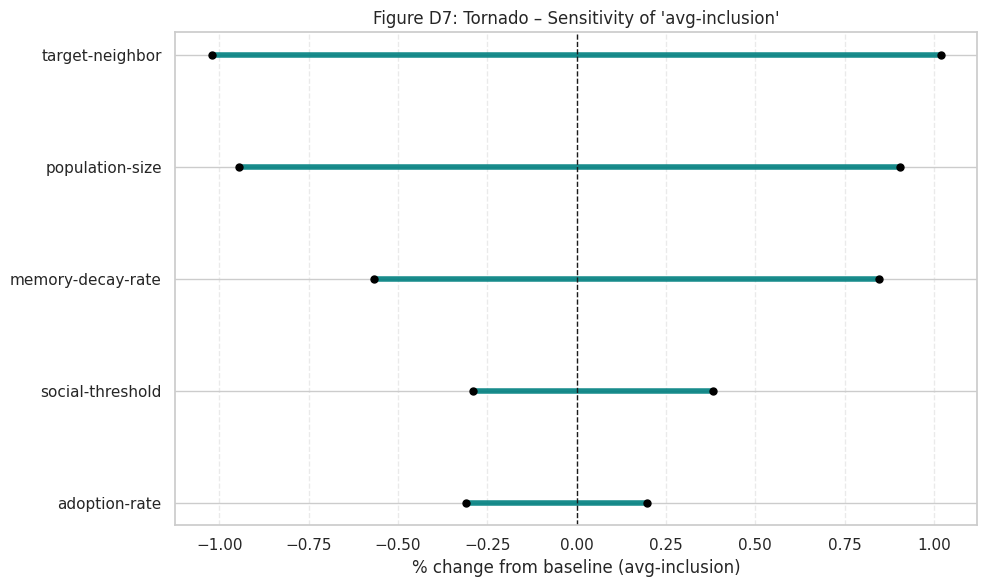

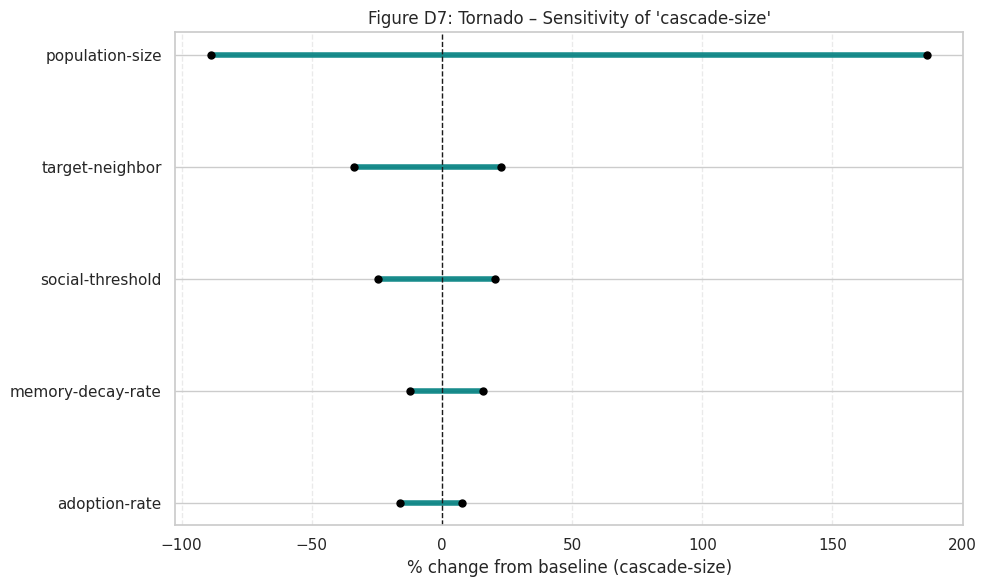

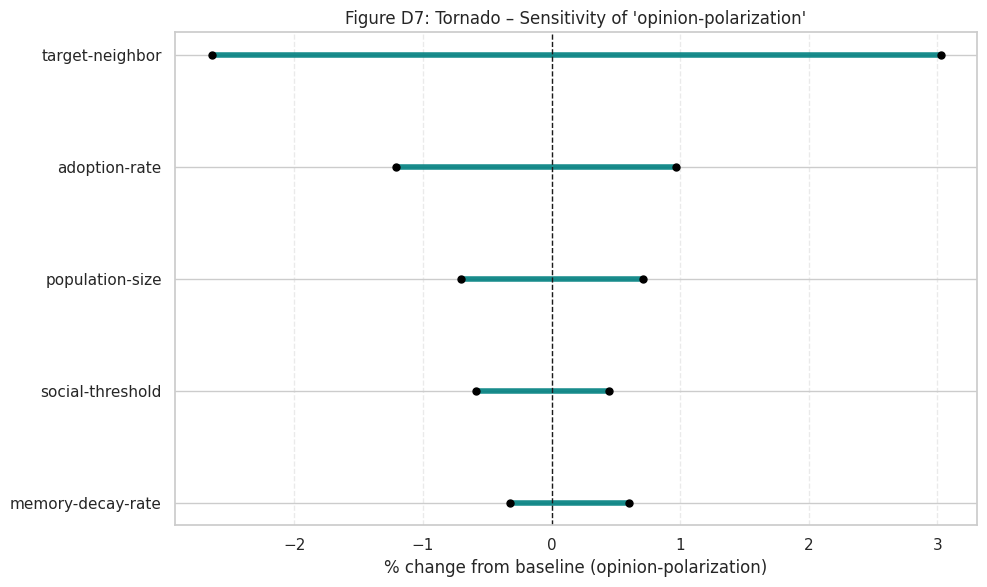

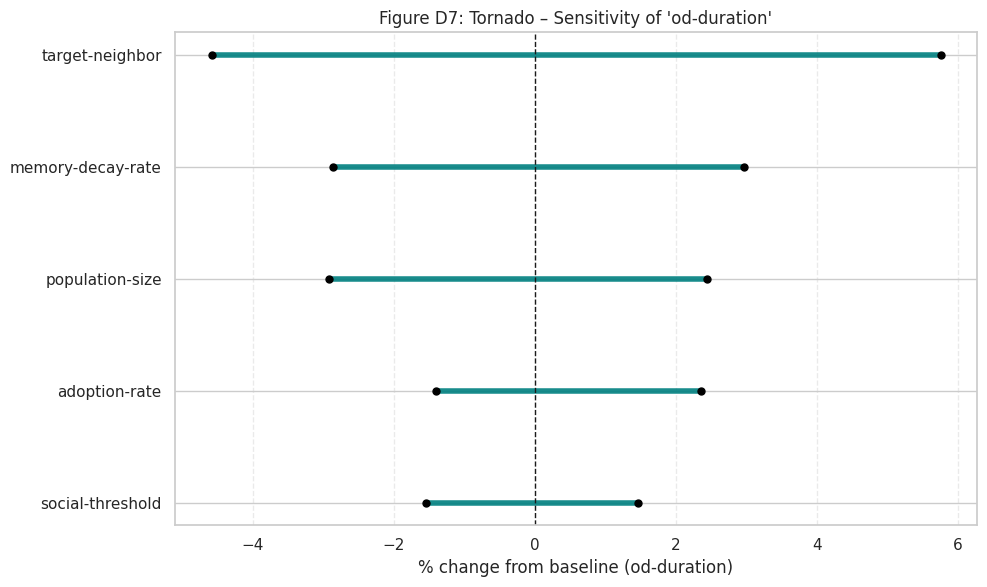

In [60]:
# Parameters and outcomes to test
sensitivity_experiments = {
    'population_sensitivity': 'population-size',
    'memory_sensitivity': 'memory-decay-rate',
    'network_sensitivity': 'target-neighbor',
    'threshold_sensitivity': 'social-threshold',
    'adoption_rate_sensitivity': 'adoption-rate'
}
outcome_metrics = [
    'rate-enrollment', 'rate-resistance', 'rate-undecided',
    'avg-trust', 'avg-surveillance', 'avg-inclusion',
    'cascade-size', 'opinion-polarization', 'od-duration'
]

percent_change = True

for outcome in outcome_metrics:
    rows = []
    for exp_name, param in sensitivity_experiments.items():
        df = datasets[exp_name]
        if df is None or param not in df.columns or outcome not in df.columns:
            continue

        g = df.groupby(param, dropna=True)[outcome].mean().reset_index()
        if g.empty:
            continue

        base = g[outcome].mean()
        lo   = g[outcome].min()
        hi   = g[outcome].max()

        if percent_change:
            denom = base if abs(base) > 1e-9 else 1.0
            lo_d = 100.0 * (lo - base) / denom
            hi_d = 100.0 * (hi - base) / denom
            xlab = f"% change from baseline ({outcome})"
        else:
            lo_d = lo - base
            hi_d = hi - base
            xlab = f"Δ from baseline: {outcome}"

        rows.append({'parameter': param, 'low_delta': lo_d, 'high_delta': hi_d,
                     'span': abs(hi_d - lo_d)})

    if not rows:
        continue

    tdf = pd.DataFrame(rows).sort_values('span', ascending=True).reset_index(drop=True)

    # plot as centered tornado
    plt.figure(figsize=(10, 6))
    y = range(len(tdf))
    for i, r in enumerate(tdf.itertuples()):
        xmin, xmax = min(r.low_delta, r.high_delta), max(r.low_delta, r.high_delta)
        plt.hlines(i, xmin, xmax, color='teal', lw=4, alpha=0.9)
        plt.plot([r.low_delta, r.high_delta], [i, i], 'o', color='black', ms=5)

    plt.yticks(y, tdf['parameter'])
    plt.axvline(0, color='k', ls='--', lw=1)
    plt.xlabel(xlab)
    plt.title(f"Figure D7: Tornado – Sensitivity of '{outcome}'")
    plt.grid(axis='x', linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()

Analyzing dataset: Population Sensitivity
Dataset shape: (106039, 25)
(Temporal) Using final time step...
Final data shape: (3053, 25)

Variables for correlation analysis: 12


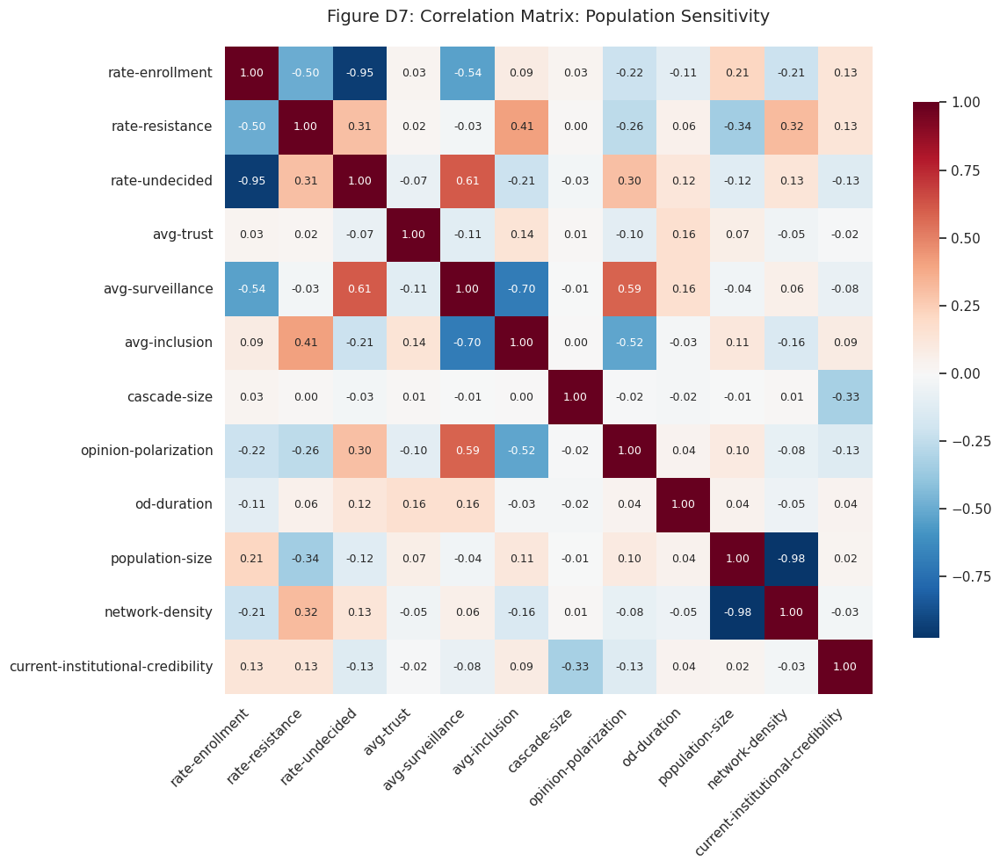


=== TOP 10 CORRELATIONS IN POPULATION SENSITIVITY ===
 1. population-size ↔ network-density: -0.976 (Strong negative)
 2. rate-enrollment ↔ rate-undecided: -0.946 (Strong negative)
 3. avg-surveillance ↔ avg-inclusion: -0.696 (Moderate negative)
 4. rate-undecided ↔ avg-surveillance: +0.609 (Moderate positive)
 5. avg-surveillance ↔ opinion-polarization: +0.590 (Moderate positive)
 6. rate-enrollment ↔ avg-surveillance: -0.538 (Moderate negative)
 7. avg-inclusion ↔ opinion-polarization: -0.524 (Moderate negative)
 8. rate-enrollment ↔ rate-resistance: -0.495 (Moderate negative)
 9. rate-resistance ↔ avg-inclusion: +0.408 (Moderate positive)
10. rate-resistance ↔ population-size: -0.344 (Weak negative)

Summary:
Variables analyzed: 12
Data points: 3053
Analyzing dataset: Memory Sensitivity
Dataset shape: (129436, 26)
(Temporal) Using final time step...
Final data shape: (3885, 26)
Skipping population-size - constant values

Variables for correlation analysis: 12


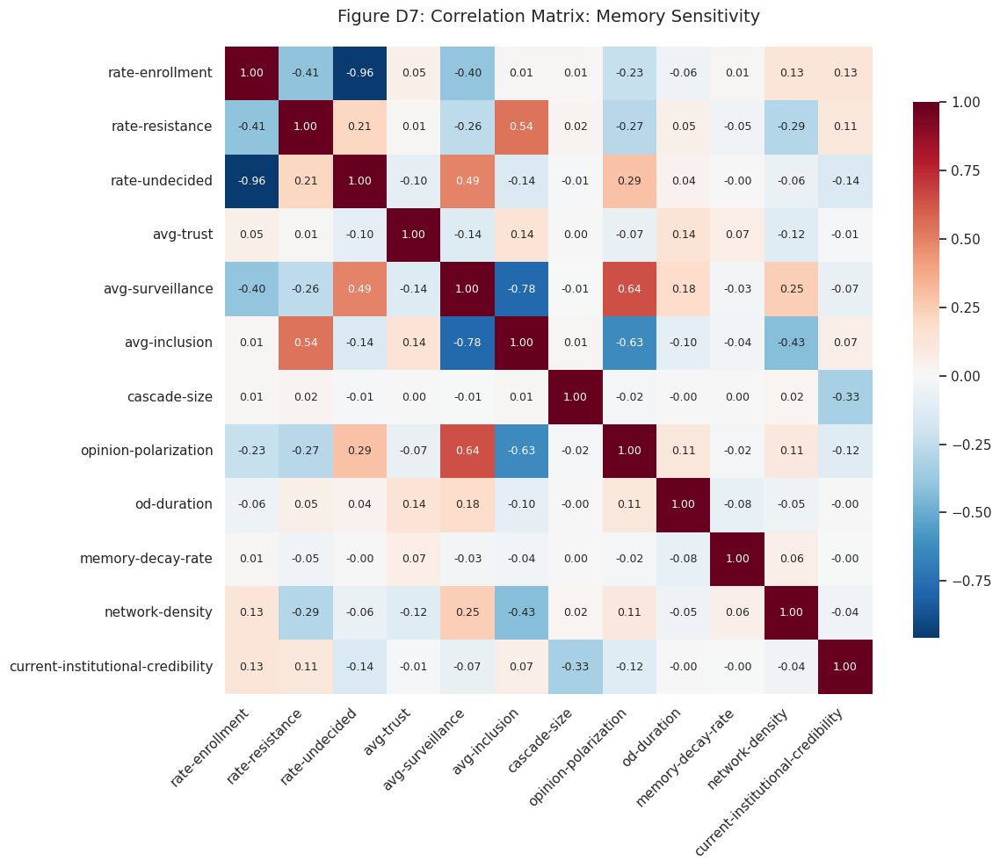


=== TOP 10 CORRELATIONS IN MEMORY SENSITIVITY ===
 1. rate-enrollment ↔ rate-undecided: -0.958 (Strong negative)
 2. avg-surveillance ↔ avg-inclusion: -0.777 (Strong negative)
 3. avg-surveillance ↔ opinion-polarization: +0.641 (Moderate positive)
 4. avg-inclusion ↔ opinion-polarization: -0.634 (Moderate negative)
 5. rate-resistance ↔ avg-inclusion: +0.541 (Moderate positive)
 6. rate-undecided ↔ avg-surveillance: +0.491 (Moderate positive)
 7. avg-inclusion ↔ network-density: -0.427 (Moderate negative)
 8. rate-enrollment ↔ rate-resistance: -0.405 (Moderate negative)
 9. rate-enrollment ↔ avg-surveillance: -0.397 (Weak negative)
10. cascade-size ↔ current-institutional-credibility: -0.327 (Weak negative)

Summary:
Variables analyzed: 12
Data points: 3885
Analyzing dataset: Network Sensitivity
Dataset shape: (103453, 26)
(Temporal) Using final time step...
Final data shape: (3621, 26)
Skipping population-size - constant values

Variables for correlation analysis: 12


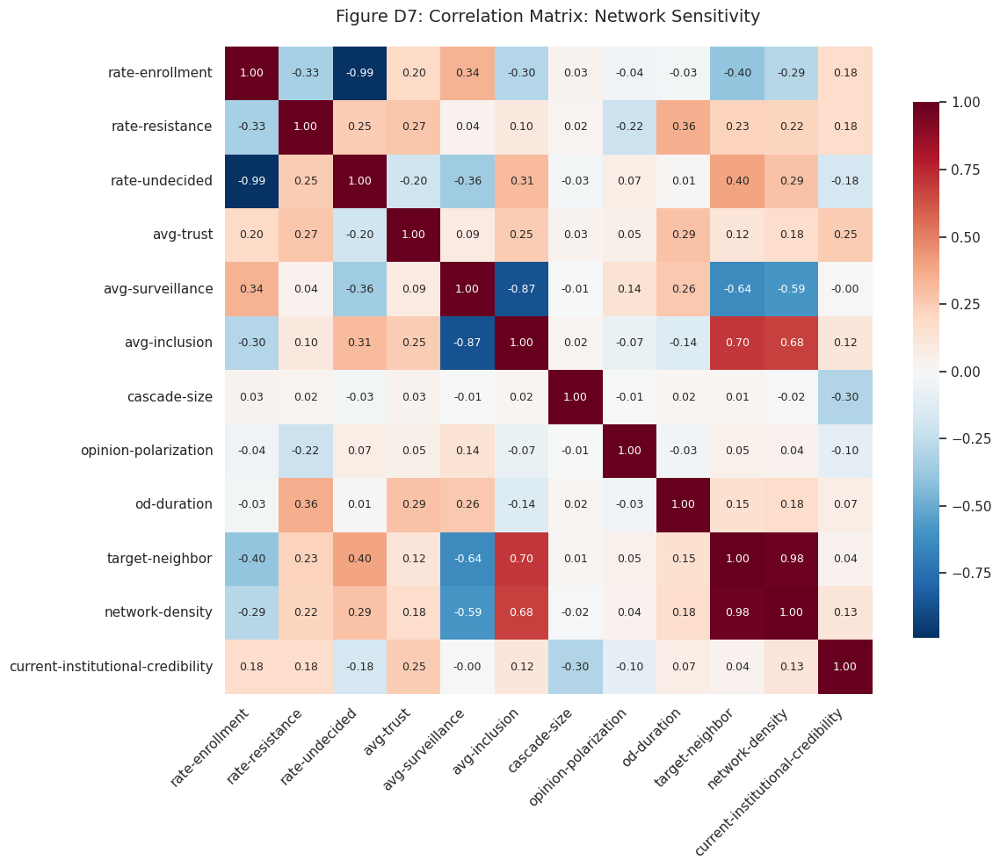


=== TOP 10 CORRELATIONS IN NETWORK SENSITIVITY ===
 1. rate-enrollment ↔ rate-undecided: -0.991 (Strong negative)
 2. target-neighbor ↔ network-density: +0.976 (Strong positive)
 3. avg-surveillance ↔ avg-inclusion: -0.873 (Strong negative)
 4. avg-inclusion ↔ target-neighbor: +0.700 (Strong positive)
 5. avg-inclusion ↔ network-density: +0.679 (Moderate positive)
 6. avg-surveillance ↔ target-neighbor: -0.636 (Moderate negative)
 7. avg-surveillance ↔ network-density: -0.589 (Moderate negative)
 8. rate-undecided ↔ target-neighbor: +0.398 (Weak positive)
 9. rate-enrollment ↔ target-neighbor: -0.398 (Weak negative)
10. rate-resistance ↔ od-duration: +0.361 (Weak positive)

Summary:
Variables analyzed: 12
Data points: 3621
Analyzing dataset: Threshold Sensitivity
Dataset shape: (150098, 26)
(Temporal) Using final time step...
Final data shape: (4236, 26)
Skipping avg-trust - constant values
Skipping population-size - constant values

Variables for correlation analysis: 11


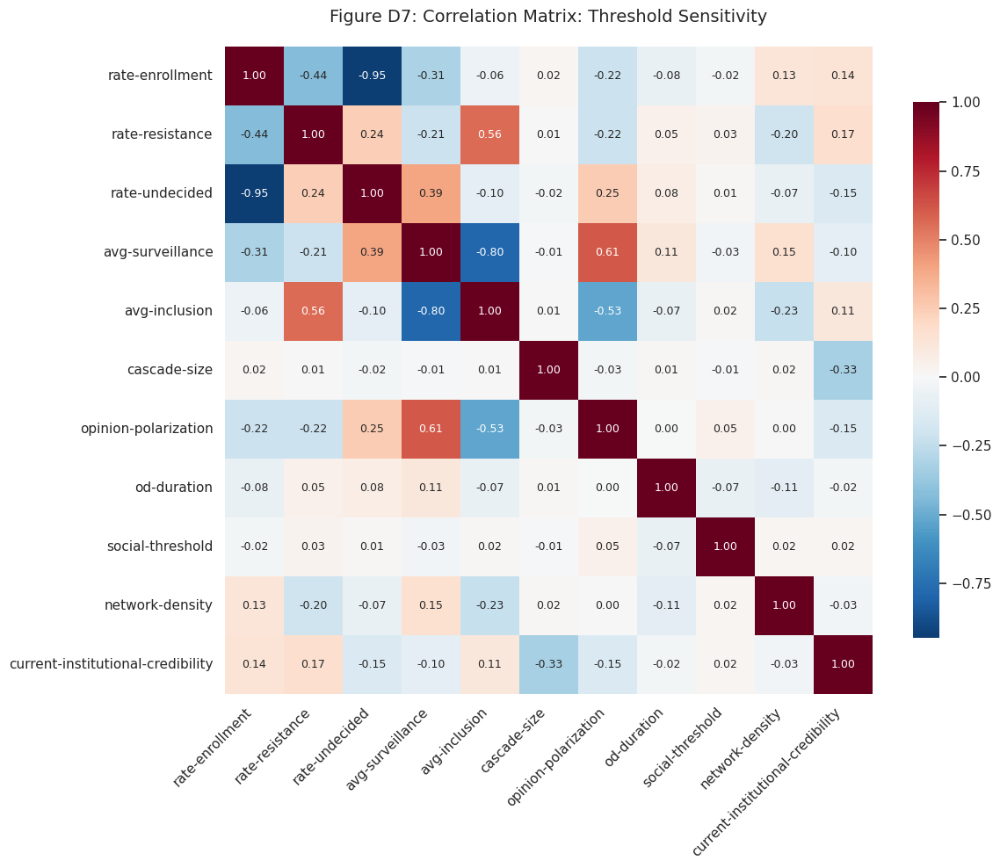


=== TOP 10 CORRELATIONS IN THRESHOLD SENSITIVITY ===
 1. rate-enrollment ↔ rate-undecided: -0.950 (Strong negative)
 2. avg-surveillance ↔ avg-inclusion: -0.795 (Strong negative)
 3. avg-surveillance ↔ opinion-polarization: +0.615 (Moderate positive)
 4. rate-resistance ↔ avg-inclusion: +0.564 (Moderate positive)
 5. avg-inclusion ↔ opinion-polarization: -0.531 (Moderate negative)
 6. rate-enrollment ↔ rate-resistance: -0.437 (Moderate negative)
 7. rate-undecided ↔ avg-surveillance: +0.395 (Weak positive)
 8. cascade-size ↔ current-institutional-credibility: -0.332 (Weak negative)
 9. rate-enrollment ↔ avg-surveillance: -0.312 (Weak negative)
10. rate-undecided ↔ opinion-polarization: +0.254 (Weak positive)

Summary:
Variables analyzed: 11
Data points: 4236
Analyzing dataset: Adoption Rate Sensitivity
Dataset shape: (99583, 24)
(Temporal) Using final time step...
Final data shape: (117, 24)
Skipping avg-trust - constant values
Skipping current-institutional-credibility - constant val

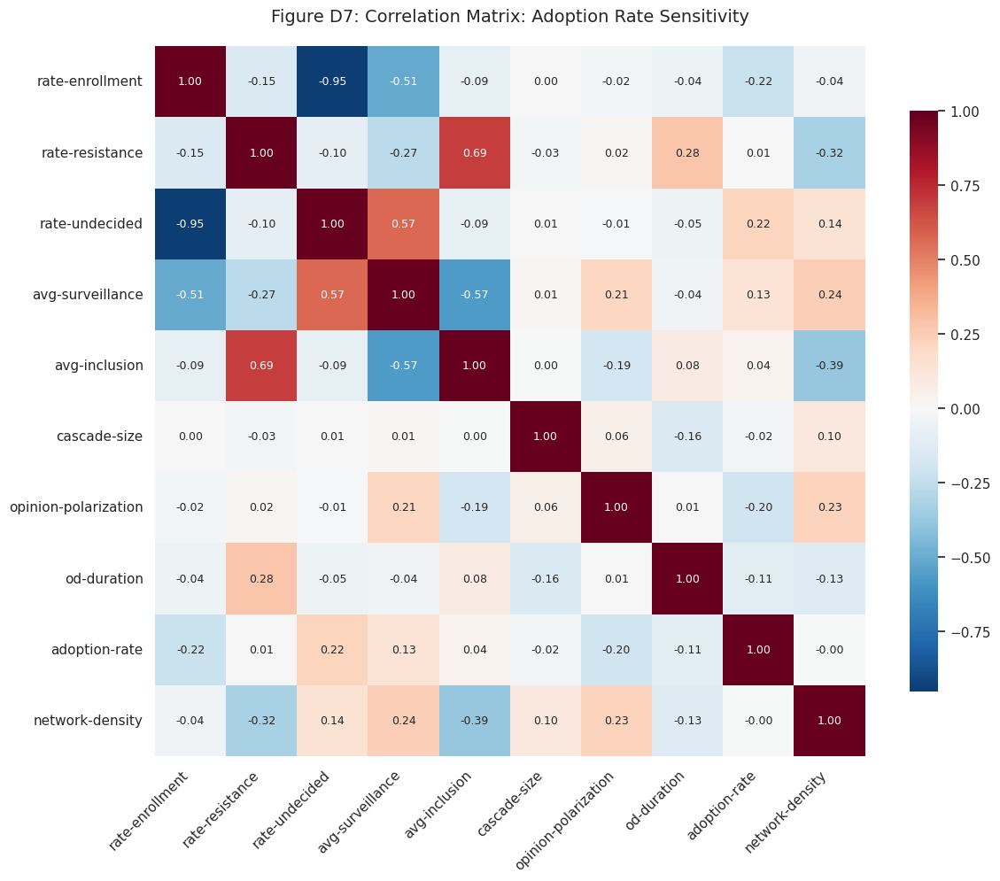


=== TOP 10 CORRELATIONS IN ADOPTION RATE SENSITIVITY ===
 1. rate-enrollment ↔ rate-undecided: -0.951 (Strong negative)
 2. rate-resistance ↔ avg-inclusion: +0.694 (Moderate positive)
 3. avg-surveillance ↔ avg-inclusion: -0.570 (Moderate negative)
 4. rate-undecided ↔ avg-surveillance: +0.569 (Moderate positive)
 5. rate-enrollment ↔ avg-surveillance: -0.514 (Moderate negative)
 6. avg-inclusion ↔ network-density: -0.387 (Weak negative)
 7. rate-resistance ↔ network-density: -0.323 (Weak negative)
 8. rate-resistance ↔ od-duration: +0.283 (Weak positive)
 9. rate-resistance ↔ avg-surveillance: -0.266 (Weak negative)
10. avg-surveillance ↔ network-density: +0.238 (Weak positive)

Summary:
Variables analyzed: 10
Data points: 117
Analyzing dataset: Shock Robustness
Dataset shape: (198941, 24)
(Temporal) Using final time step...
Final data shape: (123, 24)
Skipping avg-trust - constant values
Skipping current-institutional-credibility - constant values

Variables for correlation analysis

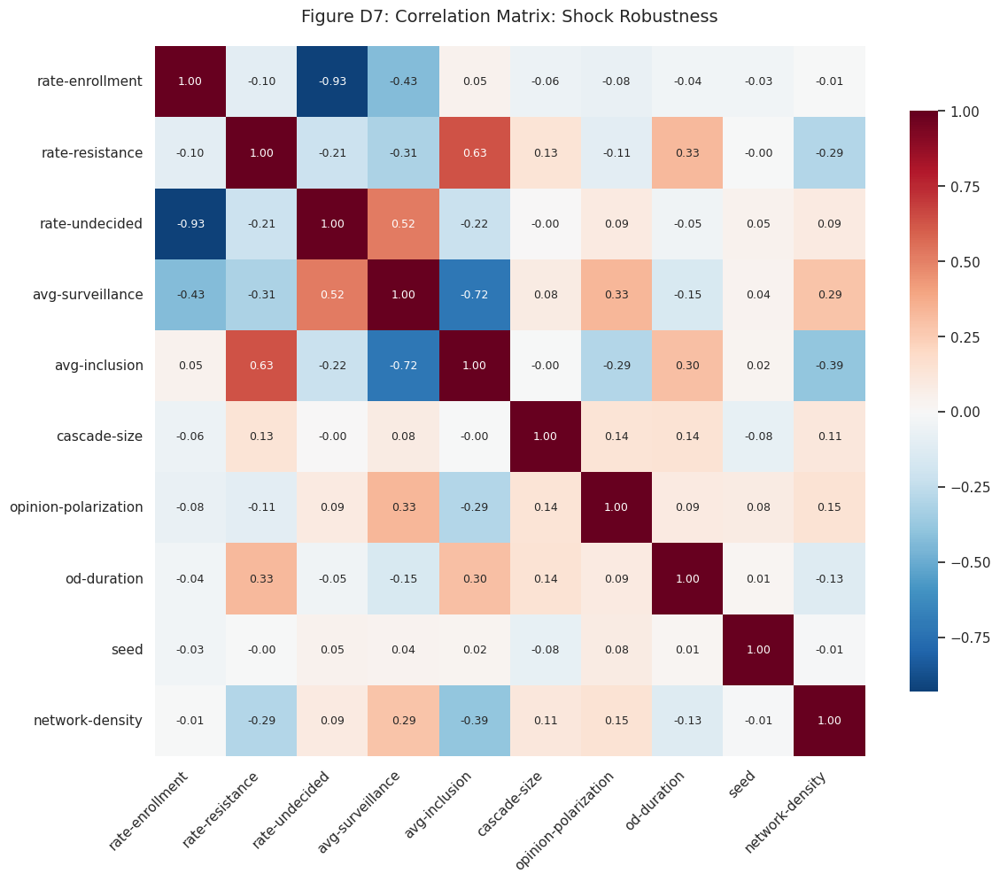


=== TOP 10 CORRELATIONS IN SHOCK ROBUSTNESS ===
 1. rate-enrollment ↔ rate-undecided: -0.930 (Strong negative)
 2. avg-surveillance ↔ avg-inclusion: -0.723 (Strong negative)
 3. rate-resistance ↔ avg-inclusion: +0.632 (Moderate positive)
 4. rate-undecided ↔ avg-surveillance: +0.520 (Moderate positive)
 5. rate-enrollment ↔ avg-surveillance: -0.431 (Moderate negative)
 6. avg-inclusion ↔ network-density: -0.391 (Weak negative)
 7. avg-surveillance ↔ opinion-polarization: +0.330 (Weak positive)
 8. rate-resistance ↔ od-duration: +0.325 (Weak positive)
 9. rate-resistance ↔ avg-surveillance: -0.312 (Weak negative)
10. avg-inclusion ↔ od-duration: +0.304 (Weak positive)

Summary:
Variables analyzed: 10
Data points: 123


,rate-enrollment,rate-resistance,rate-undecided,avg-surveillance,avg-inclusion,cascade-size,opinion-polarization,od-duration,seed,network-density
rate-enrollment,1.000000,-0.103528,-0.930246,-0.431179,0.047492,-0.059960,-0.077844,-0.040398,-0.034494,-0.007445
rate-resistance,-0.103528,1.000000,-0.210422,-0.312061,0.632355,0.134240,-0.106149,0.325451,-0.003964,-0.293470
rate-undecided,-0.930246,-0.210422,1.000000,0.520346,-0.223902,-0.000628,0.091779,-0.045134,0.049480,0.093223
avg-surveillance,-0.431179,-0.312061,0.520346,1.000000,-0.722676,0.080854,0.329752,-0.153647,0.035150,0.286458
avg-inclusion,0.047492,0.632355,-0.223902,-0.722676,1.000000,-0.003839,-0.289941,0.303634,0.023352,-0.391309
cascade-size,-0.059960,0.134240,-0.000628,0.080854,-0.003839,1.000000,0.138949,0.144321,-0.081511,0.111703
opinion-polarization,-0.077844,-0.106149,0.091779,0.329752,-0.289941,0.138949,1.000000,0.094257,0.080170,0.145415
od-duration,-0.040398,0.325451,-0.045134,-0.153647,0.303634,0.144321,0.094257,1.000000,0.013653,-0.125432
seed,-0.034494,-0.003964,0.049480,0.035150,0.023352,-0.081511,0.080170,0.013653,1.000000,-0.013608
network-density,-0.007445,-0.293470,0.093223,0.286458,-0.391309,0.111703,0.145415,-0.125432,-0.013608,1.000000


In [61]:
# @title
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def create_correlation_matrix(dataset, dataset_name, figsize=(12, 10), top_n=10):
    metrics_to_include = [
        'rate-enrollment', 'rate-resistance', 'rate-undecided',
        'avg-trust', 'avg-surveillance', 'avg-inclusion',
        'cascade-size', 'opinion-polarization', 'od-duration'
    ]
    potential_params = [
        'population-size', 'memory-decay-rate', 'target-neighbor',
        'social-threshold', 'adoption-rate', 'seed', 'network-density',
        'current-institutional-credibility', 'enforcement-severity'
    ]

    all_variables = metrics_to_include + potential_params

    print(f"Analyzing dataset: {dataset_name}")
    print(f"Dataset shape: {dataset.shape}")

    if 'step' in dataset.columns:
        print("(Temporal) Using final time step...")
        group_cols = [col for col in potential_params if col in dataset.columns]
        if 'run-number' in dataset.columns:
            group_cols.append('run-number')

        if group_cols:
            final_df = dataset.groupby(group_cols).last().reset_index()
        else:
            final_df = dataset[dataset['step'] == dataset['step'].max()].copy()
        print(f"Final data shape: {final_df.shape}")
    else:
        print("(Non-temporal) Using all rows...")
        final_df = dataset.copy()

    existing_variables = []
    for var in all_variables:
        if var in final_df.columns and final_df[var].dtype in ['int64', 'float64', 'float32', 'int32']:
            if final_df[var].nunique() > 1:
                existing_variables.append(var)
            else:
                print(f"Skipping {var} - constant values")
        elif var in final_df.columns:
            print(f"Skipping {var} - not numeric")

    print(f"\nVariables for correlation analysis: {len(existing_variables)}")

    if len(existing_variables) < 2:
        print("ERROR: Need at least 2 variables for correlation matrix!")
        return None

    corr_data = final_df[existing_variables]
    correlation_matrix = corr_data.corr(method='spearman')

    plt.figure(figsize=figsize)

    sns.heatmap(correlation_matrix,
                annot=True,
                cmap='RdBu_r',
                center=0,
                square=True,
                fmt='.2f',
                cbar_kws={'shrink': 0.8},
                annot_kws={'size': 9})

    plt.title(f'Figure D7: Correlation Matrix: {dataset_name.replace("_", " ").title()}',
              fontsize=14, pad=20)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    print(f"\n=== TOP {top_n} CORRELATIONS IN {dataset_name.upper()} ===")

    upper_triangle = correlation_matrix.where(
        np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)
    )

    all_corrs = []
    for i in range(len(upper_triangle.index)):
        for j in range(len(upper_triangle.columns)):
            if not np.isnan(upper_triangle.iloc[i, j]):
                all_corrs.append((
                    upper_triangle.index[i],
                    upper_triangle.columns[j],
                    upper_triangle.iloc[i, j]
                ))

    all_corrs.sort(key=lambda x: abs(x[2]), reverse=True)

    for i, (var1, var2, corr) in enumerate(all_corrs[:top_n]):
        strength = "Strong" if abs(corr) > 0.7 else "Moderate" if abs(corr) > 0.4 else "Weak"
        direction = "positive" if corr > 0 else "negative"
        print(f"{i+1:2d}. {var1} ↔ {var2}: {corr:+.3f} ({strength} {direction})")

    print(f"\nSummary:")
    print(f"Variables analyzed: {len(existing_variables)}")
    print(f"Data points: {len(corr_data)}")

    return correlation_matrix

# Population sensitivity
create_correlation_matrix(datasets['population_sensitivity'], 'Population Sensitivity')

# Memory sensitivity
create_correlation_matrix(datasets['memory_sensitivity'], 'Memory Sensitivity')

# Network sensitivity
create_correlation_matrix(datasets['network_sensitivity'], 'Network Sensitivity')

# Threshold sensitivity
create_correlation_matrix(datasets['threshold_sensitivity'], 'Threshold Sensitivity')

# Adoption rate sensitivity
create_correlation_matrix(datasets['adoption_rate_sensitivity'], 'Adoption Rate Sensitivity')

# Shock robustness
create_correlation_matrix(datasets['shock_robustness'], 'Shock Robustness')

All figures reflect the CSV exports loaded at the top of this notebook.  

No smoothing or rescaling is applied beyond axis formatting.  